In [1]:
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd 
import seaborn as sns 
import math
import random
from scipy.integrate import simps
from sklearn.manifold import TSNE
from scipy.integrate import simps
from scipy import stats
from datetime import datetime
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from statannot import add_stat_annotation
import scipy.signal
from scipy.stats import exponnorm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from lmfit.models import GaussianModel
from lmfit.models import GaussianModel,ExponentialGaussianModel,SkewedGaussianModel,VoigtModel,LorentzianModel,LognormalModel
from scipy.signal import savgol_filter, find_peaks, find_peaks_cwt
from scipy import sparse
from scipy.sparse.linalg import spsolve
import scipy
import pybaselines
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["font.family"] = "Arial"
sns.set(font_scale=2)
sns.set_style("white")

# Figure 2 Code 
This file was just used to generate plots for figure 2 C and figure 2D


In [27]:
#useful functions 

def make_entry(csv, sample_name,topfluor_normalization=1): 
    """
    Inputs: HPLC trace (csv), lipid class (string), genetic background (string),multiplier (to make visible int)
    and topfluor (an int representing the amount of topfluor in the sample that is used as a normalization control)
    Outputs: An array of dictionaries for each moment in the hplc trace 
    """
    hplc=[]
    area=0
    for row in csv.itertuples():
        area+=row[3]
    area=area/10000
    #iterates through the rows of the CSV and adds a dictionary entry for that time point 
    for row in csv.itertuples():
        #iterates through the rows of the CSV and adds a dictionary entry for that time point 
        if isinstance(row[3],str):
            hplc.append({"Time":row[1],"Value":float(row[3].replace(',',''))/topfluor_normalization, "Name":sample_name})
        else: 
            hplc.append({"Time":row[1],"Value":row[3]/area, "Name":sample_name})
              

    return hplc  
def model_n_voigt(x,y,number_peaks,min_number_peaks,peak_locations,peak_heights):
    """
    Inputs: x and y axises to be fitted, the number of peaks to create and the approximate peak locations 
    Outputs: Array of tuples (peak location, peak area)
    Prints: Summary graphs showing initial and final fit, and showing the locations of gaussian components 
    """
  
    #goes from max to min number of peaks, finds bic, removes smallest peak, repeat 
    model=''
    print(peak_heights)
    for n in range(0,number_peaks):
        gaus=LorentzianModel(prefix='p'+str(n)+"_")
        #addition of first model for first peak
        if model=='':
            model=gaus
            pars=gaus.make_params(prefix='p'+str(n)+"_")
            #peak locations can vary by 1 min 
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.5,max=peak_locations[n]+0.5)
            #sigma can only be so large and small 
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            #amplitude can only be so small to be a real peak 
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.0001,max=peak_heights[n]*1.1)
            #pars['p'+str(n)+'_gamma'].set(value=0.1)
        #all subsequent peaks    
        else:
            model+=gaus
            pars.update(gaus.make_params(prefix='p'+str(n)+"_"))
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.1,max=peak_locations[n]+0.1)
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.0001,max=peak_heights[n]*1.1)
            #pars['p'+str(n)+'_gamma'].set(value=1)
    #Uses gradient descent to best fit model 
    result = model.fit(y, pars, x=x)

    
        # plot results

    #intial fit 
    init = model.eval(pars, x=x)
    #to get best fit 
    out = model.fit(y, pars, x=x)

    comps=out.eval_components(x=x)
    areas=[]
    for n in range(0,number_peaks):
        area=(out.params['p'+str(n)+"_amplitude"].value*out.params['p'+str(n)+"_sigma"].value)/0.3989
        areas.append(area)





    min_ind=areas.index(min(areas))
    peak_locations = np.delete(peak_locations, min_ind)
    areas= np.delete(areas, min_ind)
    number_peaks-=1

    comps=out.eval_components(x=x) 
   
    fig, axes = plt.subplots(1, 1, figsize=(10, 10))
    #plots underlying data
    #axes[0].plot(x, y)
    #plots initial fit in orange with dashed line 
    #axes[0].plot(x, init, '--', label='initial fit')
    #plots best fit in green with solid line 
    #axes[0].plot(x, out.best_fit, '-', label='best fit')
    #axes[0].legend()

    #find the components of the best fit curve 
    #plots underlying data 
    axes.plot(x, y,color='r')
    
    areas=[]
    #plots each peak 
    for n in range(0,number_peaks+1):
        axes.plot(x, comps['p'+str(n)+"_"], '--', label='Gaussian component '+str(n),color='#e78ac3')
        axes.fill_between(x, comps['p'+str(n)+"_"].min(), comps['p'+str(n)+"_"], alpha=0.5,color='#e78ac3') 
        axes.plot(x, out.best_fit, '-', label='best fit',color='k')
        #axes.legend()
        axes.set_xlabel("Time (min)",size=30)
        axes.set_title("Voigt Fit",size=30)
        axes.set_ylabel("Peak Area (pA)",size=30) 
        #adds peak location on the actual output graph 
        #axes[1].text(out.params['p'+str(n)+"_center"].value, out.params['p'+str(n)+"_amplitude"].value+1, str(out.params['p'+str(n)+"_center"].value)[0:5], fontsize=8,horizontalalignment='center')
        #calculates the area which is amplitude(SD)/(1/sqrt(2*pi))
        area=sum(comps['p'+str(n)+"_"])*0.01
       
        error=0
        for a,b in zip(y,comps['p'+str(n)+"_"]):
           error+=(a-b)*(a-b)
        rmse=np.sqrt(error/(len(y)))
        print(rmse)
        center=out.params['p'+str(n)+"_center"].value
        areas.append([center,area,out.bic])
    
        #axes[1].legend()
    
    plt.show()
    return(areas)



def model_n_skewgaus(x,y,number_peaks,min_number_peaks,peak_locations,peak_heights):
    """
    Inputs: x and y axises to be fitted, the number of peaks to create and the approximate peak locations 
    Outputs: Array of tuples (peak location, peak area)
    Prints: Summary graphs showing initial and final fit, and showing the locations of gaussian components 
    """
  
    #goes from max to min number of peaks, finds bic, removes smallest peak, repeat 
    model=''
    print(peak_heights)
    for n in range(0,number_peaks):
        gaus=SkewedGaussianModel(prefix='p'+str(n)+"_")
        #addition of first model for first peak
        if model=='':
            model=gaus
            pars=gaus.make_params(prefix='p'+str(n)+"_")
            #peak locations can vary by 1 min 
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.5,max=peak_locations[n]+0.5)
            #sigma can only be so large and small 
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            #amplitude can only be so small to be a real peak 
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.0001,max=peak_heights[n]*1.1)
            pars['p'+str(n)+'_gamma'].set(value=1,max=3,min=0.0001)
        #all subsequent peaks    
        else:
            model+=gaus
            pars.update(gaus.make_params(prefix='p'+str(n)+"_"))
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.5,max=peak_locations[n]+0.5)
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.0001,max=peak_heights[n]*1.1)
            pars['p'+str(n)+'_gamma'].set(value=1,max=3,min=0.0001)
    #Uses gradient descent to best fit model 
    result = model.fit(y, pars, x=x)

    
        # plot results

    #intial fit 
    init = model.eval(pars, x=x)
    #to get best fit 
    out = model.fit(y, pars, x=x)

    comps=out.eval_components(x=x)
    areas=[]
    for n in range(0,number_peaks):
        area=sum(comps['p'+str(n)+"_"])*0.01
        areas.append(area)





    min_ind=areas.index(min(areas))
    peak_locations = np.delete(peak_locations, min_ind)
    areas= np.delete(areas, min_ind)
    number_peaks-=1

     
    plt.style.use("fast")
    fig, axes = plt.subplots(1, 1, figsize=(10, 10))
    
    #plots underlying data
    #ax.plot(x, y)
    #fig, axes = plt.subplots(1, 2, figsize=(12.8, 4.8))
    #plots initial fit in orange with dashed line 
    #axes[0].plot(x, init, '--', label='initial fit')
    #plots best fit in green with solid line 
    #ax.plot(x, out.best_fit, '-', label='best fit',linewidth=3)
    #ax.legend()

    #find the components of the best fit curve 
    #plots underlying data 
    
    axes.plot(x, y,color='r')
    areas=[]
    #plots each peak 
    for n in range(0,number_peaks+1):
        axes.plot(x, comps['p'+str(n)+"_"], '--', label='Gaussian component '+str(n),color='#8da0cb')
        axes.fill_between(x, comps['p'+str(n)+"_"].min(), comps['p'+str(n)+"_"], alpha=0.5,color='#8da0cb') 
        axes.plot(x, out.best_fit, '-', label='best fit',color='k')
        #axes.legend()
        axes.set_xlabel("Time (min)",size=30)
        axes.set_title("Skew Gaussian Fit",size=30)
        axes.set_ylabel("Peak Area (pA)",size=30)
        #adds peak location on the actual output graph 
        #ax.text(out.params['p'+str(n)+"_center"].value, out.params['p'+str(n)+"_amplitude"].value+1, str(out.params['p'+str(n)+"_center"].value)[0:5], fontsize=8,horizontalalignment='center')
        #calculates the area which is amplitude(SD)/(1/sqrt(2*pi))
        area=sum(comps['p'+str(n)+"_"])*0.01
        error=0
        for a,b in zip(y,comps['p'+str(n)+"_"]):
           error+=(a-b)*(a-b)
        rmse=np.sqrt(error/(len(y)))
        print(rmse)
        center=out.params['p'+str(n)+"_center"].value
        areas.append([center,area,out.bic])
    
        #axes[1].legend()
    
    plt.show()
    return(areas)




def model_n_expgaus(x,y,number_peaks,min_number_peaks,peak_locations,peak_heights):
    """
    Inputs: x and y axises to be fitted, the number of peaks to create and the approximate peak locations 
    Outputs: Array of tuples (peak location, peak area)
    Prints: Summary graphs showing initial and final fit, and showing the locations of gaussian components 
    """
  
    #goes from max to min number of peaks, finds bic, removes smallest peak, repeat 
    model=''
    print(peak_heights)
    for n in range(0,number_peaks):
        gaus=ExponentialGaussianModel(prefix='p'+str(n)+"_")
        #addition of first model for first peak
        if model=='':
            model=gaus
            pars=gaus.make_params(prefix='p'+str(n)+"_")
            #peak locations can vary by 1 min 
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.5,max=peak_locations[n]+0.5)
            #sigma can only be so large and small 
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            #amplitude can only be so small to be a real peak 
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.001,max=peak_heights[n]*1.1)
            pars['p'+str(n)+'_gamma'].set(value=1,max=3,min=0.0001)
        #all subsequent peaks    
        else:
            model+=gaus
            pars.update(gaus.make_params(prefix='p'+str(n)+"_"))
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.5,max=peak_locations[n]+0.5)
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.0001,max=1)
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n], min=0.001,max=peak_heights[n]*1.1)
            pars['p'+str(n)+'_gamma'].set(value=1,max=3,min=0.0001)
    #Uses gradient descent to best fit model 
    result = model.fit(y, pars, x=x)



    # plot results

    #intial fit 
    init = model.eval(pars, x=x)
    #to get best fit 
    out = model.fit(y, pars, x=x)

    comps=out.eval_components(x=x) 
    areas=[]
    for n in range(0,number_peaks):
        area=sum(comps['p'+str(n)+"_"])*0.01
        areas.append(area)





    min_ind=areas.index(min(areas))
    peak_locations = np.delete(peak_locations, min_ind)
    areas= np.delete(areas, min_ind)
    number_peaks-=1

    
   
    fig, axes = plt.subplots(1, 1, figsize=(10,10))

    axes.set_xlabel('Time (min)')
    axes.set_ylabel('Peak Area (pA)')
    #plots underlying data
    #axes[0].plot(x, y)
    #plots initial fit in orange with dashed line 
    #axes[0].plot(x, init, '--', label='initial fit')
    #plots best fit in green with solid line 
    #axes.plot(x, out.best_fit, '-', label='best fit')
    #axes[1].plot(x, out.best_fit, '-', label='best fit')
    #axes.legend()

    #find the components of the best fit curve 
    #plots underlying data 
    plt.style.use("fast")
    axes.plot(x, y,color='r')
    areas=[]
    #plots each peak 
    for n in range(0,number_peaks+1):
        sns.set_style("ticks")
        axes.plot(x, comps['p'+str(n)+"_"], '--', label='Gaussian component '+str(n),color='#fc8d62')
        axes.fill_between(x, comps['p'+str(n)+"_"].min(), comps['p'+str(n)+"_"], alpha=0.5,color='#fc8d62') 
        axes.plot(x, out.best_fit, '-', label='best fit',color='k')
        #axes.legend()
        axes.set_xlabel("Time (min)",size=30)
        axes.set_title("Exponential Gaussian Fit",size=30)
        axes.set_ylabel("Peak Area (pA)",size=30)
        #adds peak location on the actual output graph 
        #axes[1].text(out.params['p'+str(n)+"_center"].value, out.params['p'+str(n)+"_amplitude"].value+1, str(out.params['p'+str(n)+"_center"].value)[0:5], fontsize=8,horizontalalignment='center')
        #calculates the area which is amplitude(SD)/(1/sqrt(2*pi))
        area=sum(comps['p'+str(n)+"_"])*0.01
        area=sum(comps['p'+str(n)+"_"])*0.01
        error=0
        for a,b in zip(y,comps['p'+str(n)+"_"]):
           error+=(a-b)*(a-b)
        rmse=np.sqrt(error/(len(y)))
        print(rmse)
        center=out.params['p'+str(n)+"_center"].value
        areas.append([center,area,out.bic])
    
        #axes[1].legend()
    
    plt.show()
    return(areas)





def model_n_gaussians(x,y,number_peaks,min_number_peaks,peak_locations,peak_heights):
    """
    Inputs: x and y axises to be fitted, the number of peaks to create and the approximate peak locations 
    Outputs: Array of tuples (peak location, peak area)
    Prints: Summary graphs showing initial and final fit, and showing the locations of gaussian components 
    """
  
    #goes from max to min number of peaks, finds bic, removes smallest peak, repeat 
    model=''
    print(peak_heights)
    for n in range(0,number_peaks):
        gaus=GaussianModel(prefix='p'+str(n)+"_")
        #addition of first model for first peak
        if model=='':
            model=gaus
            pars=gaus.make_params(prefix='p'+str(n)+"_")
            #peak locations can vary by 1 min 
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.1,max=peak_locations[n]+0.1)
            #sigma can only be so large and small 
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.001,max=1)
            #amplitude can only be so small to be a real peak 
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n]*0.1, min=0.00001,max=peak_heights[n]*1.1)
        #all subsequent peaks    
        else:
            model+=gaus
            pars.update(gaus.make_params(prefix='p'+str(n)+"_"))
            pars['p'+str(n)+'_center'].set(value=peak_locations[n],min=peak_locations[n]-0.1,max=peak_locations[n]+0.1)
            pars['p'+str(n)+'_sigma'].set(value=0.05, min=0.00001,max=1)
            pars['p'+str(n)+'_amplitude'].set(value=peak_heights[n]*0.1, min=0.00001,max=peak_heights[n]*1.1)
    #Uses gradient descent to best fit model 
    result = model.fit(y, pars, x=x)



    # plot results

    #intial fit 
    #init = model.eval(pars, x=x)
    #to get best fit 
    out = model.fit(y, pars, x=x)
    print(out.bic)
    comps=out.eval_components(x=x) 
    areas=[]
    for n in range(0,number_peaks):
        area=sum(comps['p'+str(n)+"_"])*0.01
        areas.append(area)


    print(out.bic)


    min_ind=areas.index(min(areas))
    peak_locations = np.delete(peak_locations, min_ind)
    areas= np.delete(areas, min_ind)
    number_peaks-=1

    
   
    fig, axes = plt.subplots(1, 1, figsize=(10, 10))
    
    axes.set_xlabel('Time (min)')
    axes.set_ylabel('Peak Area (pA)')
    #plots underlying data
    #axes[0].plot(x, y)
    #plots initial fit in orange with dashed line 
    #axes[0].plot(x, init, '--', label='initial fit')
    #plots best fit in green with solid line 
    #axes[0].plot(x, out.best_fit, '-', label='best fit')
    #axes[0].legend()


    #find the components of the best fit curve 
    #plots underlying data 
    axes.plot(x, y,color='r')
    areas=[]
    #plots each peak 
    for n in range(0,number_peaks+1):
        sns.set_style("ticks")
        axes.plot(x, comps['p'+str(n)+"_"], '--', label='Gaussian component '+str(n),color='#66c2a5')
        axes.fill_between(x, comps['p'+str(n)+"_"].min(), comps['p'+str(n)+"_"], alpha=0.5,color='#66c2a5') 
        axes.plot(x, out.best_fit, '-', label='best fit',color='k')
        #axes.legend()
        axes.set_xlabel("Time (min)",size=30)
        axes.set_title("Gaussian Fit",size=30)
        axes.set_ylabel("Peak Area (pA)",size=30)
        area=sum(comps['p'+str(n)+"_"])*0.01
        error=0
        for a,b in zip(y,comps['p'+str(n)+"_"]):
           error+=(a-b)*(a-b)
        rmse=np.sqrt(error/(len(y)))
        print(rmse)
        center=out.params['p'+str(n)+"_center"].value
        areas.append([center,area,out.bic])
    
        #axes[1].legend()
    
    plt.show()
    return(areas)
def merge_peaks(peak_list,shoulder_list):
    merged_list=[]
    for peak in peak_list:
        merged_list.append(peak)
    for peak in shoulder_list:
        include=True
        for peak2 in peak_list:
            if abs(peak-peak2)<150:
                include=False
        if include:
            merged_list.append(peak)
    merged_list = np.delete(merged_list, np.argwhere(np.ediff1d(merged_list) <= 150)+1)
    return merged_list

def find_locations_peaks(data,peak_prominence_cutoff,height_cutoff):
    """
    Inputs: Data for the HPLC trace, prominence cut off for when peaks should be accepted 
    Outputs: Approximate Peak locations 
    """
    #Use peaks from the first derivative to find putative peak locations 
    #Can we improve on this? (Use 0th derivative to find real peaks and first derivative to find shoulders)
    
    #Finds time averaged derivative
    data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
    fig,ax=plt.subplots(1,1,figsize=(15,5))
    #plots derivative 
    sns.lineplot(x=data['Time'], y=data['Smoothed'], label='Smoothed',ax=ax)
    data["Inverse Smoothed"]=data['Smoothed']*-1+50
    #sns.lineplot(x=data['Time'], y=data['Time_Ave'], label='Time Averaged First Derivative',ax=ax[1])
    #finds peaks from the time averaged derivative. These are really inflection points not actually peaks, but this
    #method will correctly identify shoulders
    #finds real peaks 
    peaks = find_peaks(data['Smoothed'],prominence=peak_prominence_cutoff,height=height_cutoff)[0]
    valleys = find_peaks(data['Inverse Smoothed'],prominence=peak_prominence_cutoff,height=height_cutoff)[0]
   

    #plots IDed peaks on the first derivative plot (or normal plot)
    
    sns.scatterplot(x=data["Time"].values[peaks], y=data["Smoothed"].values[peaks], s = 55,
             label = 'Peak Centers',ax=ax)
    """
    sns.scatterplot(x=data["Time"].values[valleys], y=data["Smoothed"].values[valleys], s = 55,
             label = 'Valleys',ax=ax)
    plt.show()
    """
    times=data["Time"].values[peaks]
    valley_times=data["Time"].values[valleys]
    heights=data["Value"].values[peaks]
    #converts reference peaks into the time domain (rather than index )
    return times,heights,valley_times
def find_peak_areas(database,start,end,genotype,canonical_peaks=None):
    #reduces the dataframe to a single replicate 
    single_rep=hplc.loc[(hplc.Name==name)]
    #finds peaks 
    if canonical_peaks is None:
        times,heights,valleys=find_locations_peaks(single_rep.loc[(single_rep['Time']>=start) & (single_rep['Time']<end)],0.1,1)
    else:
        reference_peak_list=canonical_peaks
    #x and y for gaussian modeling 
    x=single_rep.loc[(single_rep['Time']>=start) & (single_rep['Time']<end)]['Time']
    y=single_rep.loc[(single_rep['Time']>=start) & (single_rep['Time']<=end)]['Value']
    ground_truth=sum(single_rep.loc[(single_rep['Time']>=start) & (single_rep['Time']<=end)]['Value'])
    #gaussian models each peak 
    
    print("Gaussian")
    areas=model_n_gaussians(x,y,len(times),len(times),times,heights)
    
    print("Exp Gaussian")
    areas2=model_n_expgaus(x,y,len(times),len(times),times,heights)
    print("Skew Gaussian")
    areas3=model_n_skewgaus(x,y,len(times),len(times),times,heights)
    print("Voigt")
    areas4=model_n_voigt(x,y,len(times),len(times),times,heights)
    return areas,areas2,areas3,areas4


In [28]:
#import raw text files 


ara_alone10=pd.read_csv("injections_too_close_data/6_9_23_injection/10_0_0_09_CAD_1.txt",skiprows=range(0, 42),sep="\t")
ara_alone5=pd.read_csv("injections_too_close_data/6_9_23_injection/5_0_0_10_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone10=pd.read_csv("injections_too_close_data/6_9_23_injection/0_10_0_08_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone5=pd.read_csv("injections_too_close_data/6_9_23_injection/0_5_0_05_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone10=pd.read_csv("injections_too_close_data/6_9_23_injection/0_0_10_06_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone5=pd.read_csv("injections_too_close_data/6_9_23_injection/0_0_5_07_CAD_1.txt",skiprows=range(0, 42),sep="\t")

ara_alone10_2=pd.read_csv("injections_too_close_data/1_2_24_injection/1_0_0_03_CAD_1.txt",skiprows=range(0, 42),sep="\t")
ara_alone5_2=pd.read_csv("injections_too_close_data/1_2_24_injection/0.5_0_0_02_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone10_2=pd.read_csv("injections_too_close_data/1_2_24_injection/0_1_0_05_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone5_2=pd.read_csv("injections_too_close_data/1_2_24_injection/0_0.5_0_04_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone10_2=pd.read_csv("injections_too_close_data/1_2_24_injection/0_0_1_07_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone5_2=pd.read_csv("injections_too_close_data/1_2_24_injection/0_0_0.5_06_CAD_1.txt",skiprows=range(0, 42),sep="\t")


ara_alone10_3=pd.read_csv("1_9_24_rerun/1_0_0_03_CAD_1.txt",skiprows=range(0, 42),sep="\t")
ara_alone5_3=pd.read_csv("1_9_24_rerun/0.5_0_0_02_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone10_3=pd.read_csv("1_9_24_rerun/0_1_0_05_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone5_3=pd.read_csv("1_9_24_rerun/0_0.5_0_04_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone10_3=pd.read_csv("1_9_24_rerun/0_0_1_07_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone5_3=pd.read_csv("1_9_24_rerun/0_0_0.5_06_CAD_1.txt",skiprows=range(0, 42),sep="\t")

ara_alone10_4=pd.read_csv("1_10_rerun/1_0_0_03_CAD_1.txt",skiprows=range(0, 42),sep="\t")
ara_alone5_4=pd.read_csv("1_10_rerun/0.5_0_0_02_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone10_4=pd.read_csv("1_10_rerun/0_1_0_05_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone5_4=pd.read_csv("1_10_rerun/0_0.5_0_04_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone10_4=pd.read_csv("1_10_rerun/0_0_1_07_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone5_4=pd.read_csv("1_10_rerun/0_0_0.5_06_CAD_1.txt",skiprows=range(0, 42),sep="\t")

ara_alone10_5=pd.read_csv("1_24_24 rerim/1_0_0_03_CAD_1.txt",skiprows=range(0, 42),sep="\t")
ara_alone5_5=pd.read_csv("1_24_24 rerim/0.5_0_0_02_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone10_5=pd.read_csv("1_24_24 rerim/0_1_0_05_CAD_1.txt",skiprows=range(0, 42),sep="\t")
dha_alone5_5=pd.read_csv("1_24_24 rerim/0_0.5_0_04_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone10_5=pd.read_csv("1_24_24 rerim/0_0_1_07_CAD_1.txt",skiprows=range(0, 42),sep="\t")
la_alone5_5=pd.read_csv("1_24_24 rerim/0_0_0.5_06_CAD_1.txt",skiprows=range(0, 42),sep="\t")

hplcs=[]



hplcs+=make_entry(ara_alone10,"ara_alone10")
hplcs+=make_entry(ara_alone5,"ara_alone5")
hplcs+=make_entry(dha_alone10,"dha_alone10")
hplcs+=make_entry(dha_alone10,"dha_alone5")
hplcs+=make_entry(la_alone10,"la_alone10")
hplcs+=make_entry(la_alone5,"la_alone5")

hplcs+=make_entry(ara_alone10_2,"ara_alone10_2")
hplcs+=make_entry(ara_alone5_2,"ara_alone5_2")
hplcs+=make_entry(dha_alone10_2,"dha_alone10_2")
hplcs+=make_entry(dha_alone5_2,"dha_alone5_2")
hplcs+=make_entry(la_alone10_2,"la_alone10_2")
hplcs+=make_entry(la_alone5_2,"la_alone5_2")

hplcs+=make_entry(ara_alone10_3,"ara_alone10_3")
hplcs+=make_entry(ara_alone5_3,"ara_alone5_3")
hplcs+=make_entry(dha_alone10_3,"dha_alone10_3")
hplcs+=make_entry(dha_alone5_3,"dha_alone5_3")
hplcs+=make_entry(la_alone10_3,"la_alone10_3")
hplcs+=make_entry(la_alone5_3,"la_alone5_3")

hplcs+=make_entry(ara_alone10_4,"ara_alone10_4")
hplcs+=make_entry(ara_alone5_4,"ara_alone5_4")
hplcs+=make_entry(dha_alone10_4,"dha_alone10_4")
hplcs+=make_entry(dha_alone5_4,"dha_alone5_4")
hplcs+=make_entry(la_alone10_4,"la_alone10_4")
hplcs+=make_entry(la_alone5_4,"la_alone5_4")

hplcs+=make_entry(ara_alone10_5,"ara_alone10_5")
hplcs+=make_entry(ara_alone5_5,"ara_alone5_5")
hplcs+=make_entry(dha_alone10_5,"dha_alone10_5")
hplcs+=make_entry(dha_alone5_5,"dha_alone5_5")
hplcs+=make_entry(la_alone10_5,"la_alone10_5")
hplcs+=make_entry(la_alone5_5,"la_alone5_5")


hplc=pd.DataFrame(hplcs)
hplc

,Time,Value,Name
0,0.000000,-0.454294,ara_alone10
1,0.001667,-0.454286,ara_alone10
2,0.003333,-0.454287,ara_alone10
3,0.005000,-0.454297,ara_alone10
4,0.006667,-0.454303,ara_alone10
...,...,...,...
1229316,64.994333,-0.019684,la_alone5_5
1229317,64.996000,-0.015481,la_alone5_5
1229318,64.997667,-0.011386,la_alone5_5
1229319,64.999333,-0.002759,la_alone5_5


# 2C
Individual example fits for the four distributions 

Gaussian
[4.4594048]
-16639.537311451368
-16639.537311451368
0.2458423193733317


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


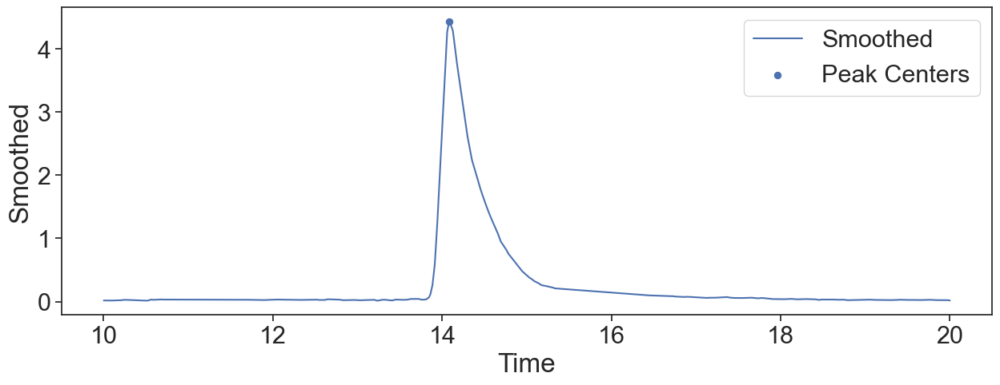

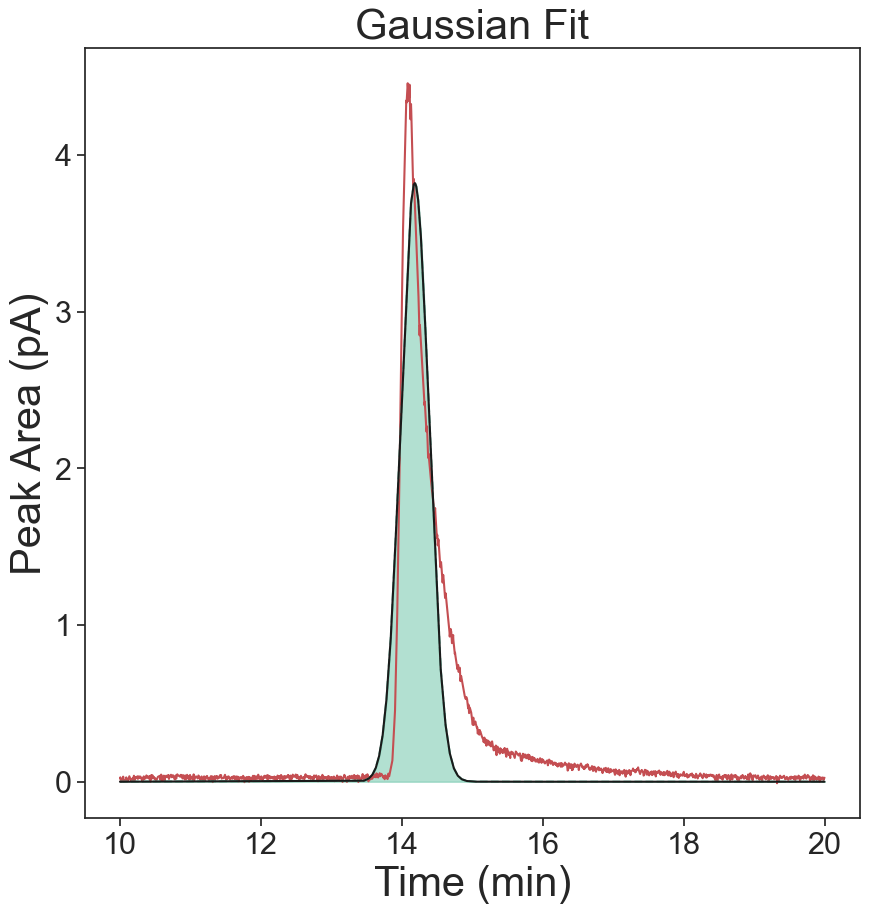

Exp Gaussian
[4.4594048]
0.050124845142617024


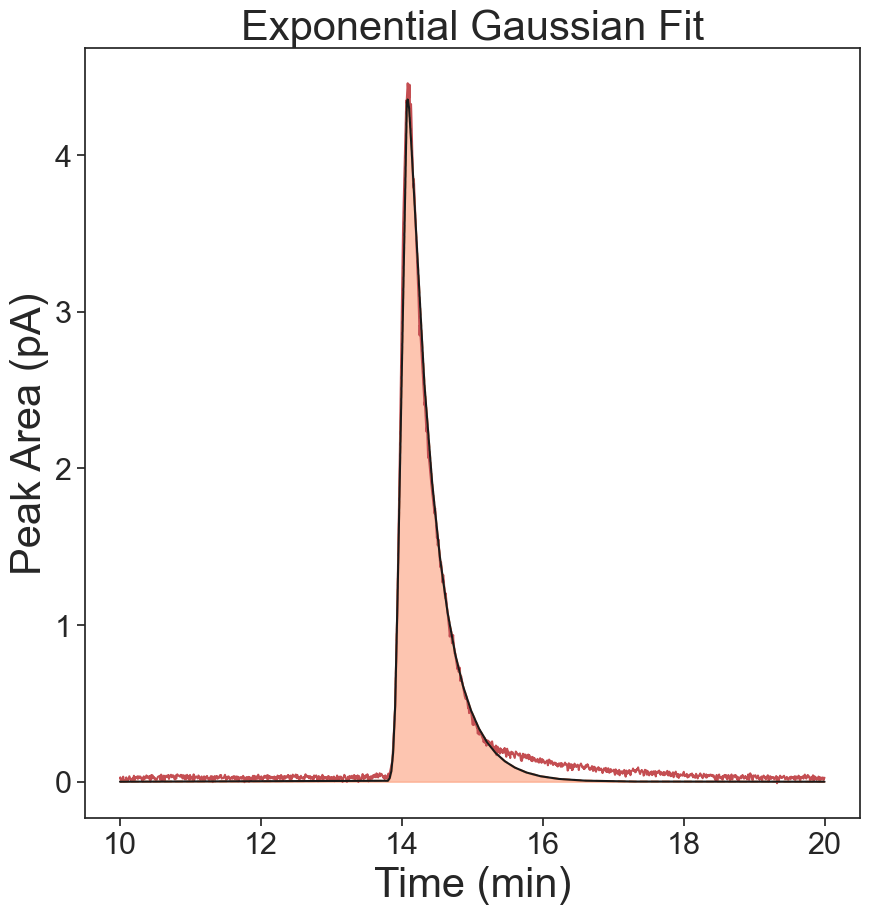

Skew Gaussian
[4.4594048]
0.1656369850439625


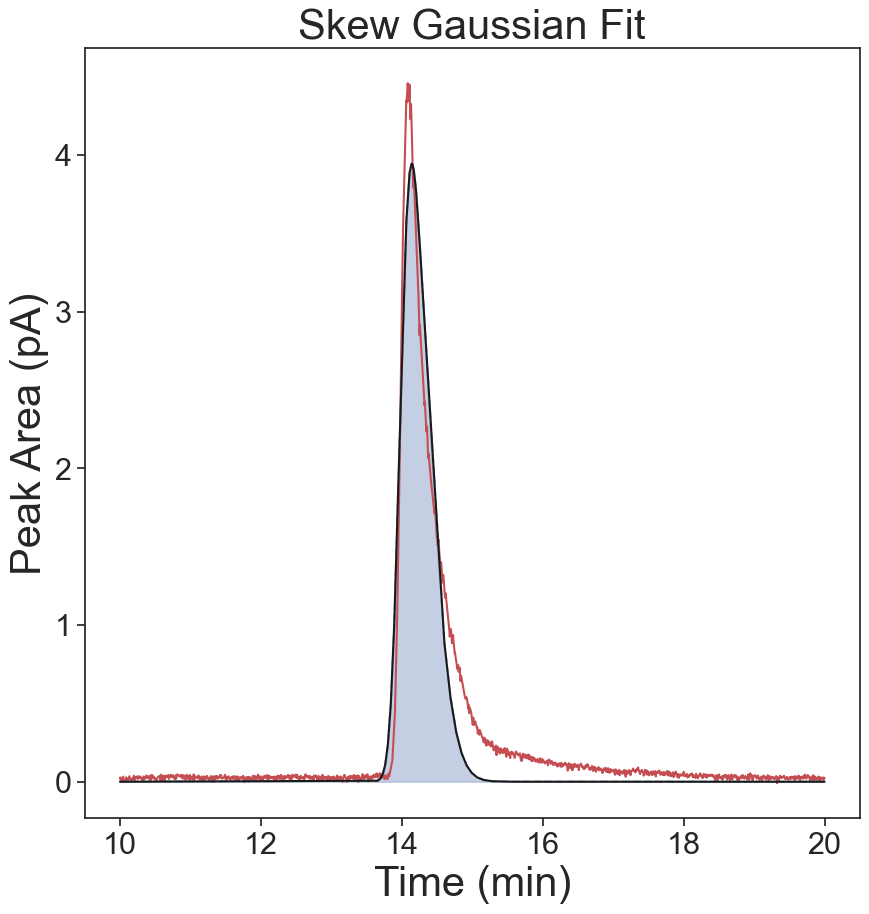

Voigt
[4.4594048]
0.22526910663548363


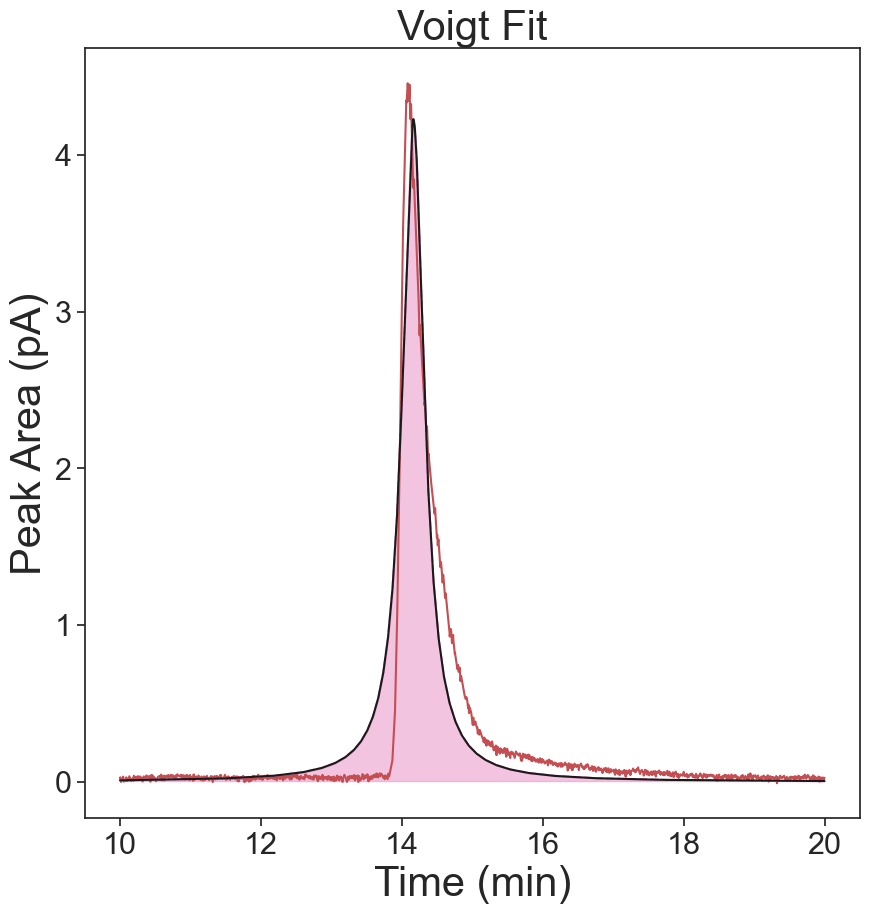

Gaussian
[3.91428088]
-18180.708730385733
-18180.708730385733
0.21592697566451044


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


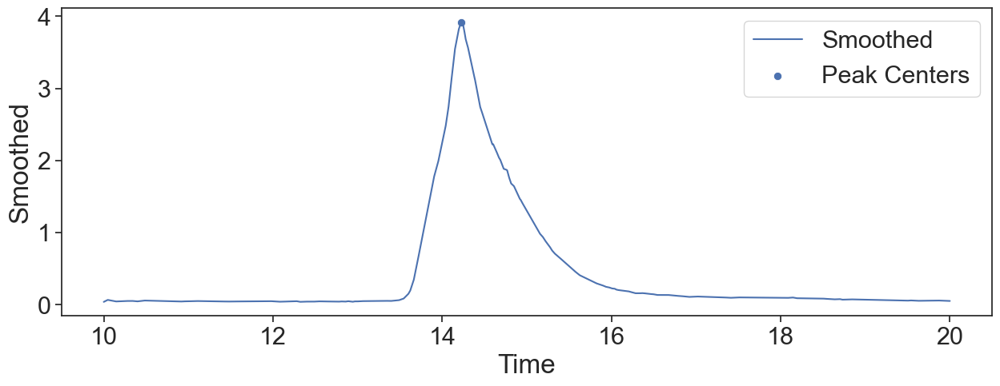

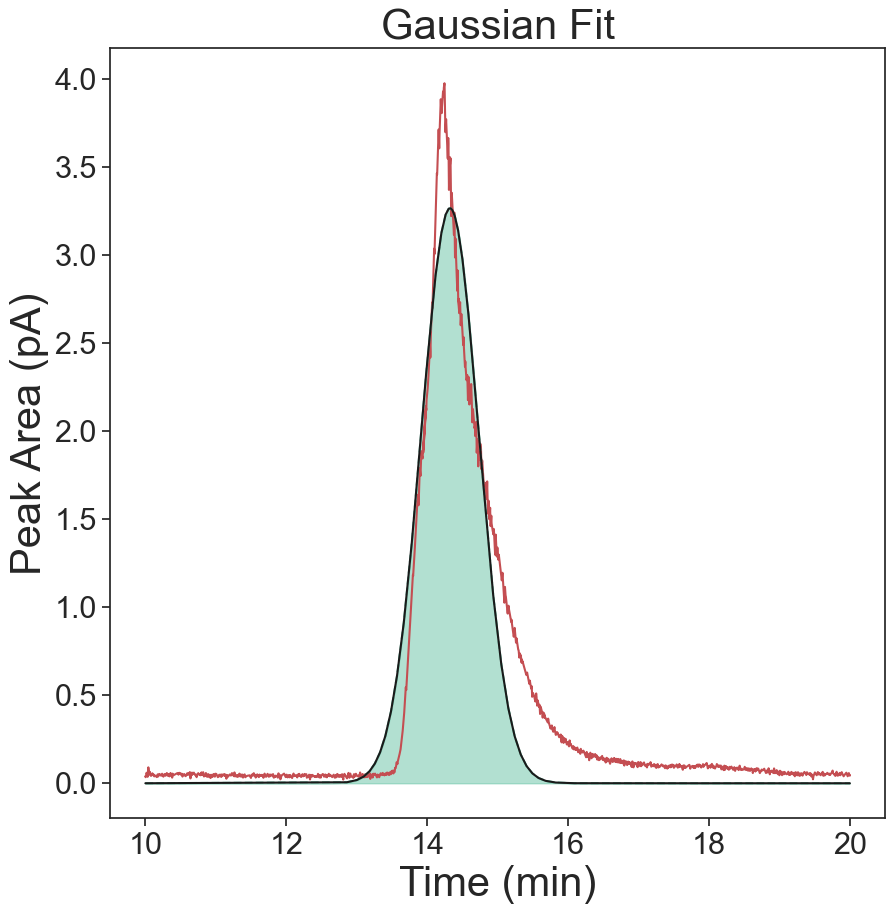

Exp Gaussian
[3.91428088]
0.08371187797036005


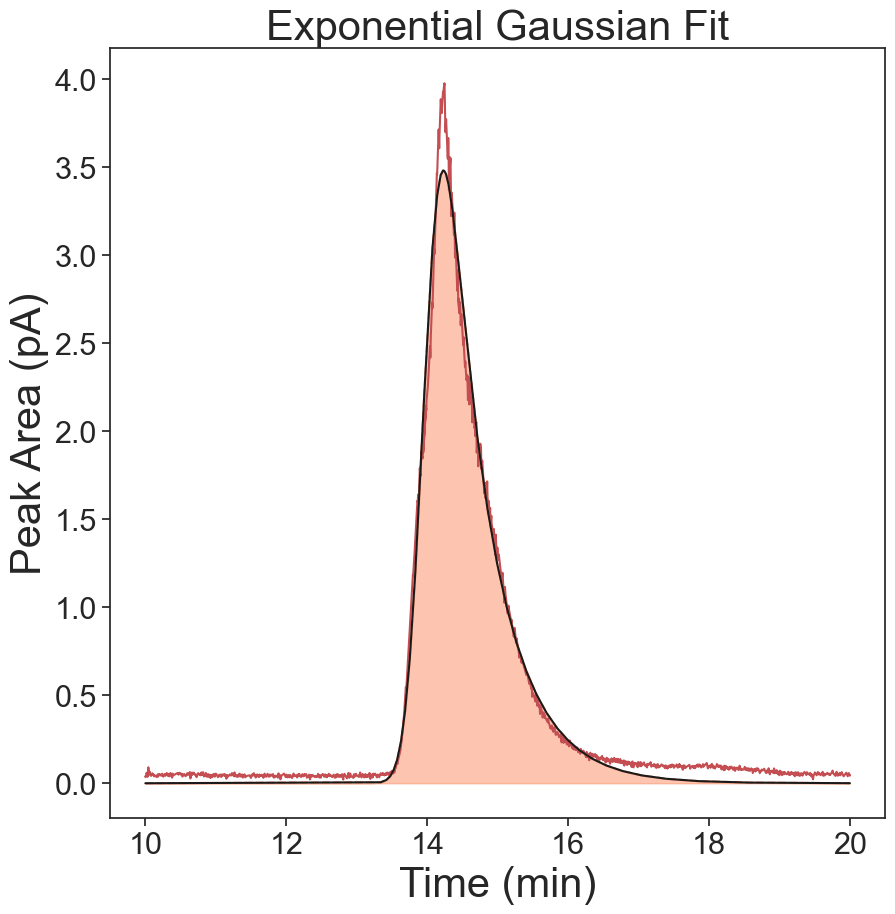

Skew Gaussian
[3.91428088]
0.12566448218227386


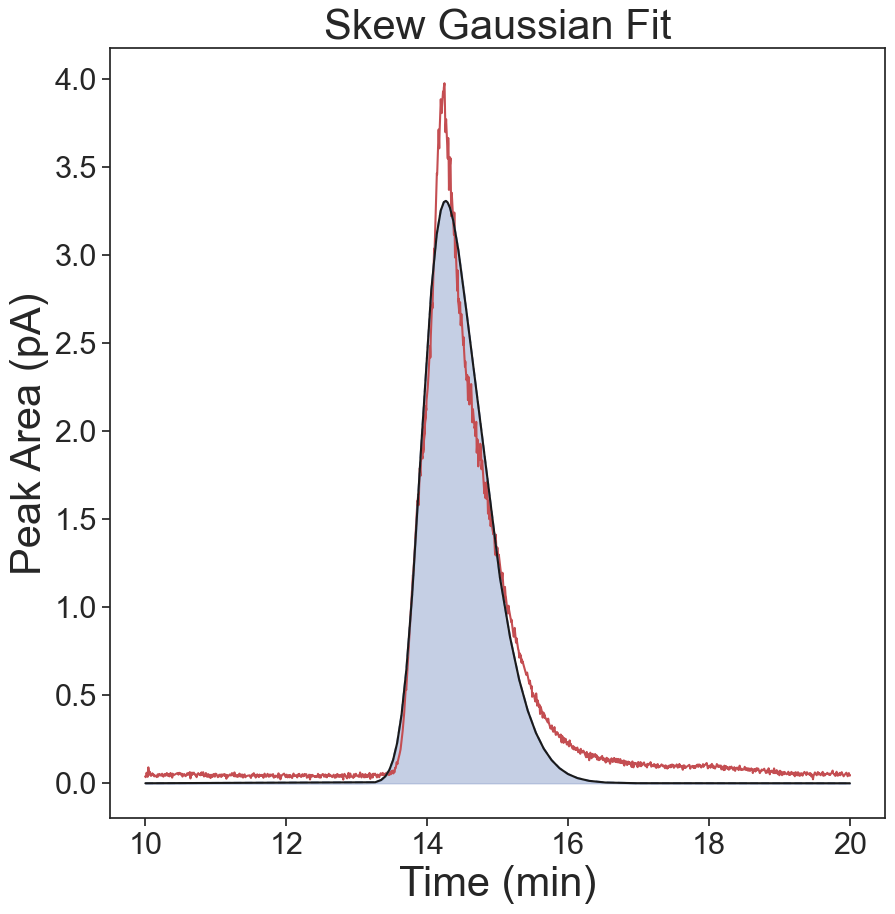

Voigt
[3.91428088]
0.1910153399480031


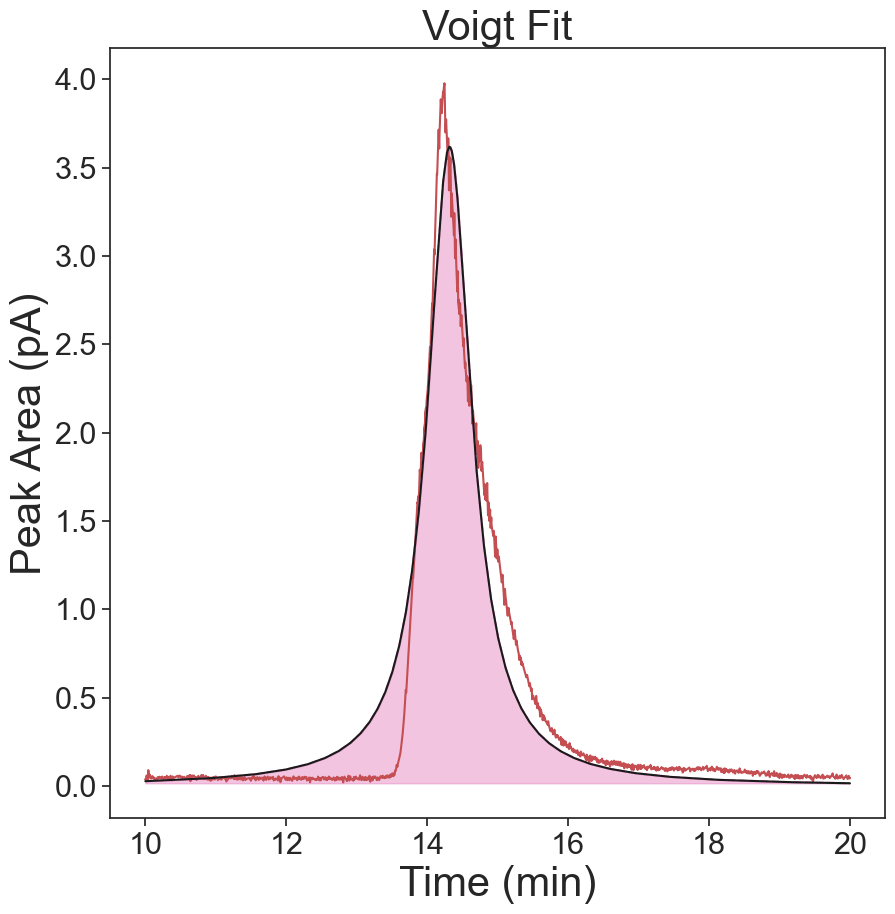

Gaussian
[7.77177426]
-7929.963821474363
-7929.963821474363
0.5117468753051422


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


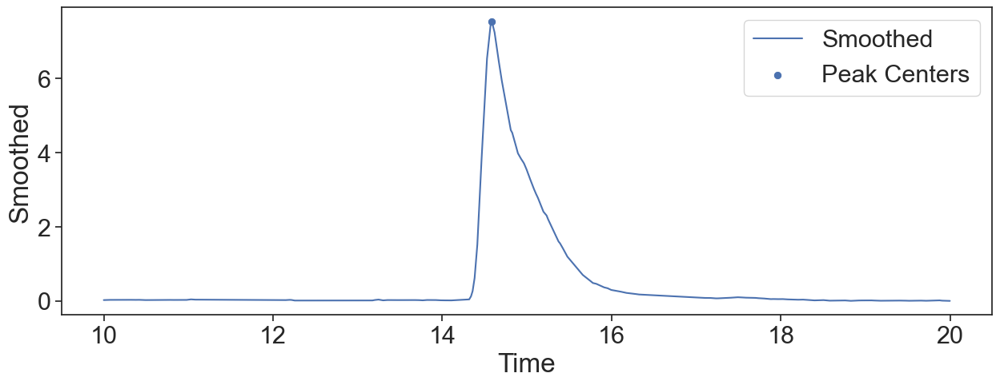

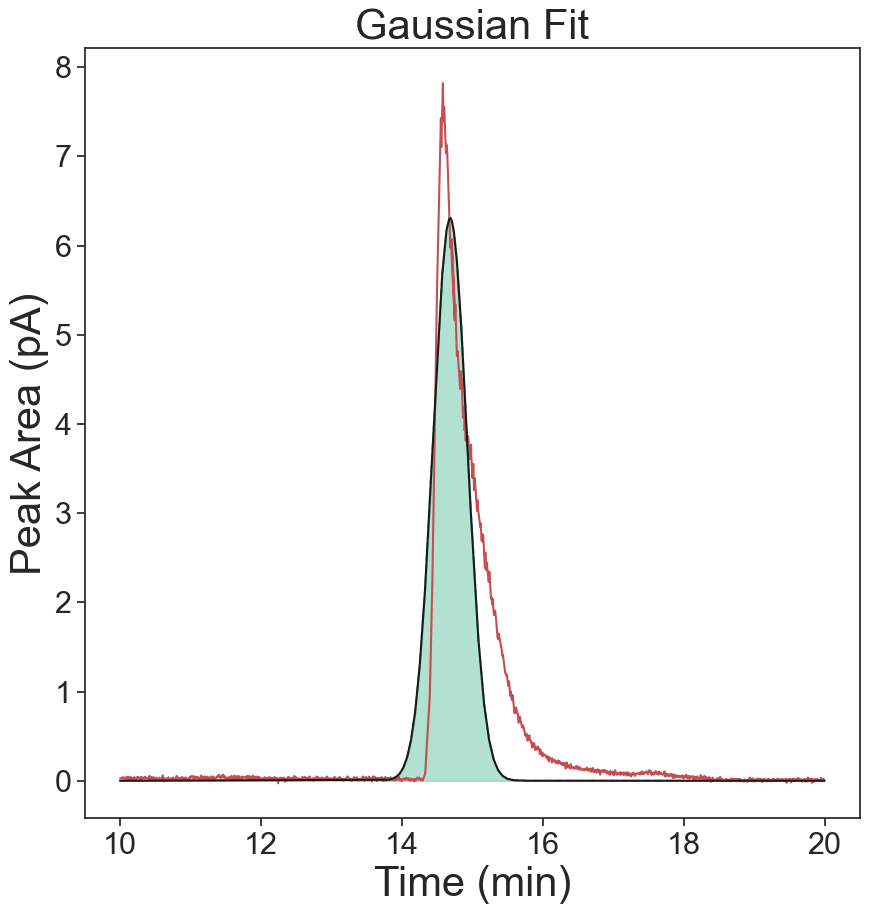

Exp Gaussian
[7.77177426]
0.07460509542212988


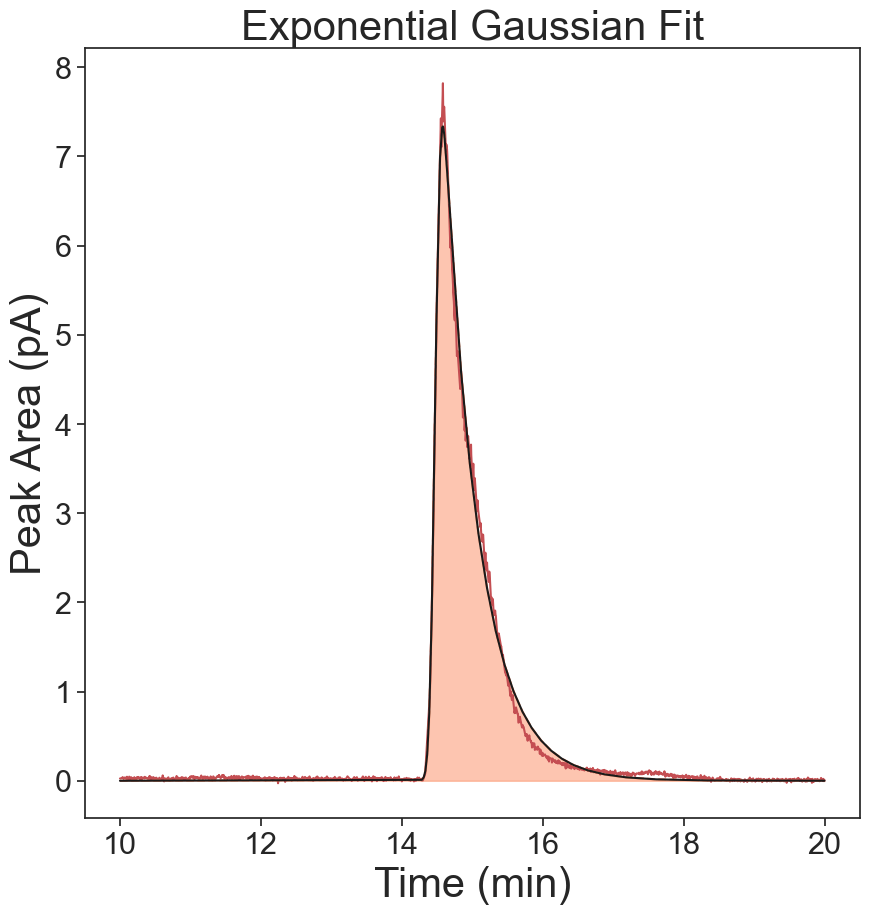

Skew Gaussian
[7.77177426]
0.32079625278889634


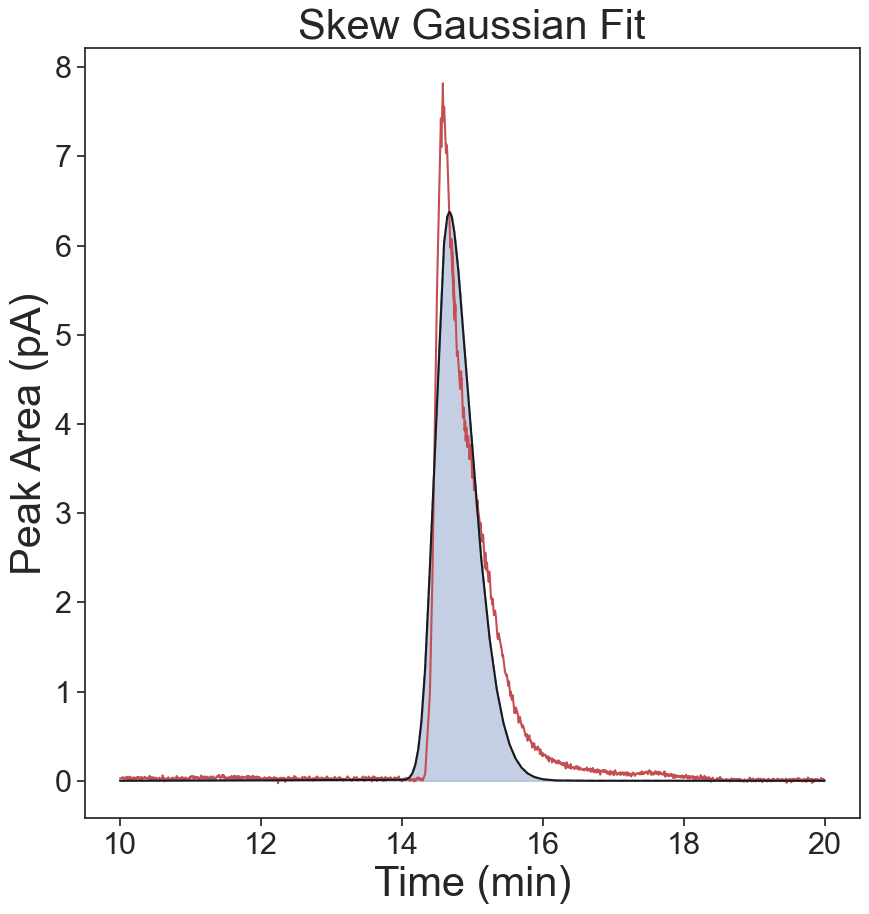

Voigt
[7.77177426]
0.4667765411904691


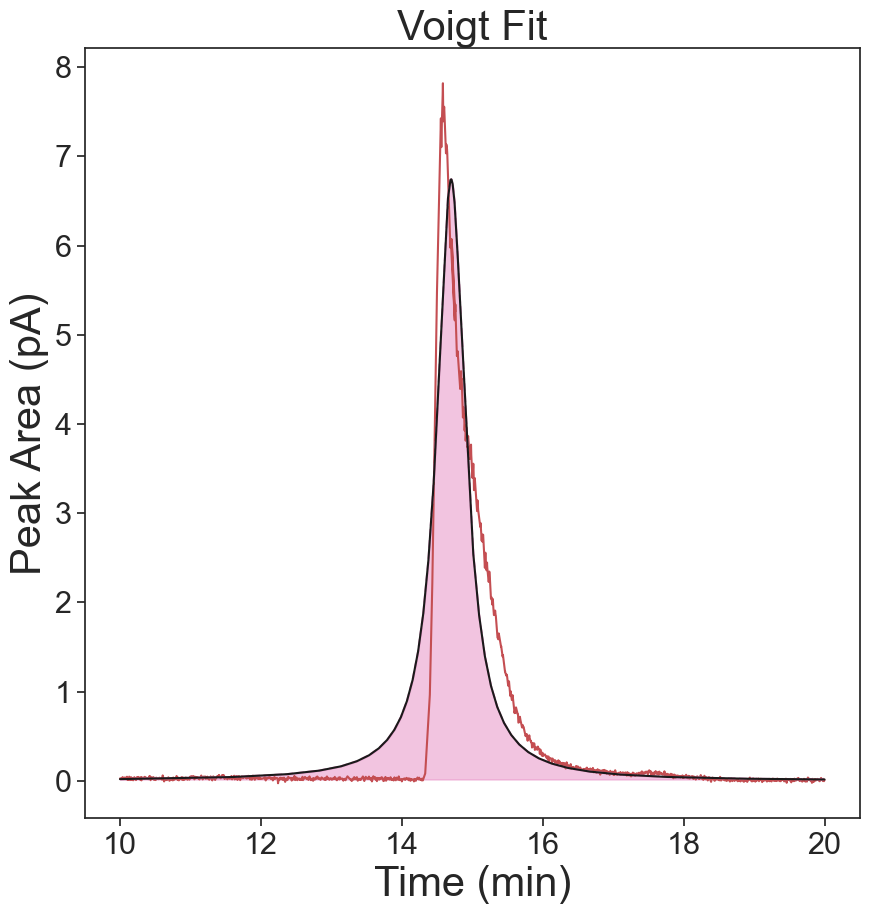

Gaussian
[8.03868826]
-7413.364763721854
-7413.364763721854
0.534555183399953


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


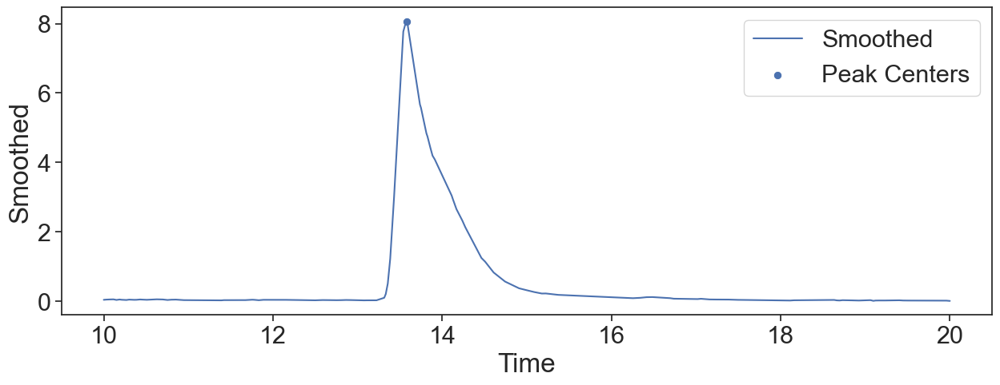

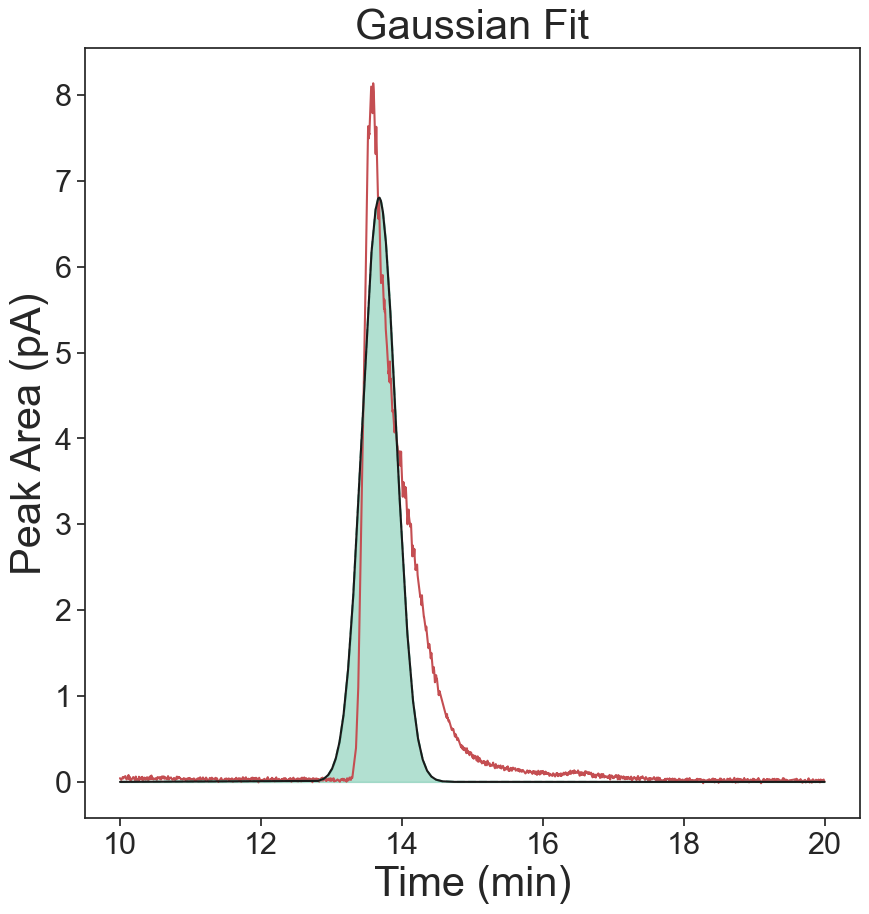

Exp Gaussian
[8.03868826]
0.08003069302106387


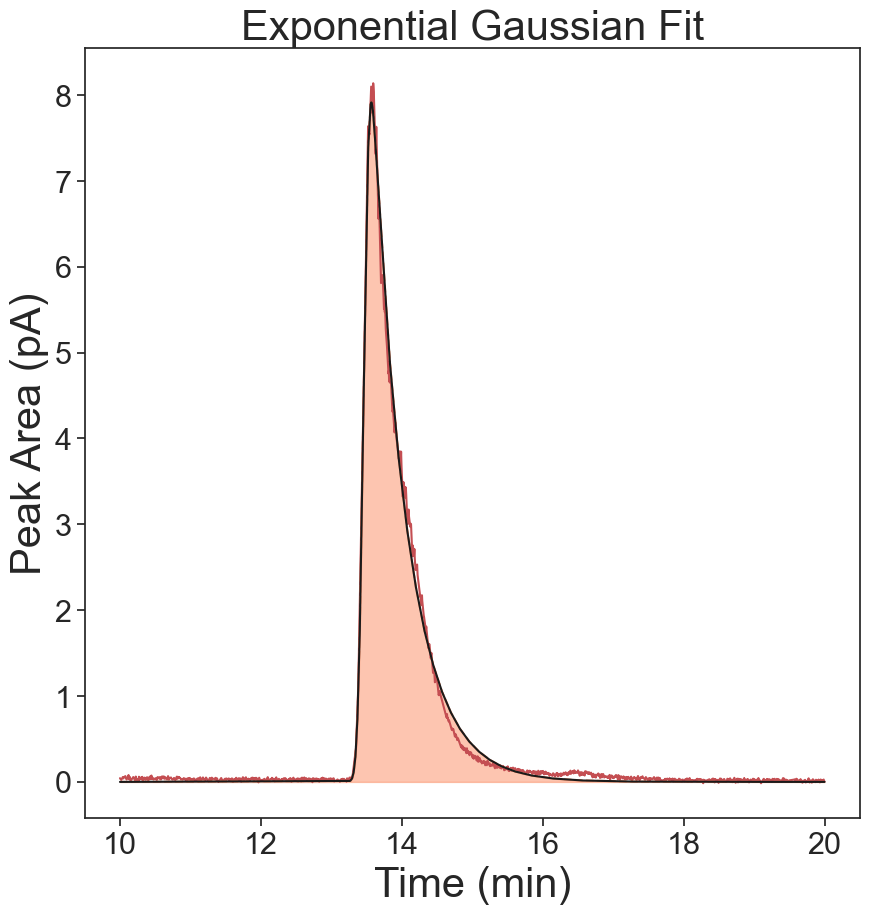

Skew Gaussian
[8.03868826]
0.34222102710005764


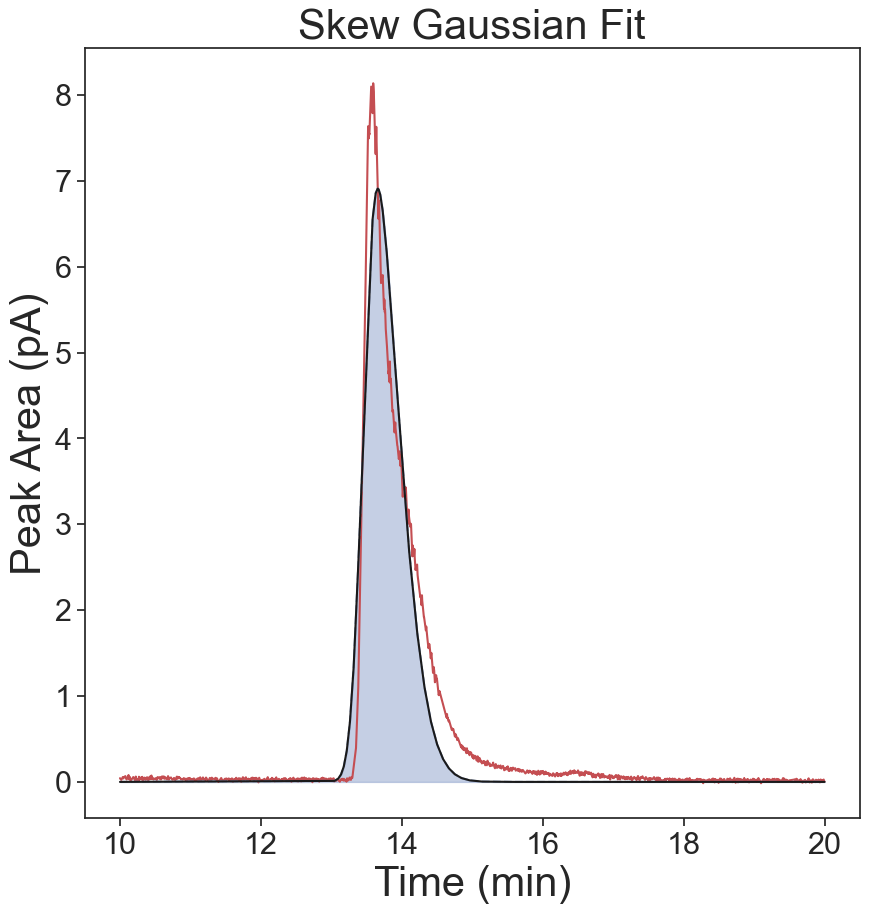

Voigt
[8.03868826]
0.4937197564556412


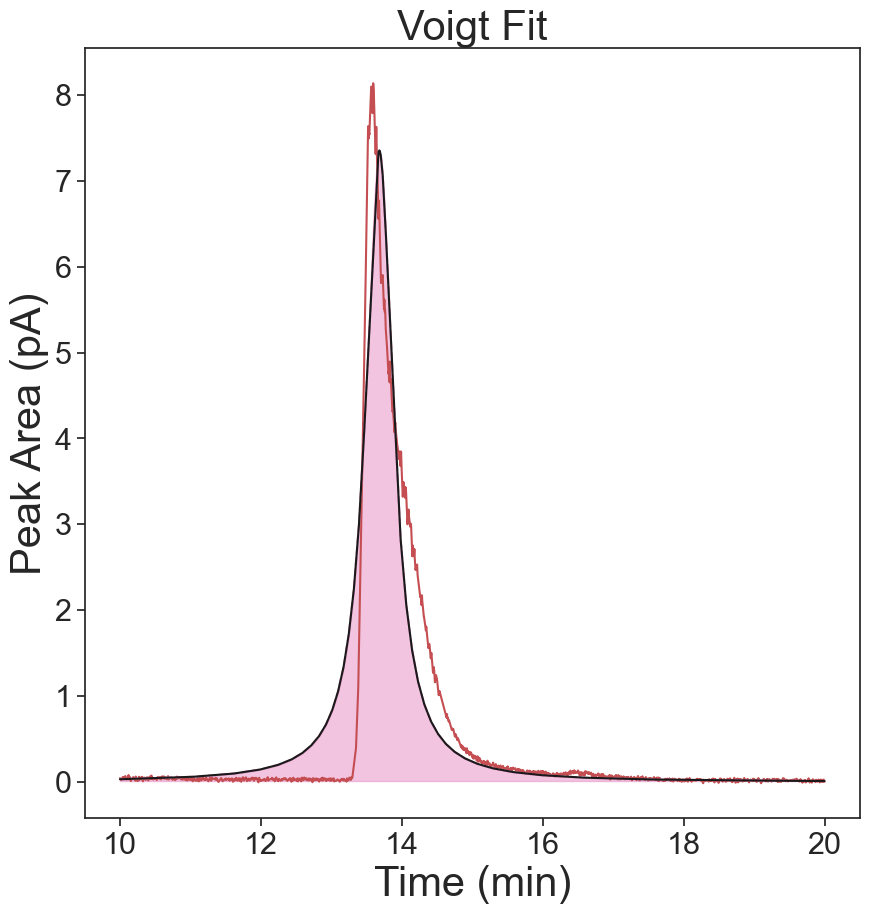

Gaussian
[7.90047042]
-8017.3445989139655
-8017.3445989139655
0.5080532954235392


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


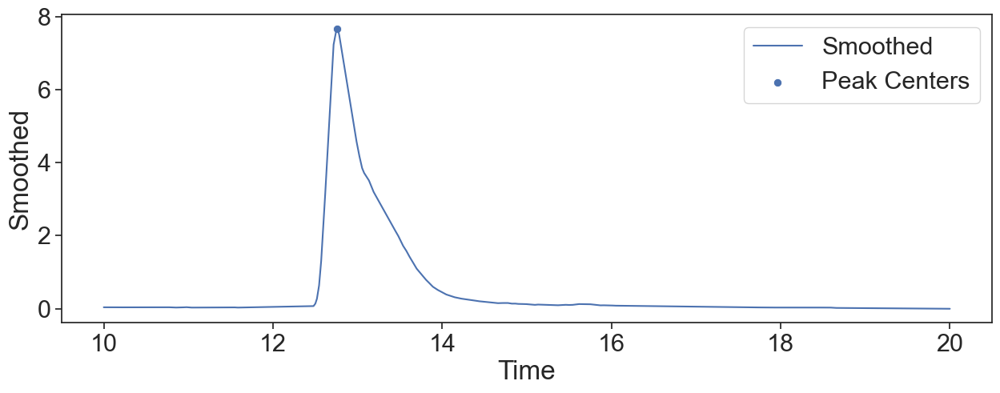

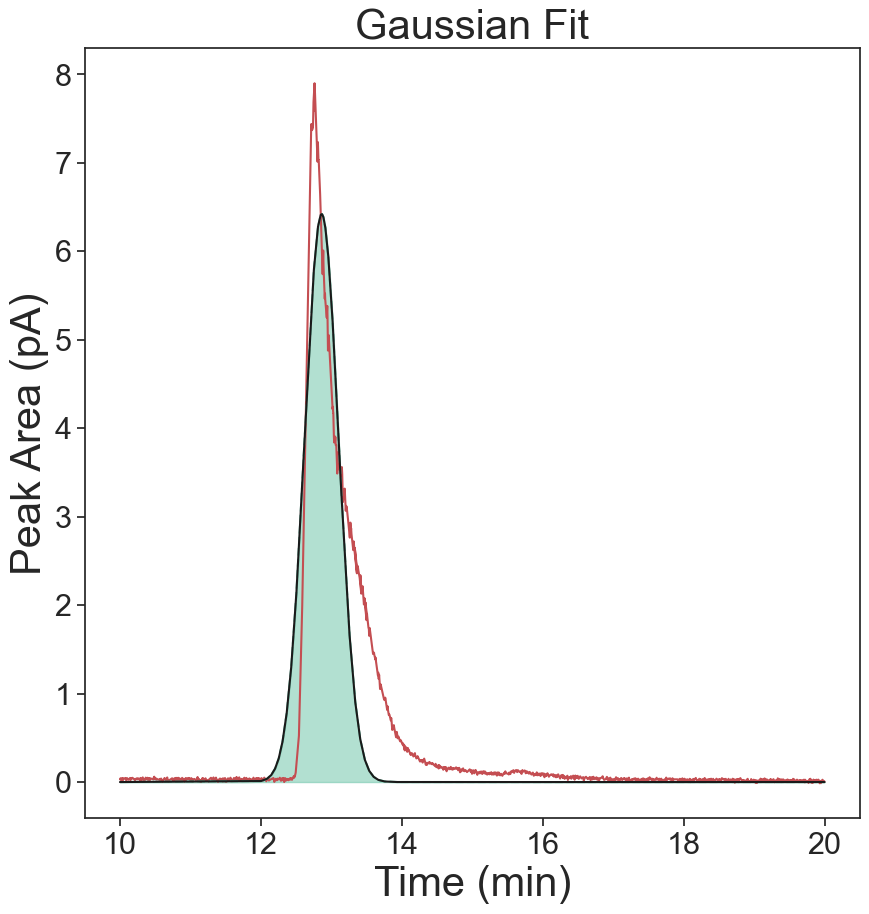

Exp Gaussian
[7.90047042]
0.08047793149648354


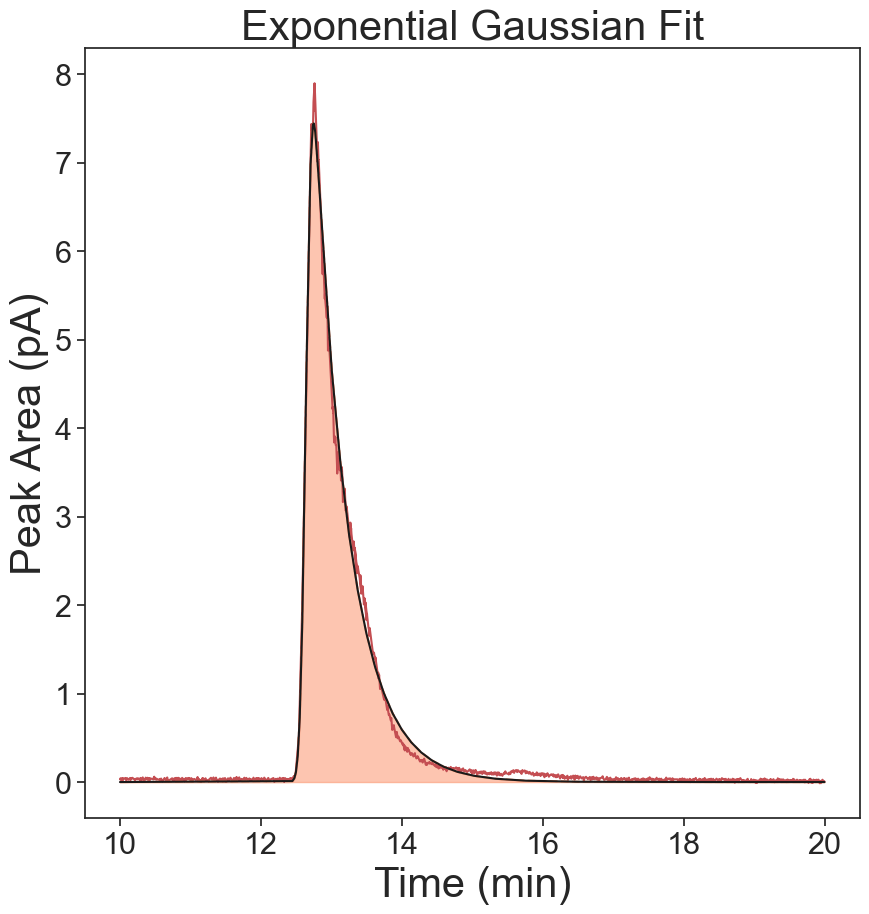

Skew Gaussian
[7.90047042]
0.33629823122685987


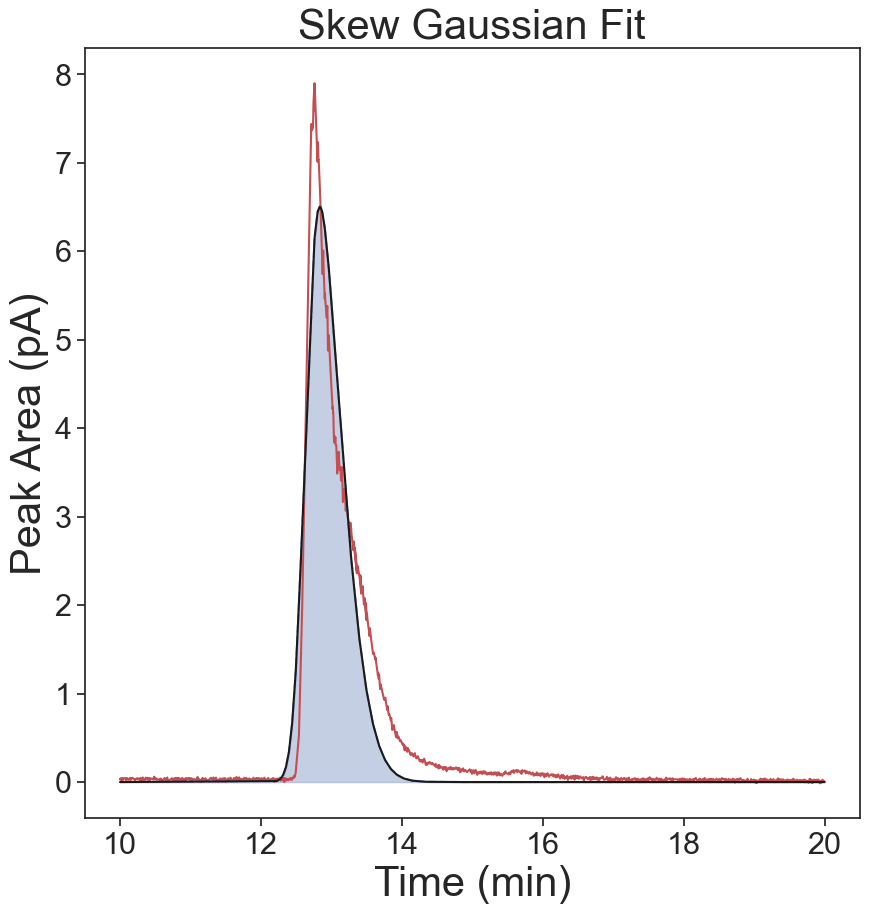

Voigt
[7.90047042]
0.4647232592804654


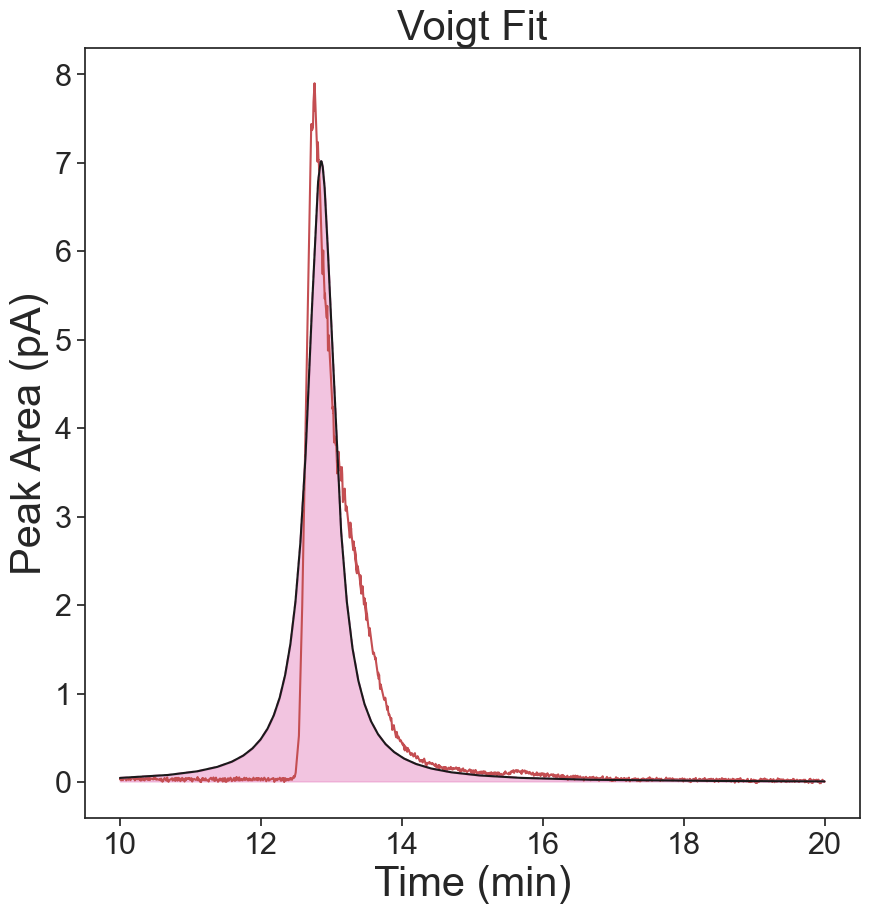

Gaussian
[6.79298135]
-11041.228382095826
-11041.228382095826
0.39386484757960266


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


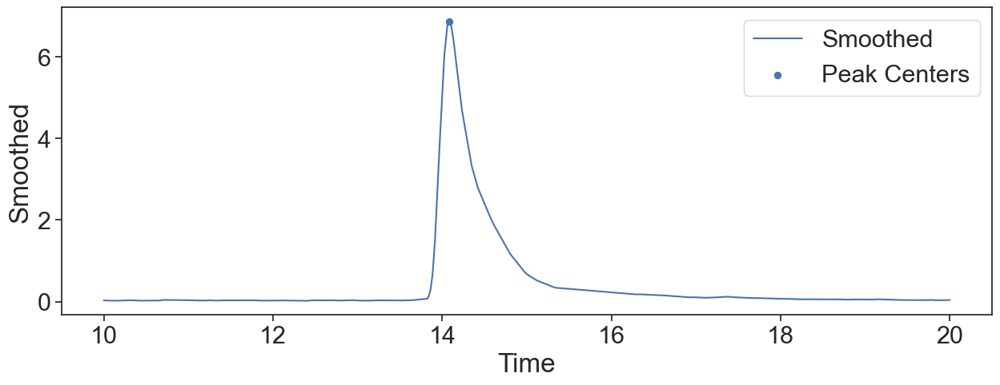

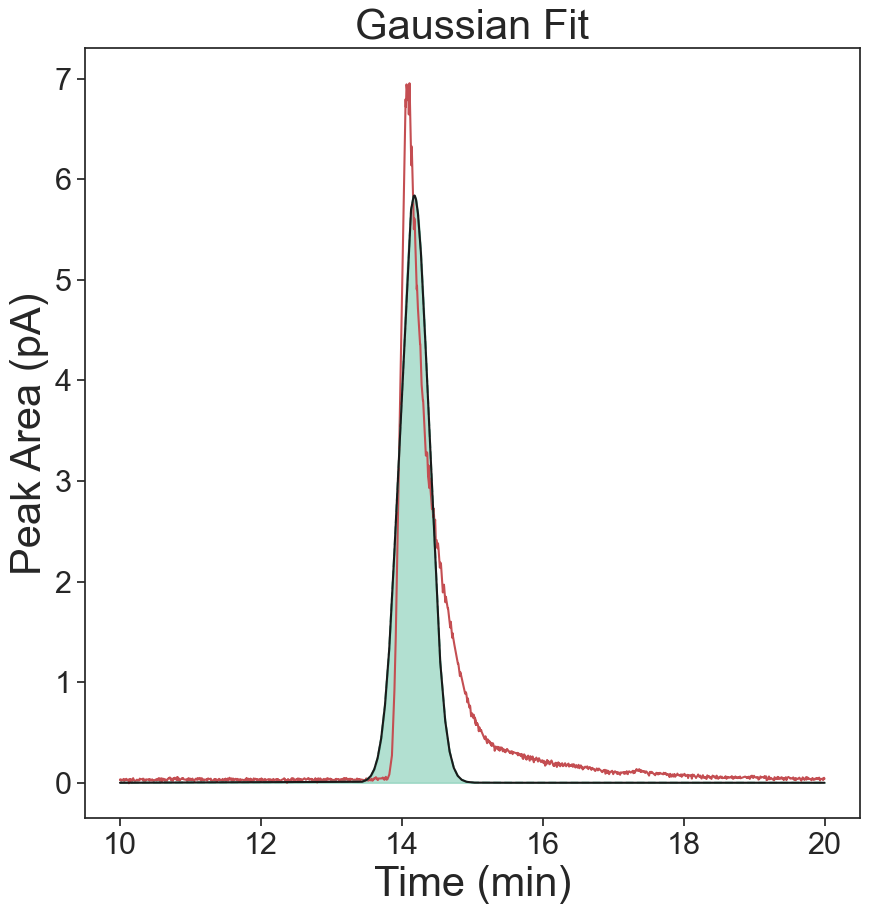

Exp Gaussian
[6.79298135]
0.08531923965049495


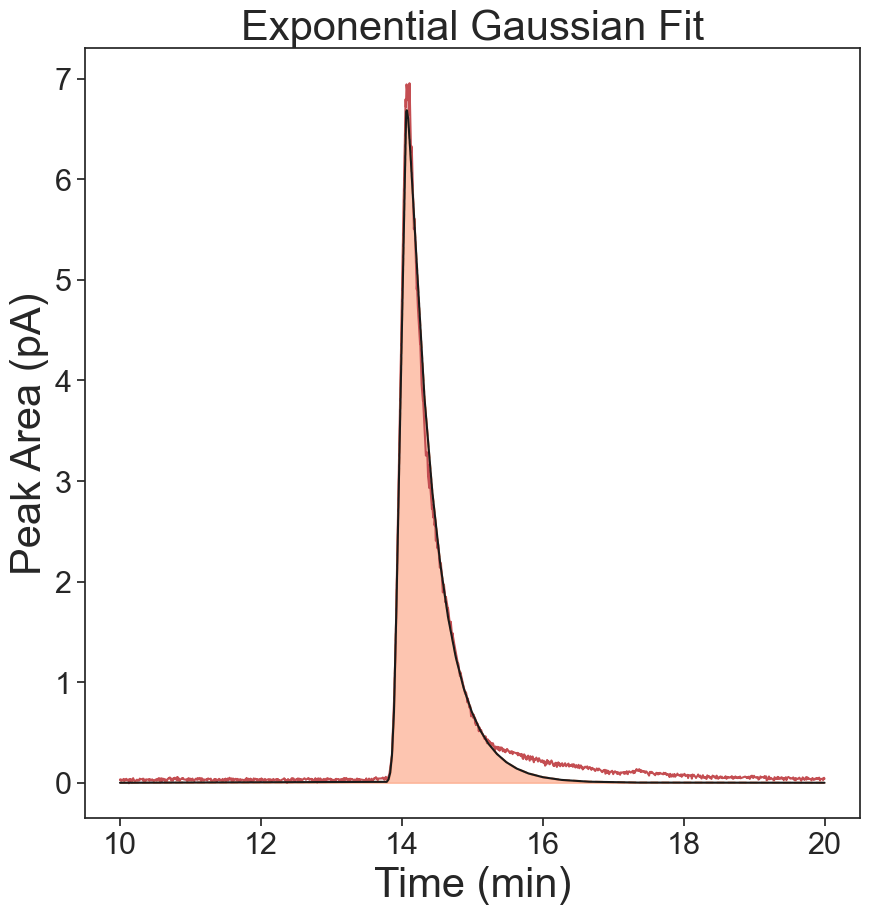

Skew Gaussian
[6.79298135]
0.27079972369236516


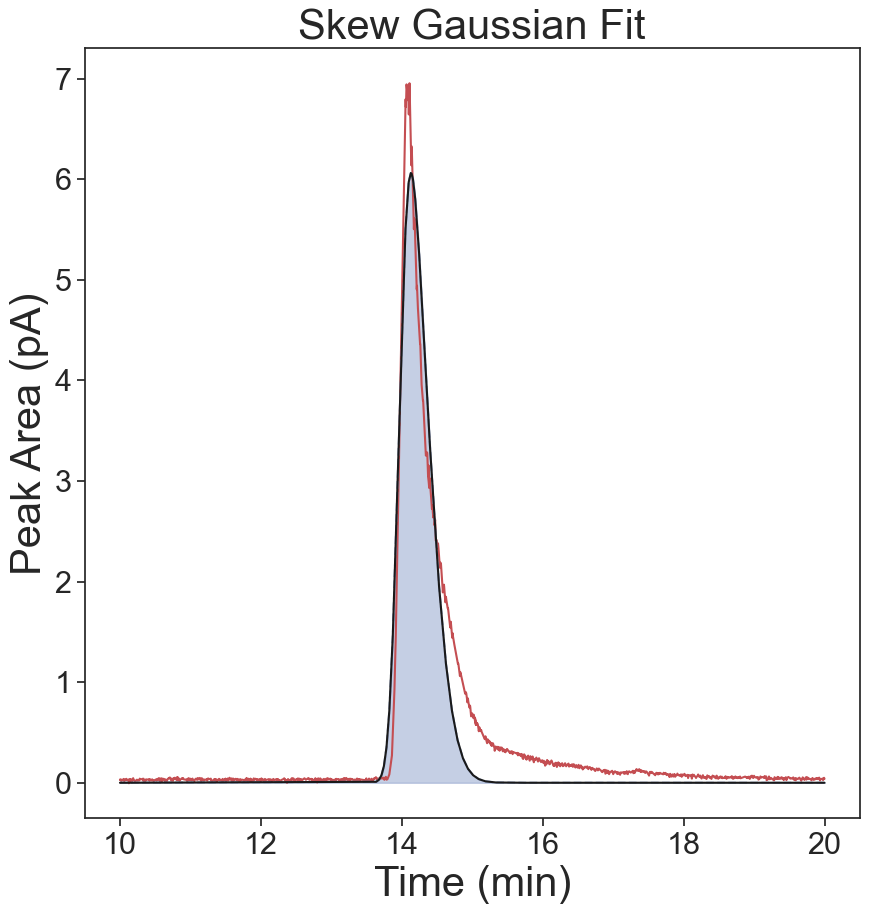

Voigt
[6.79298135]
0.3567035316282013


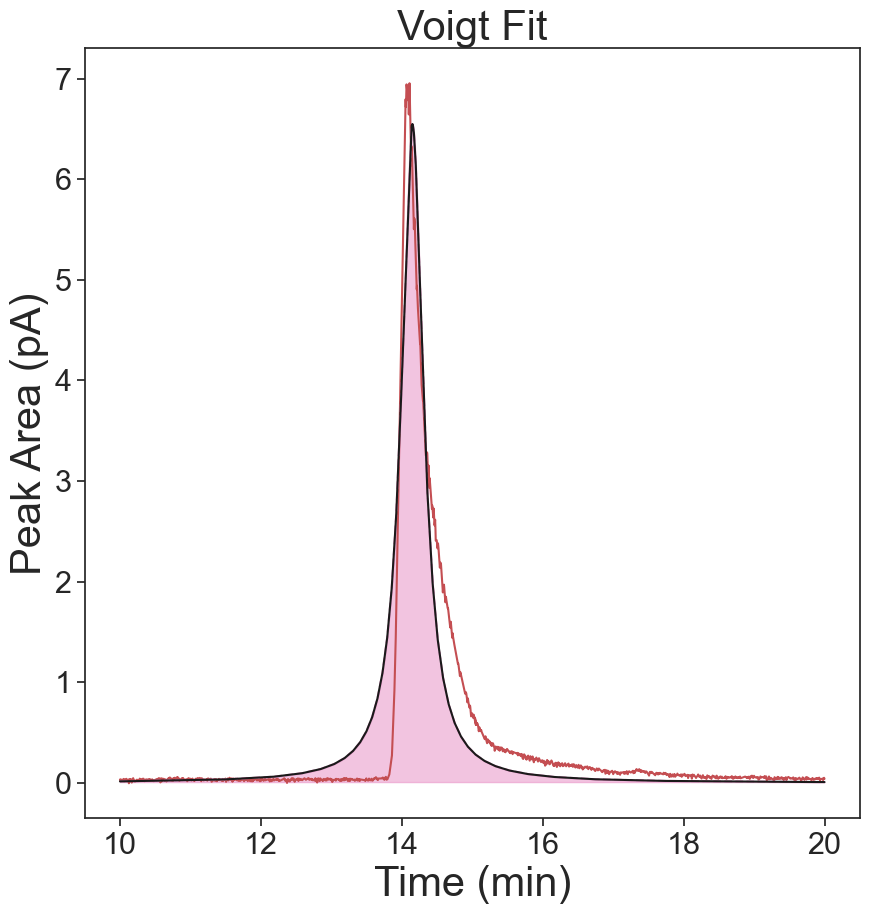

Gaussian
[5.19643273]
-14680.345705164626
-14680.345705164626
0.28986774669390997


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


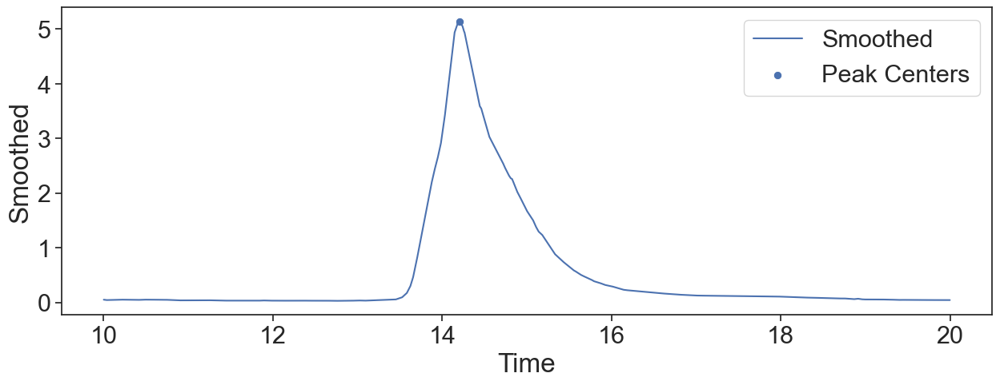

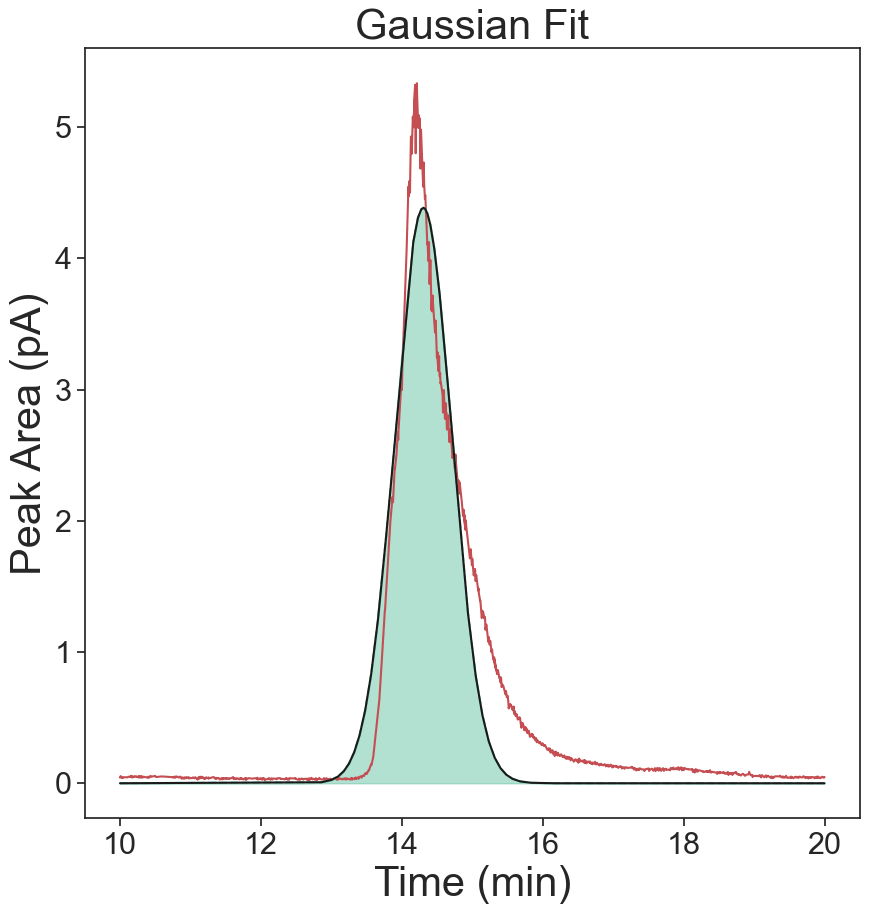

Exp Gaussian
[5.19643273]
0.10103483621900547


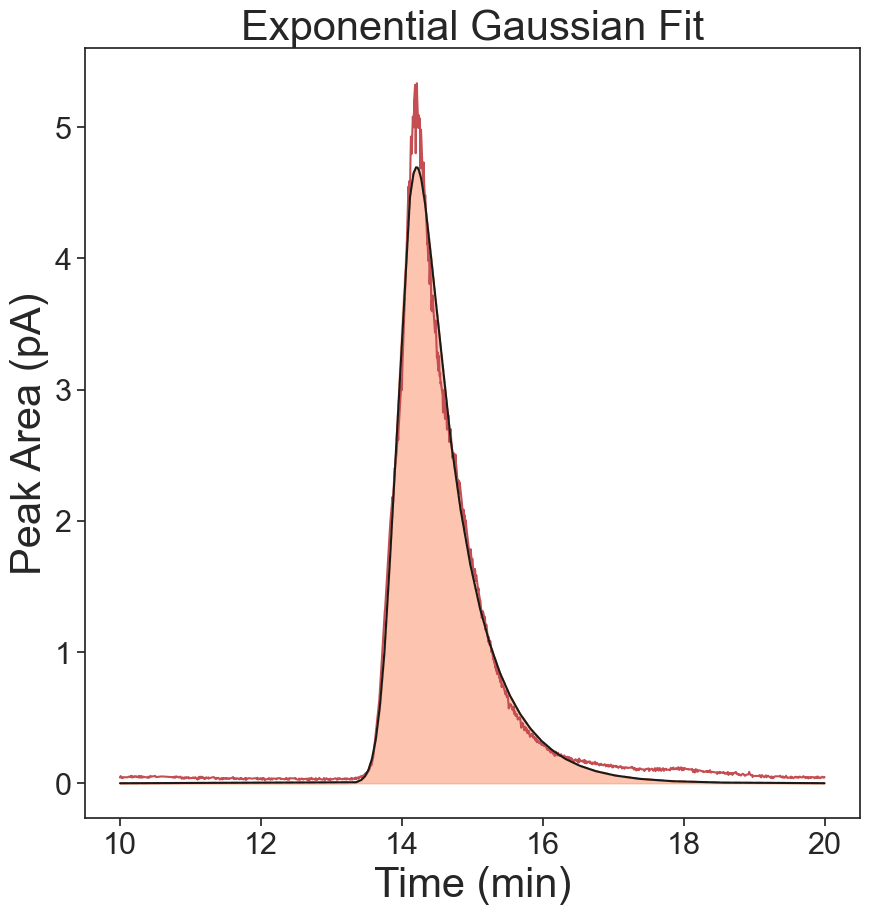

Skew Gaussian
[5.19643273]
0.16197946419564876


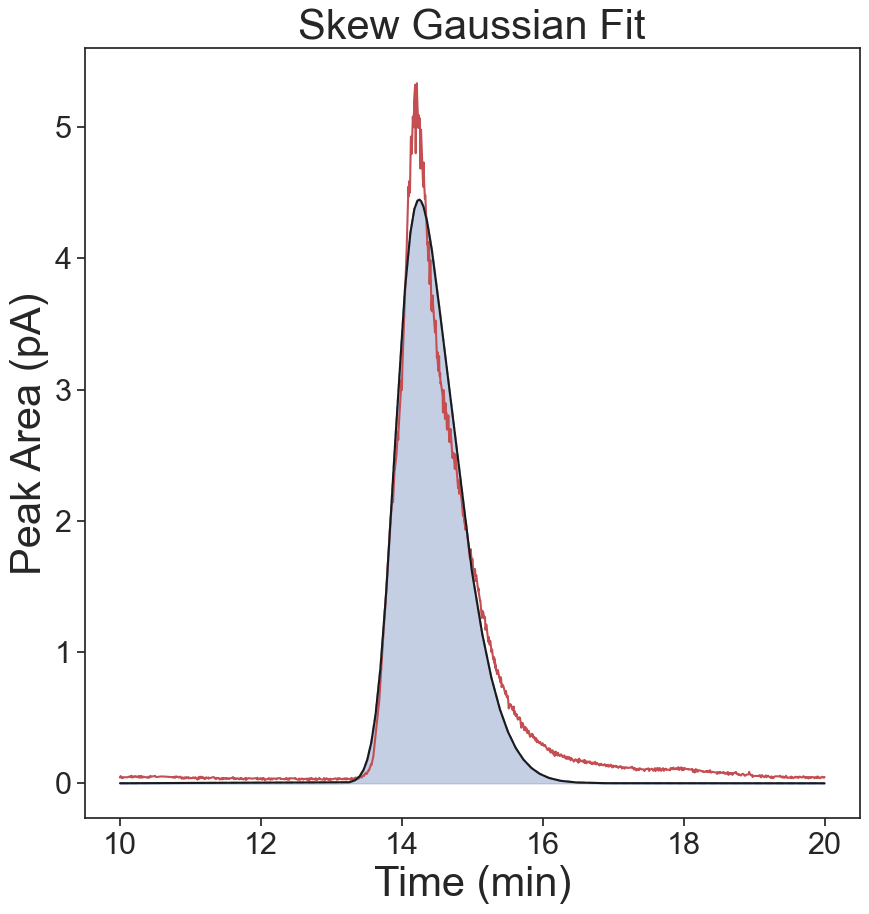

Voigt
[5.19643273]
0.2643040190382838


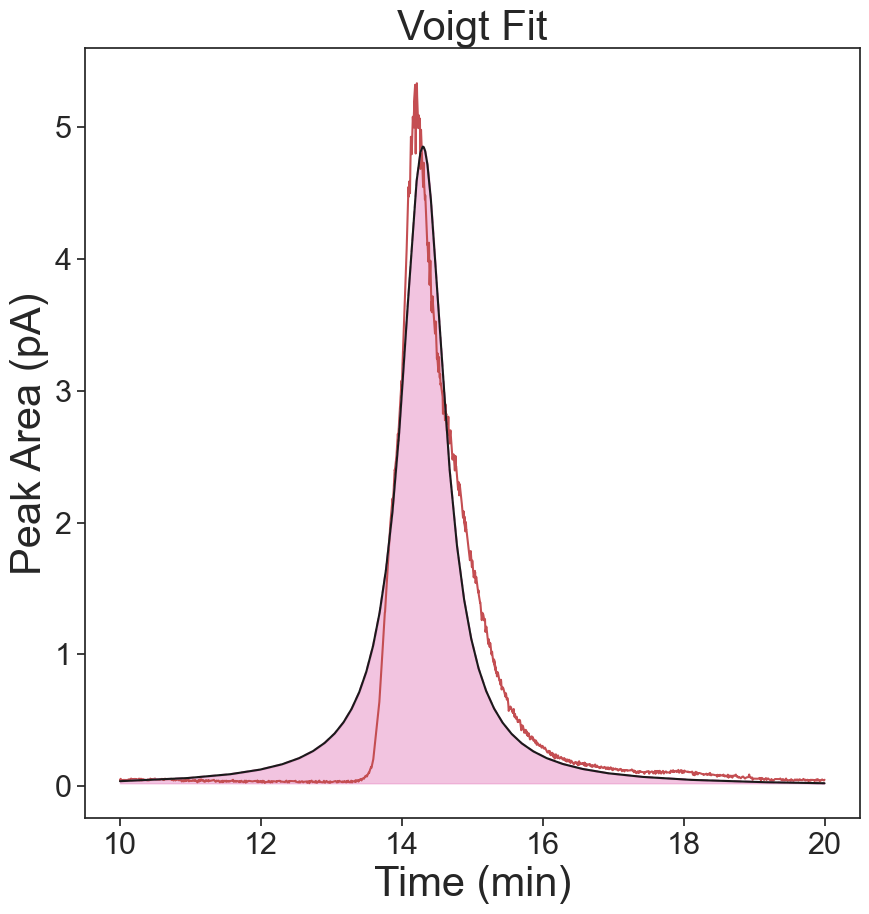

Gaussian
[8.65806125]
-5911.41990684371
-5911.41990684371
0.6066078829060246


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


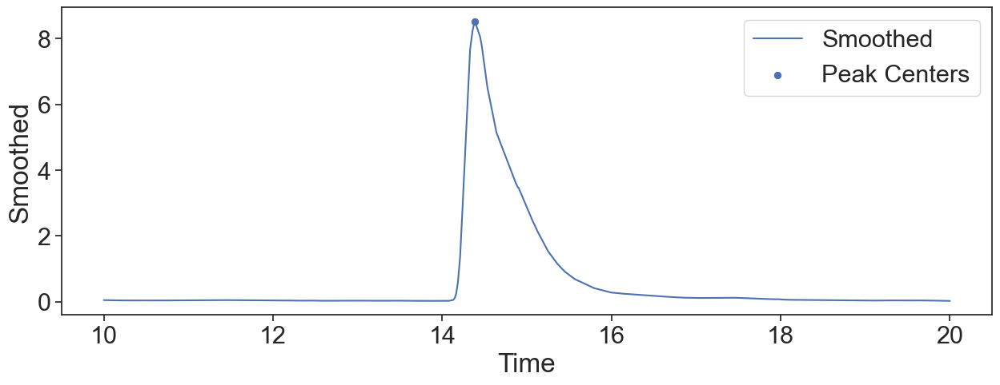

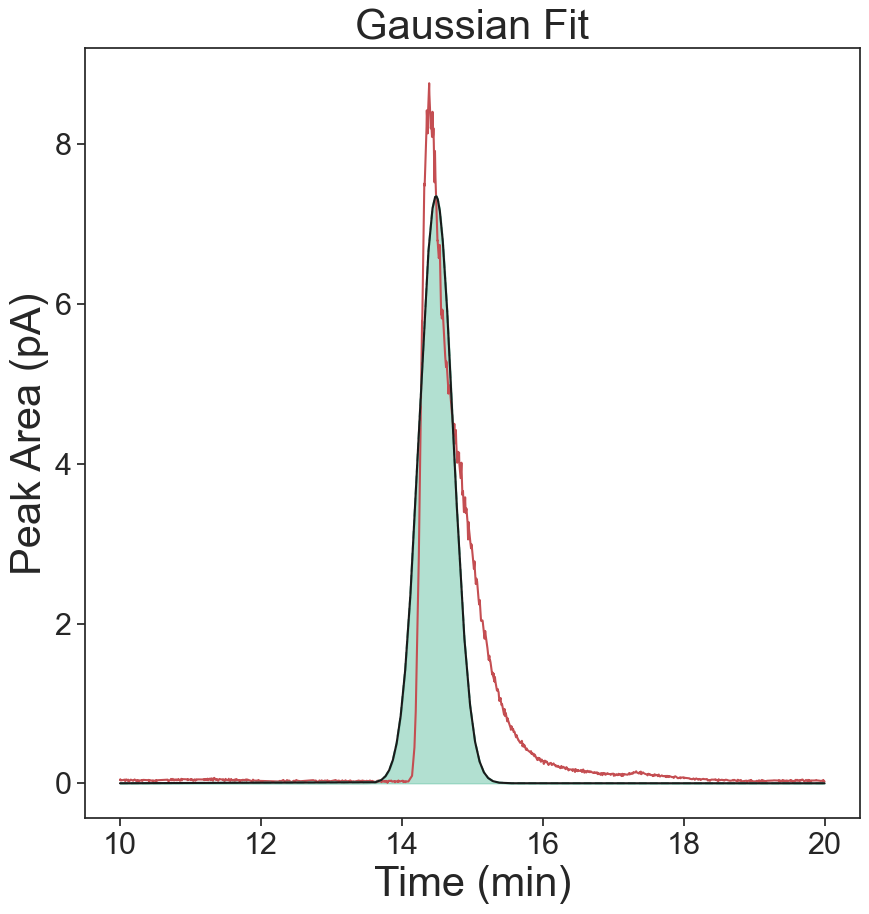

Exp Gaussian
[8.65806125]
0.08222349250211684


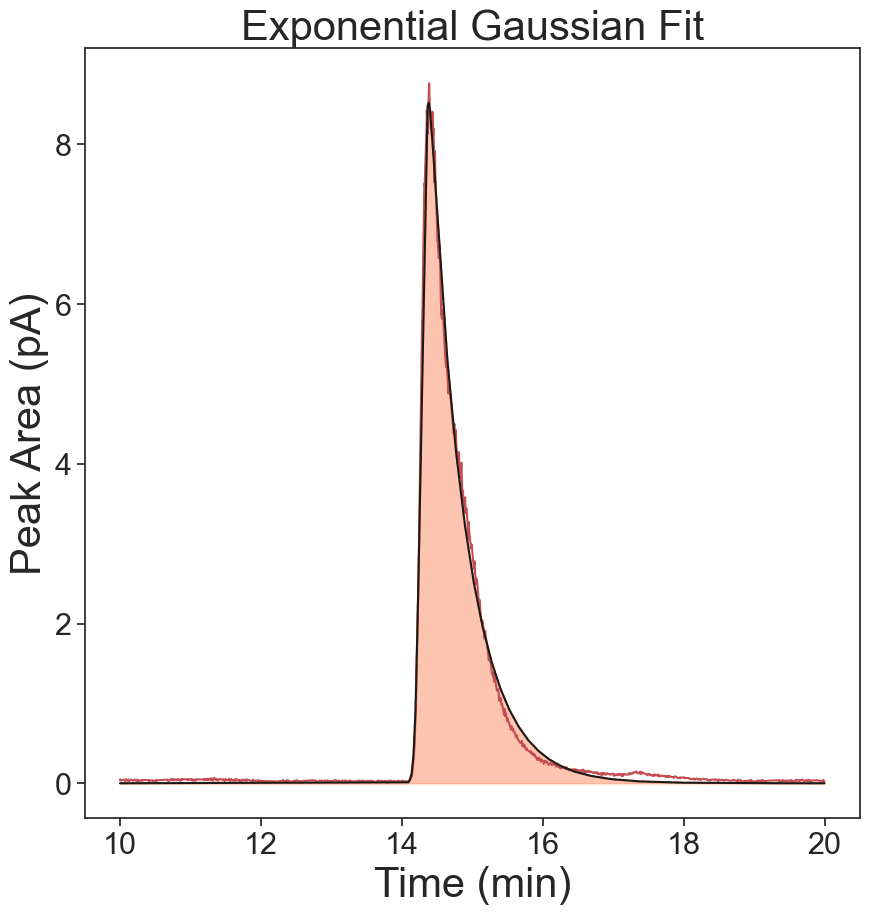

Skew Gaussian
[8.65806125]
0.3800503636681883


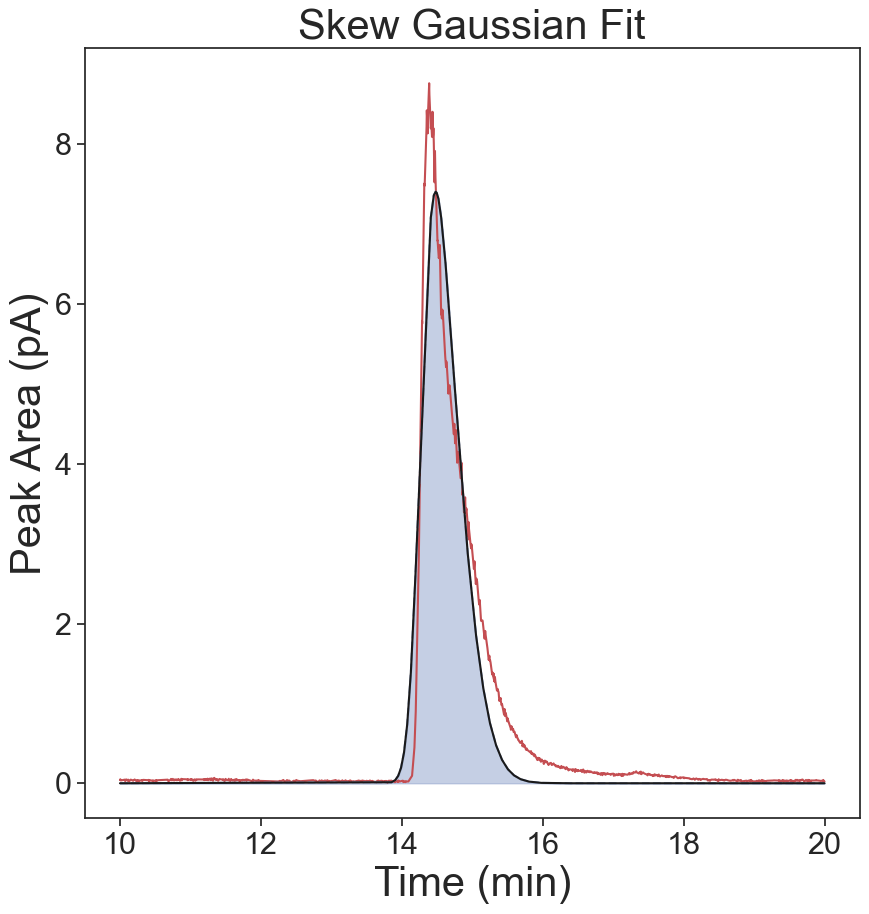

Voigt
[8.65806125]
0.5464535103184214


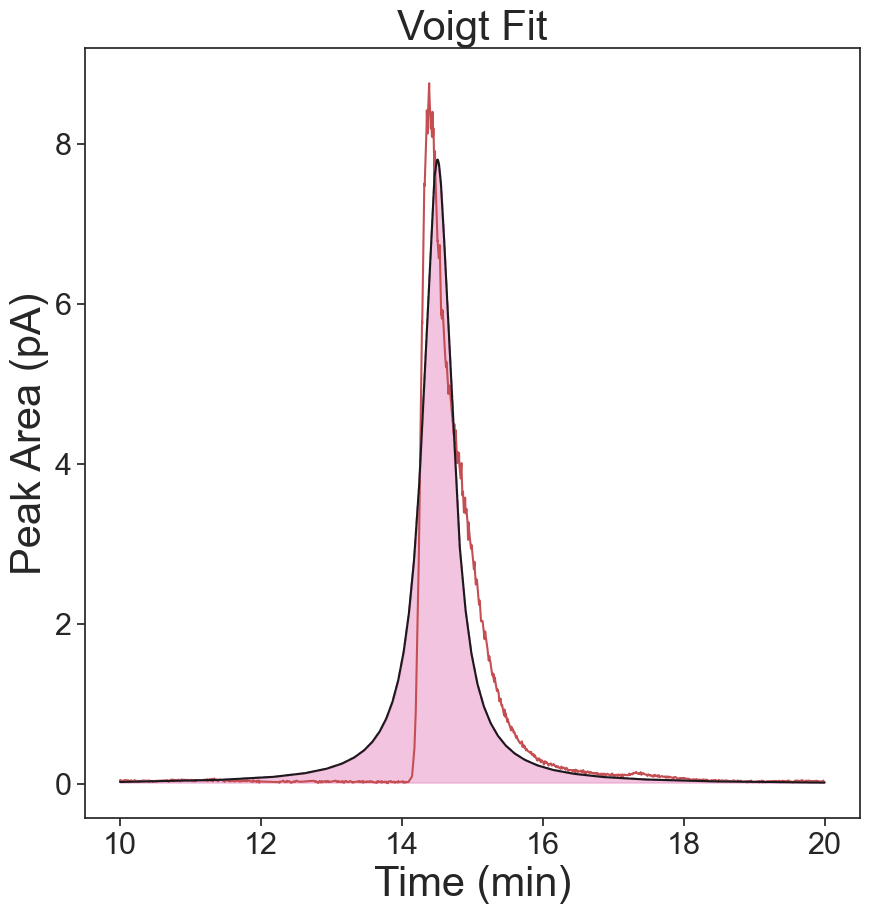

/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


Gaussian
[8.80571635]
-5784.660426567426
-5784.660426567426
0.6131161383224942


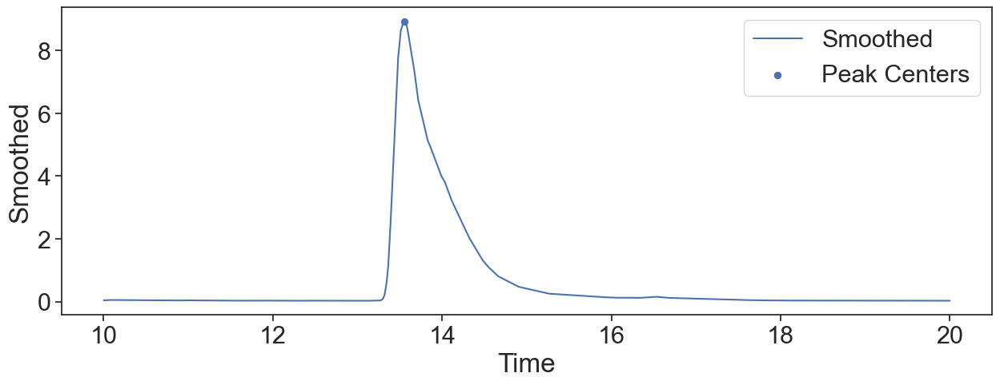

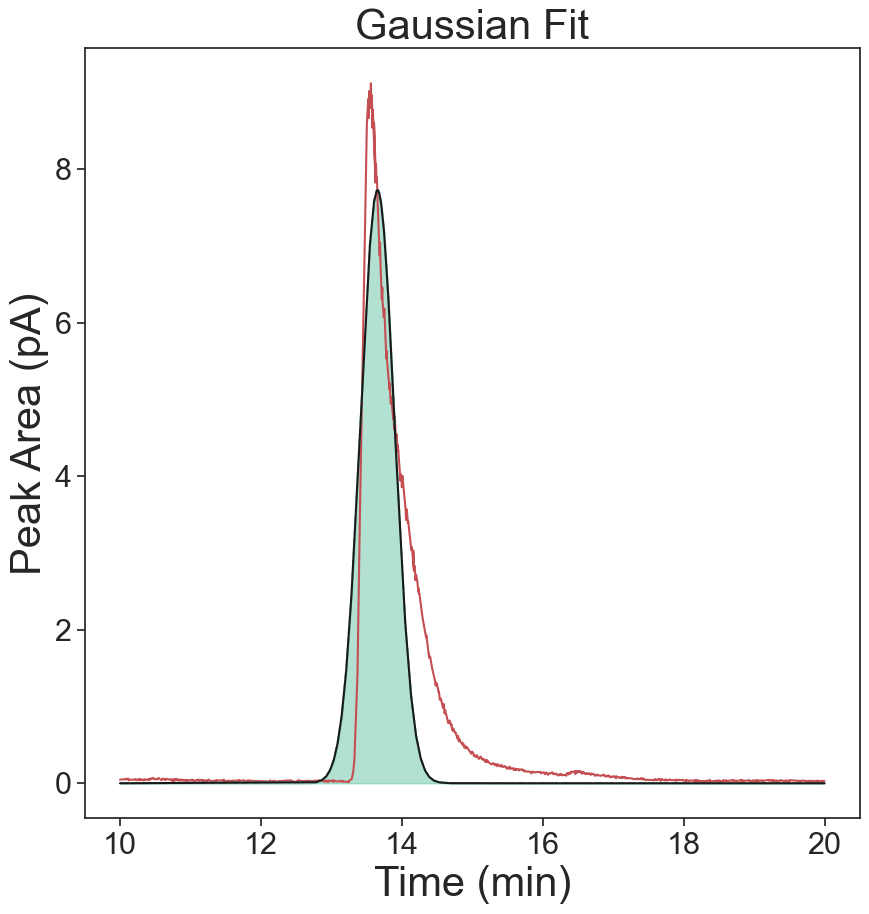

Exp Gaussian
[8.80571635]
0.0797402652904039


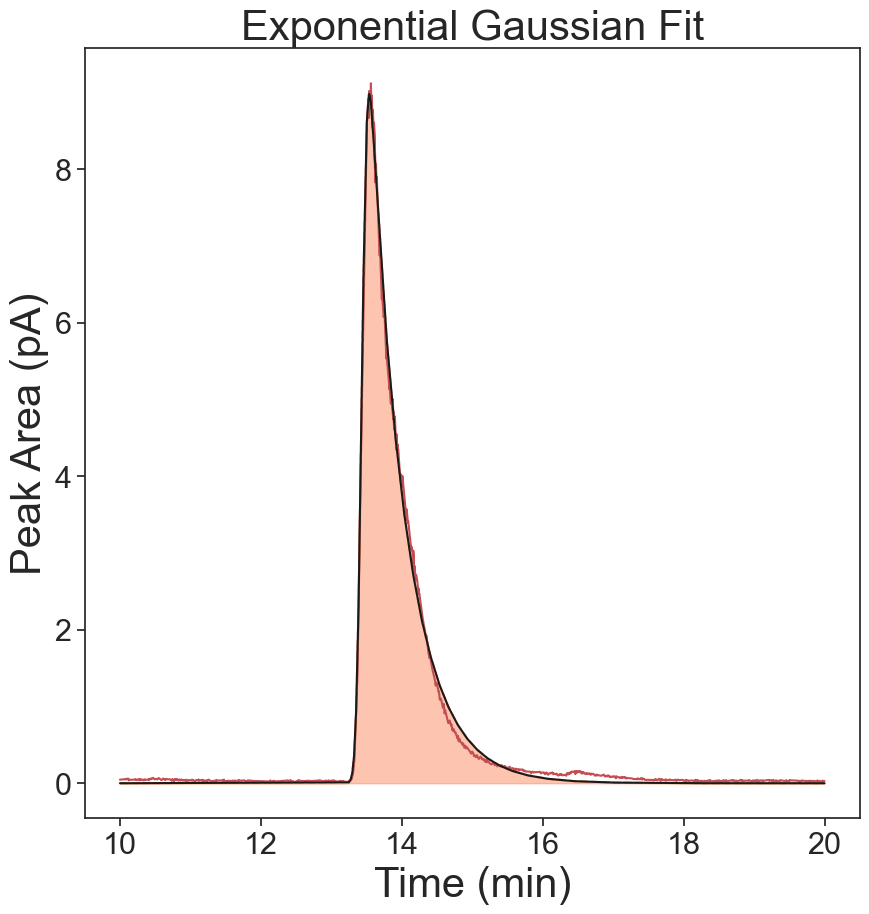

Skew Gaussian
[8.80571635]
0.3954742068006274


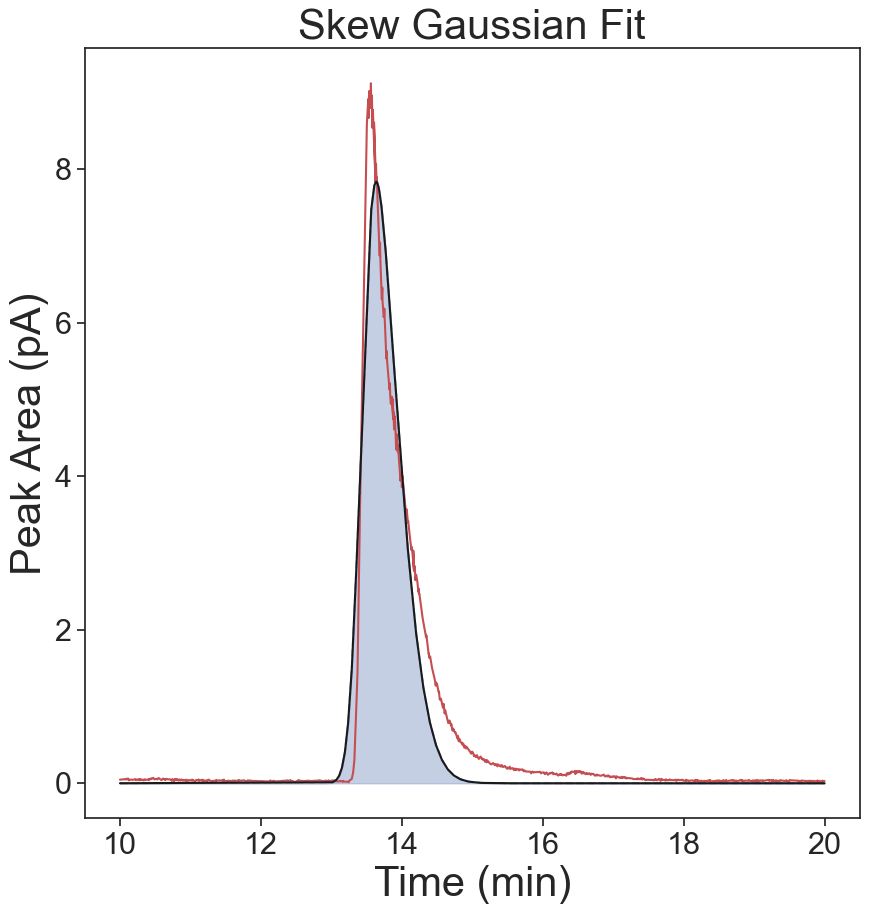

Voigt
[8.80571635]
0.5676187704071047


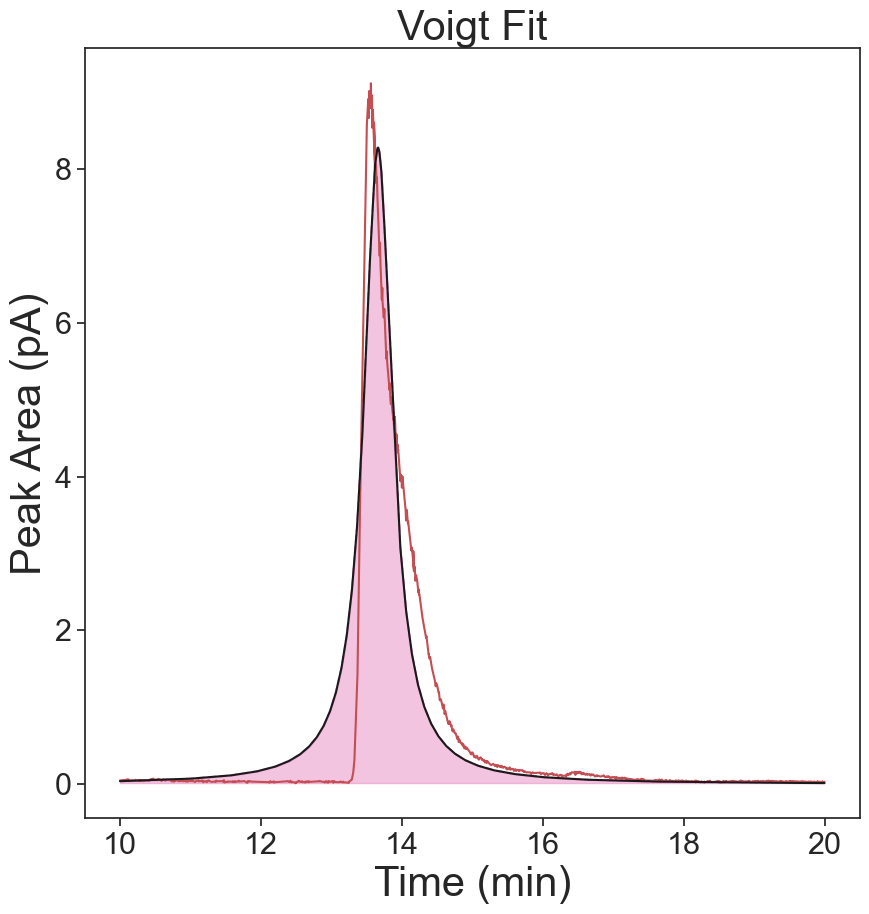

/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


Gaussian
[8.81140608]
-5903.872358536078
-5903.872358536078
0.6069934576844428


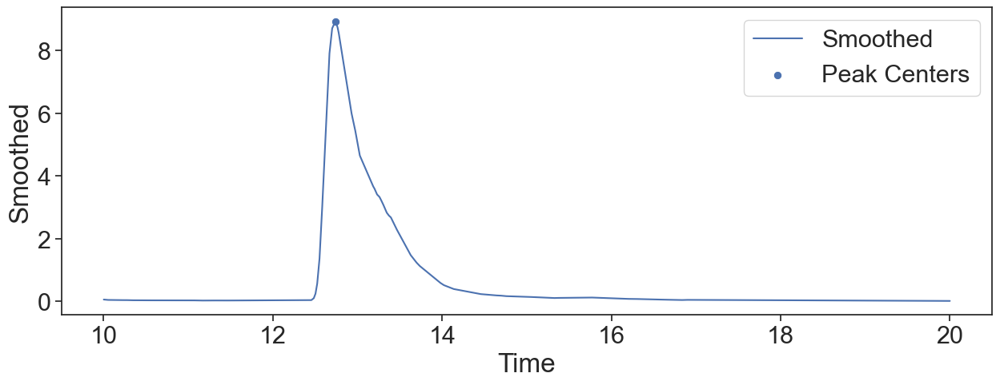

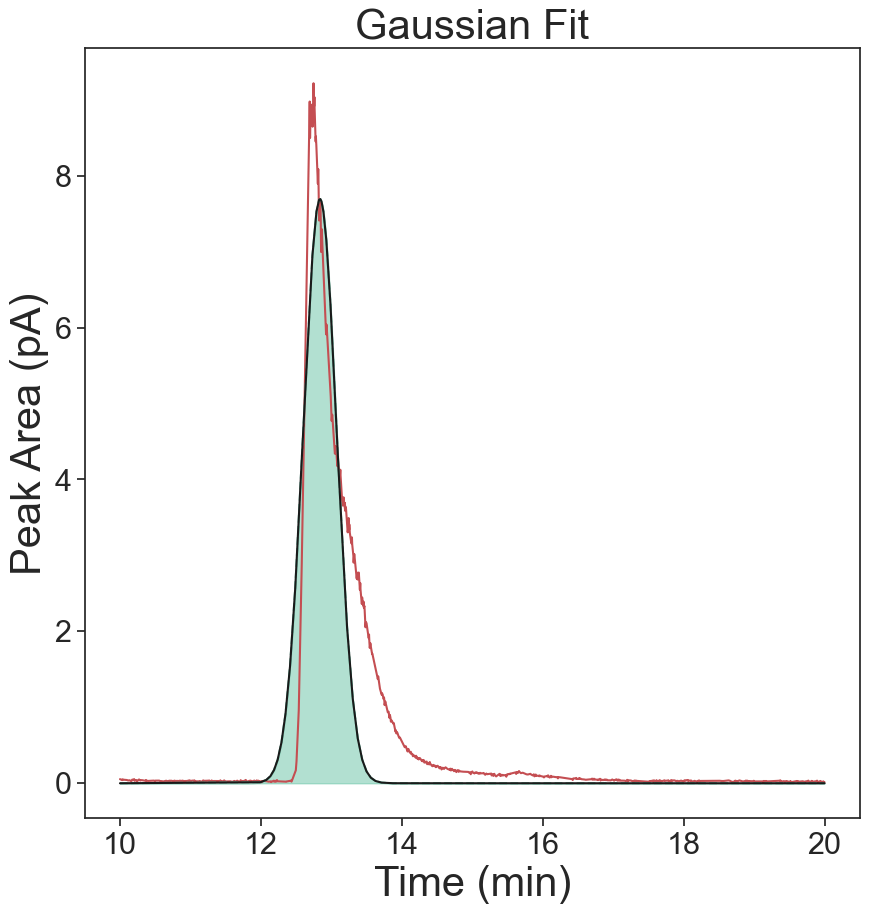

Exp Gaussian
[8.81140608]
0.08136952463080145


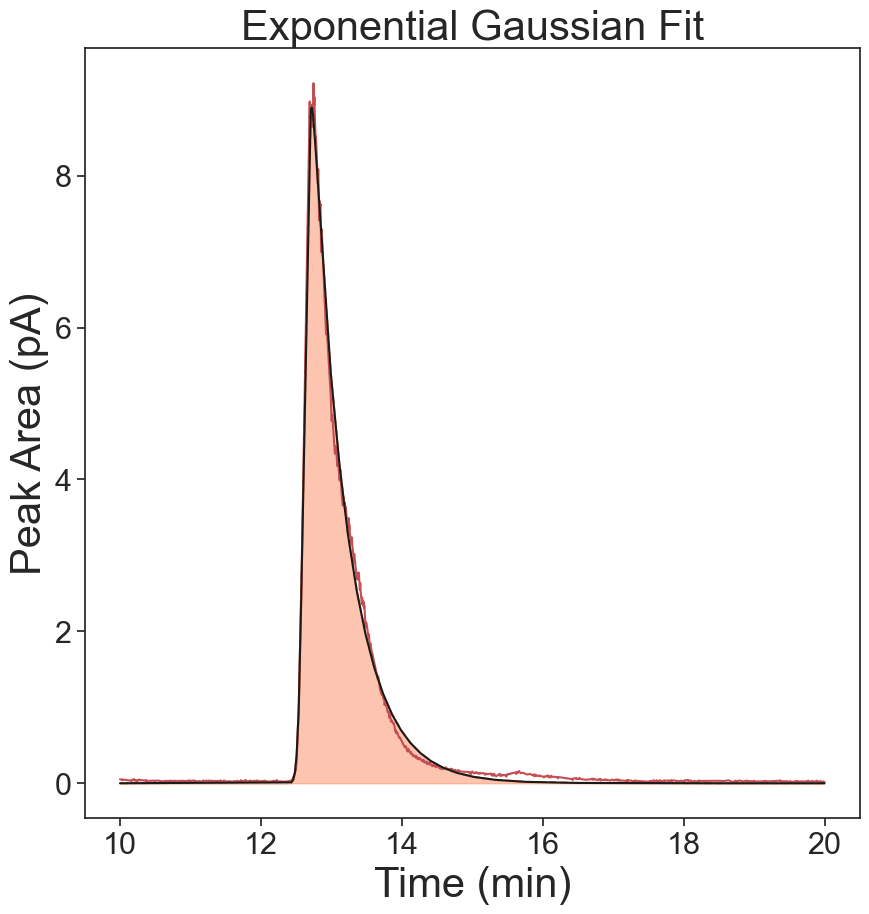

Skew Gaussian
[8.81140608]
0.4061177866682584


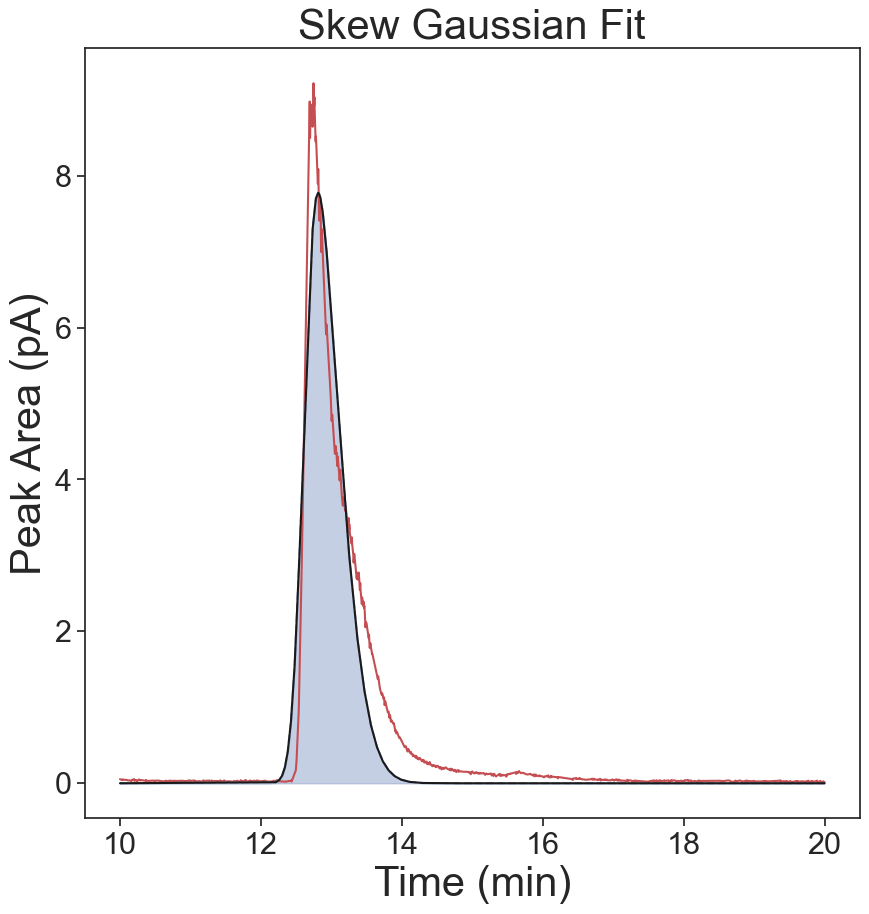

Voigt
[8.81140608]
0.556673342726656


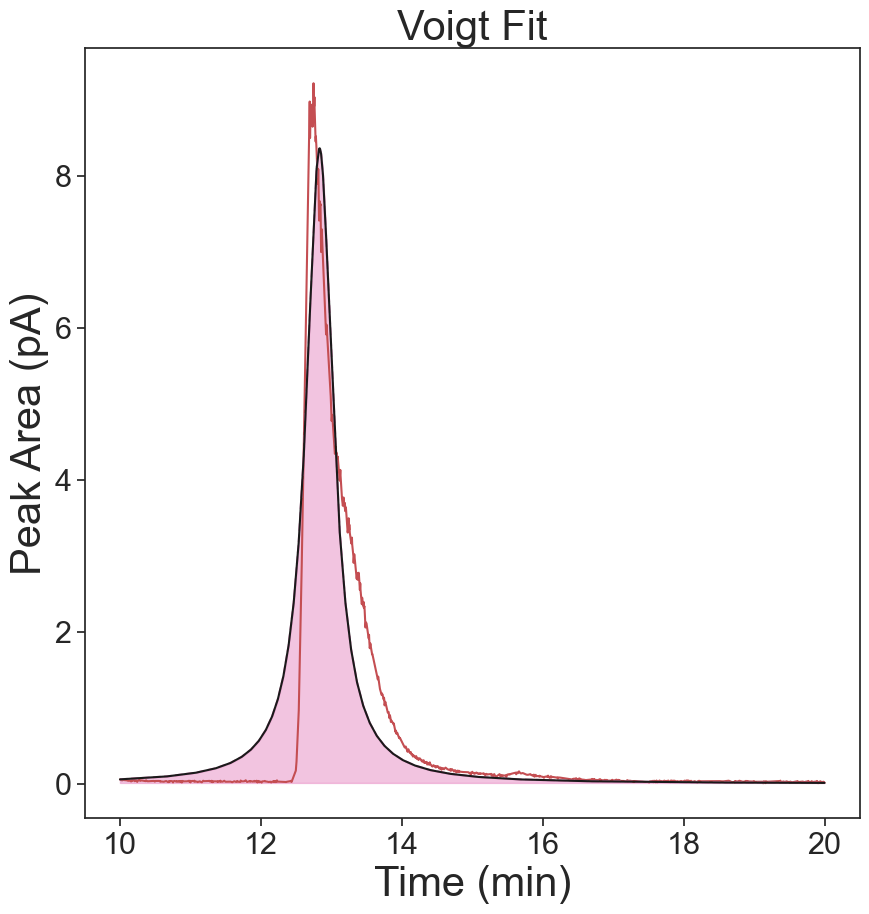

Gaussian
[6.6440458]
-11654.493558398022
-11654.493558398022
0.37410742675811987


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


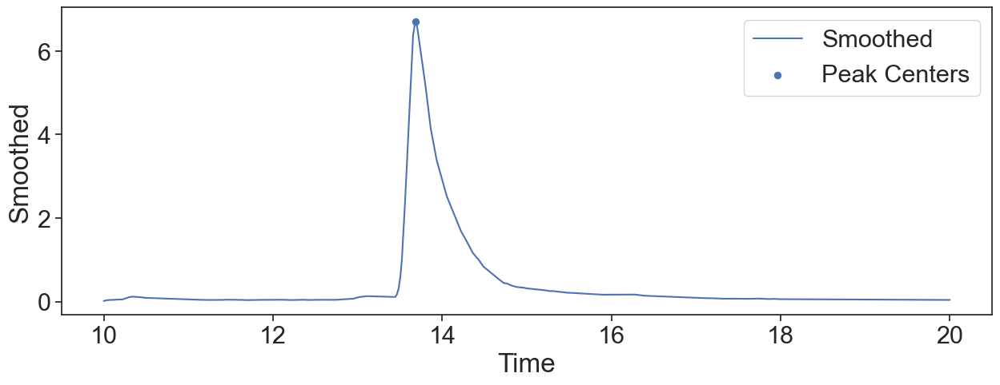

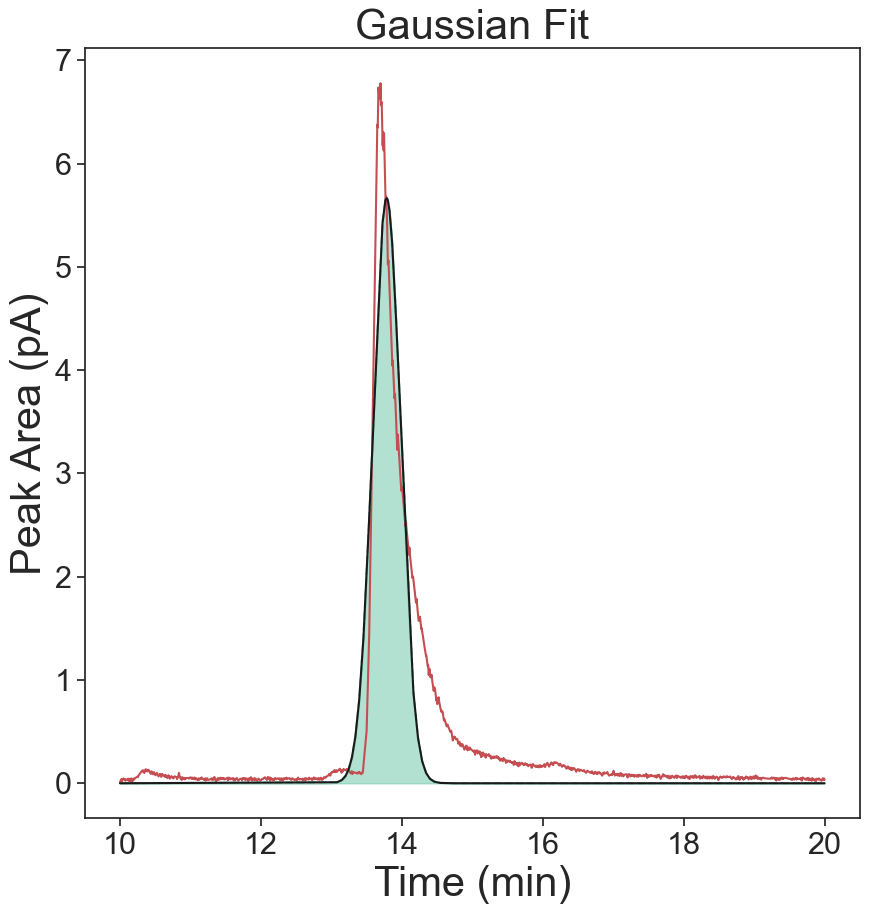

Exp Gaussian
[6.6440458]
0.09137287635359843


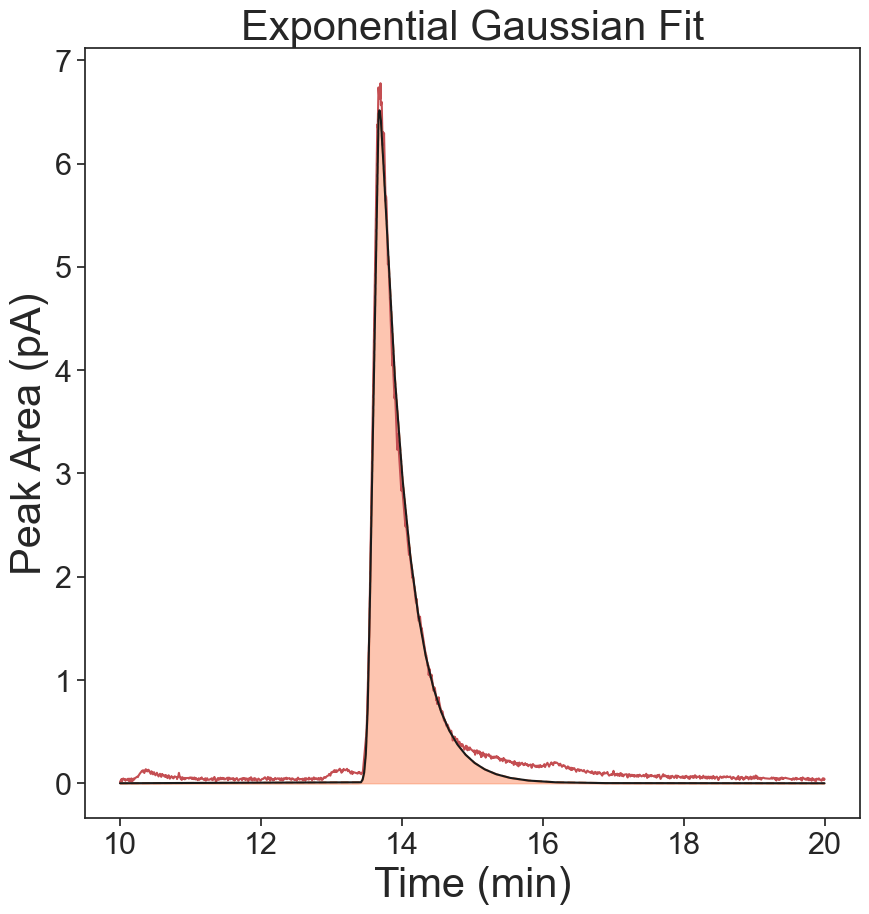

Skew Gaussian
[6.6440458]
0.26116269336971565


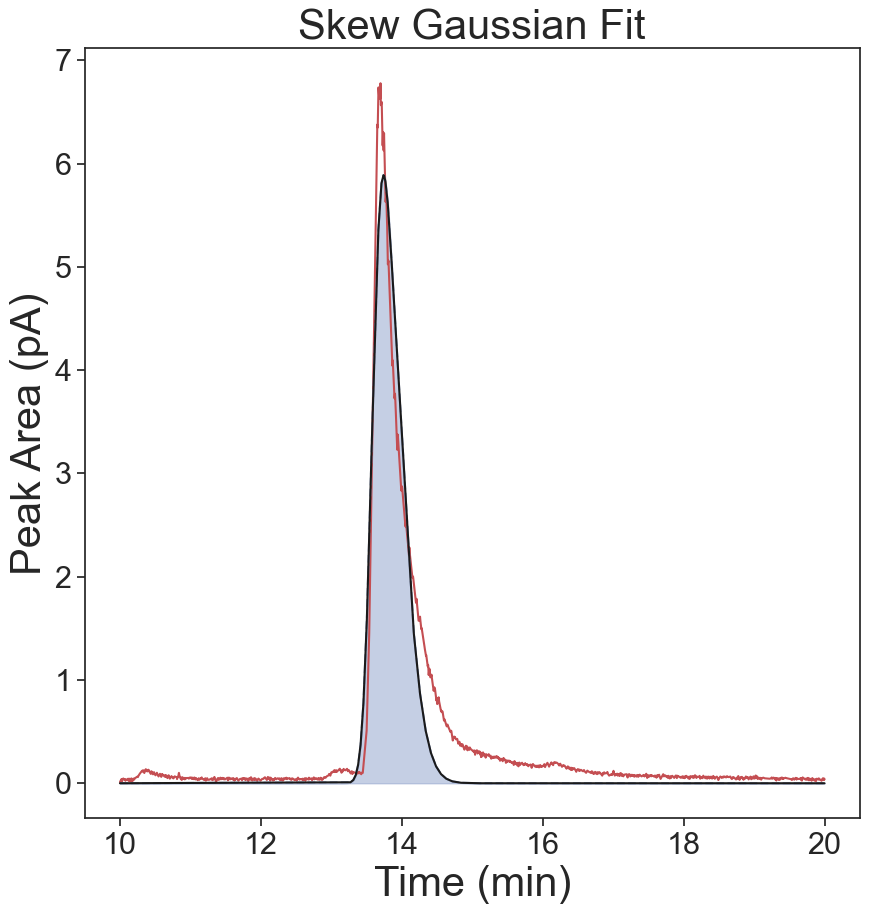

Voigt
[6.6440458]
0.33356369865633856


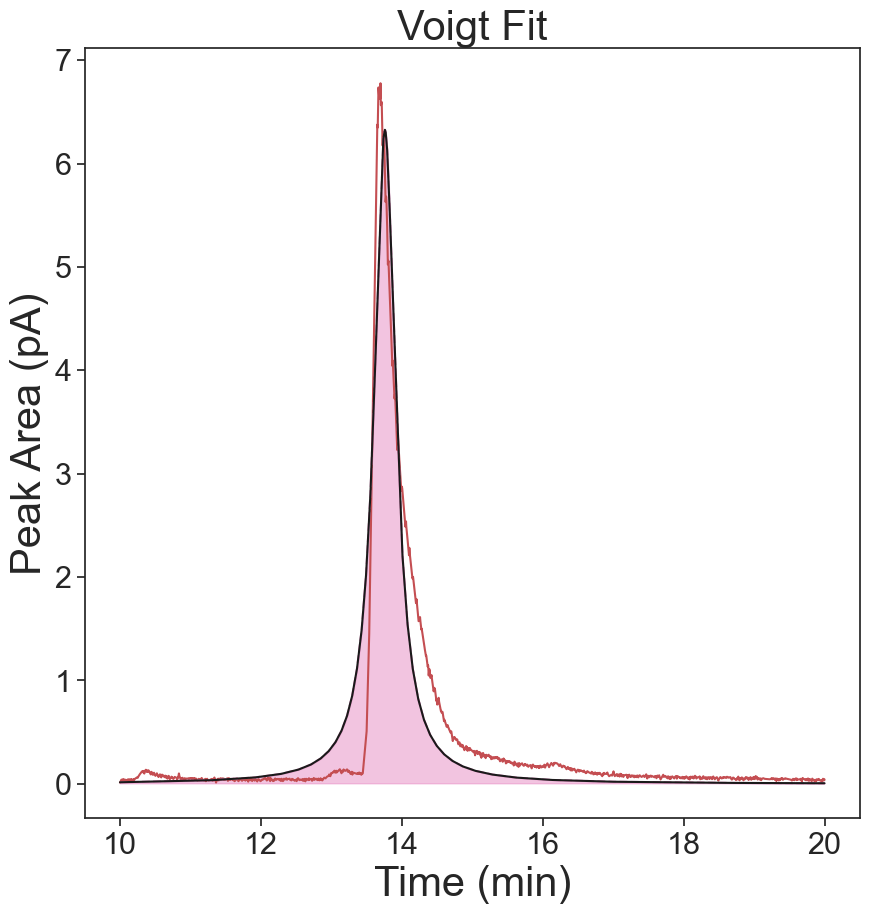

Gaussian
[3.68981842]
-20548.24401413901
-20548.24401413901
0.17690612725043556


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


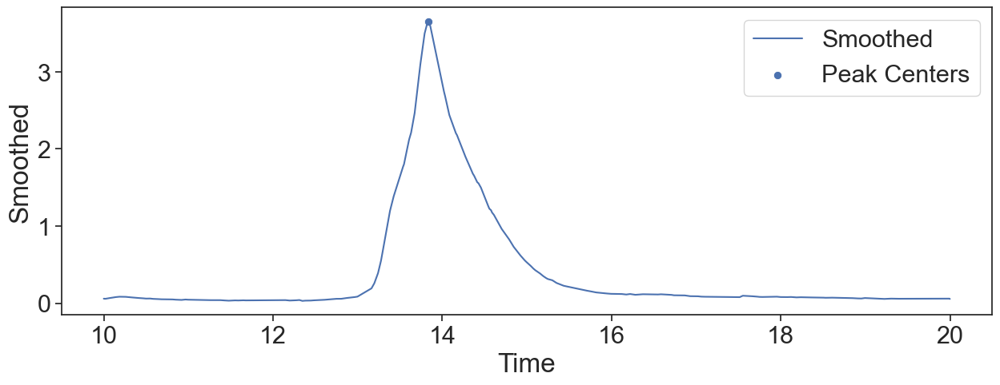

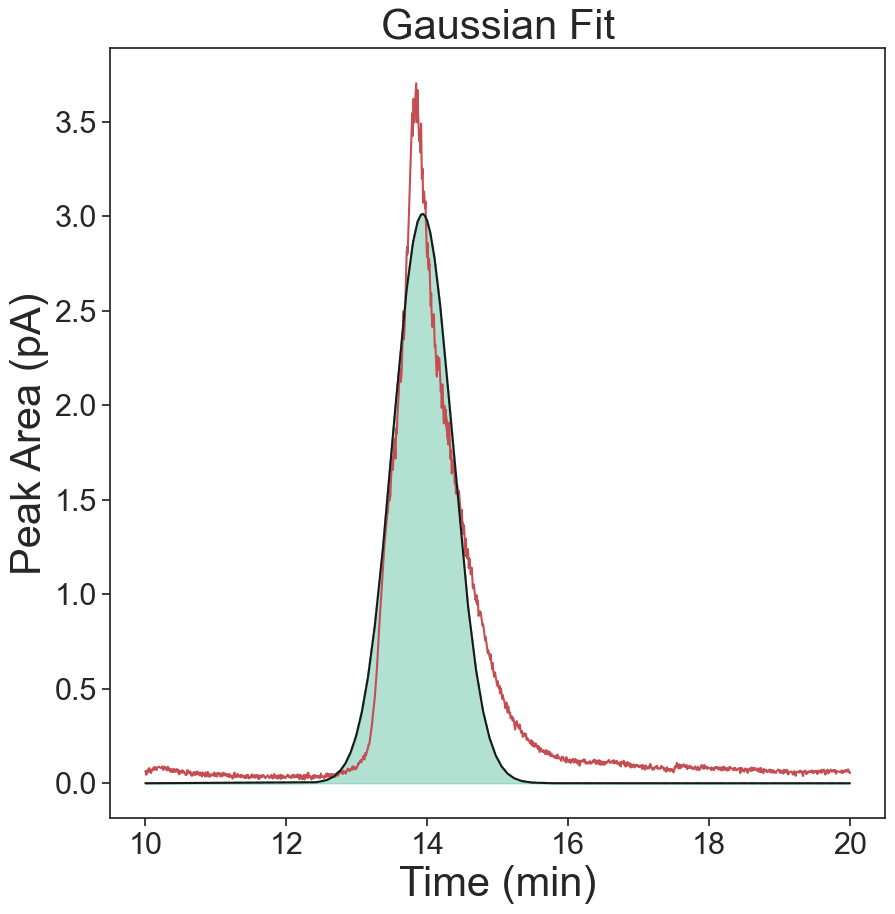

Exp Gaussian
[3.68981842]
0.08959752228653123


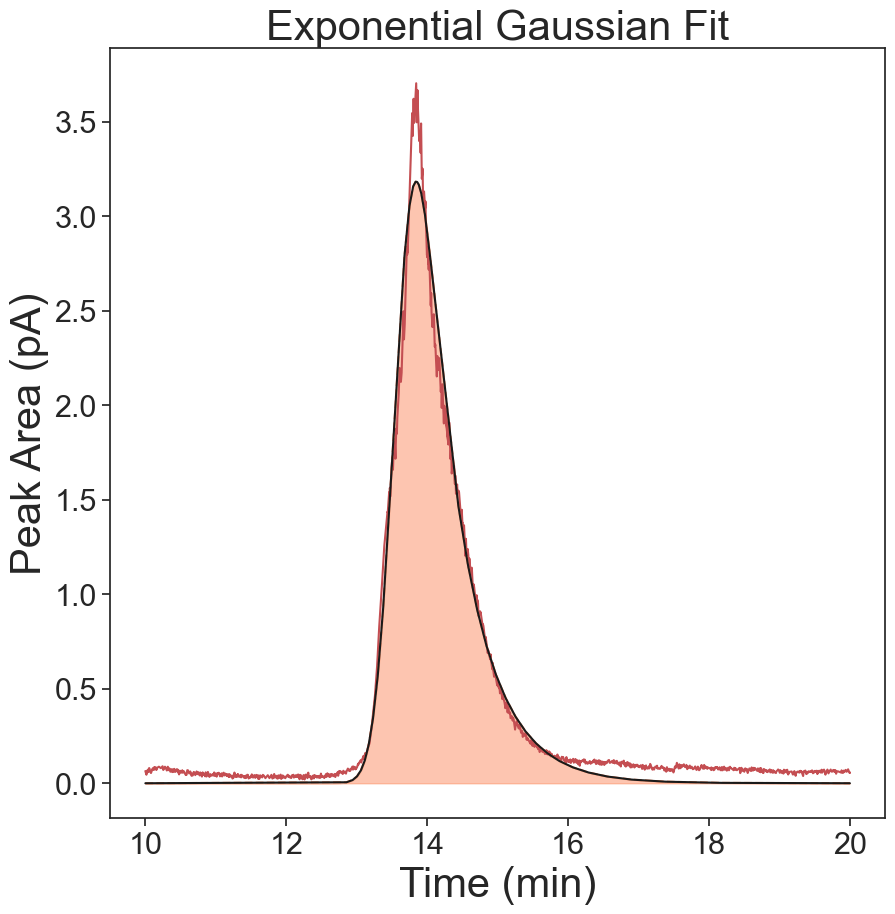

Skew Gaussian
[3.68981842]
0.11314455910650863


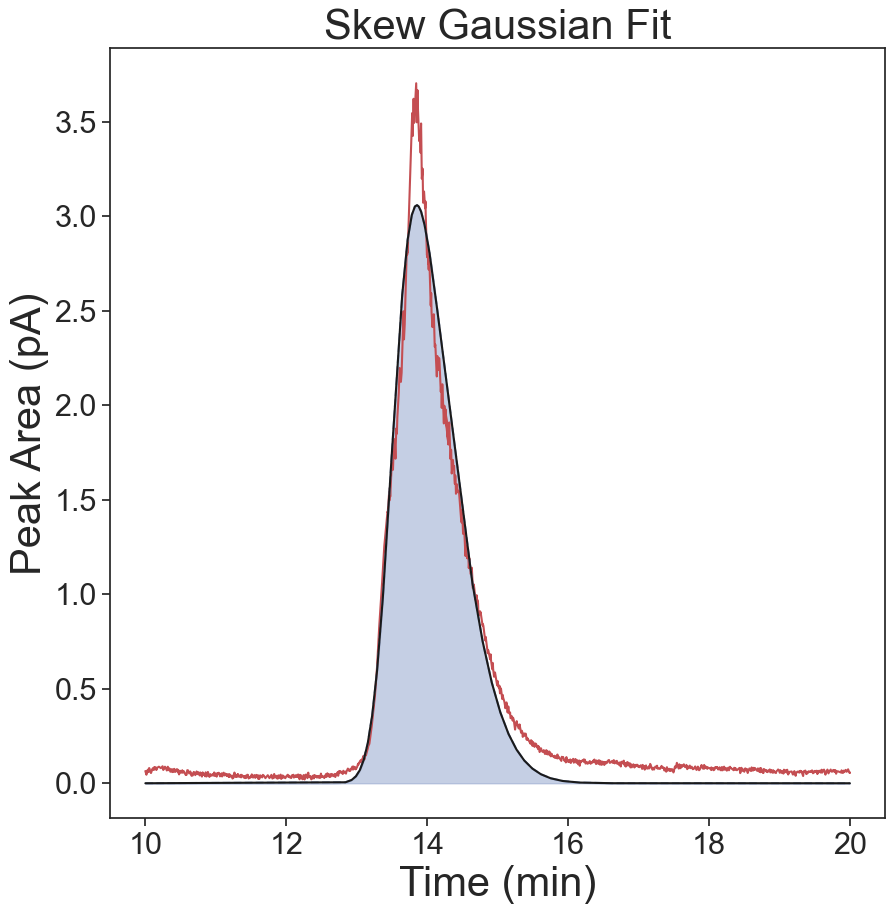

Voigt
[3.68981842]
0.1568557434185733


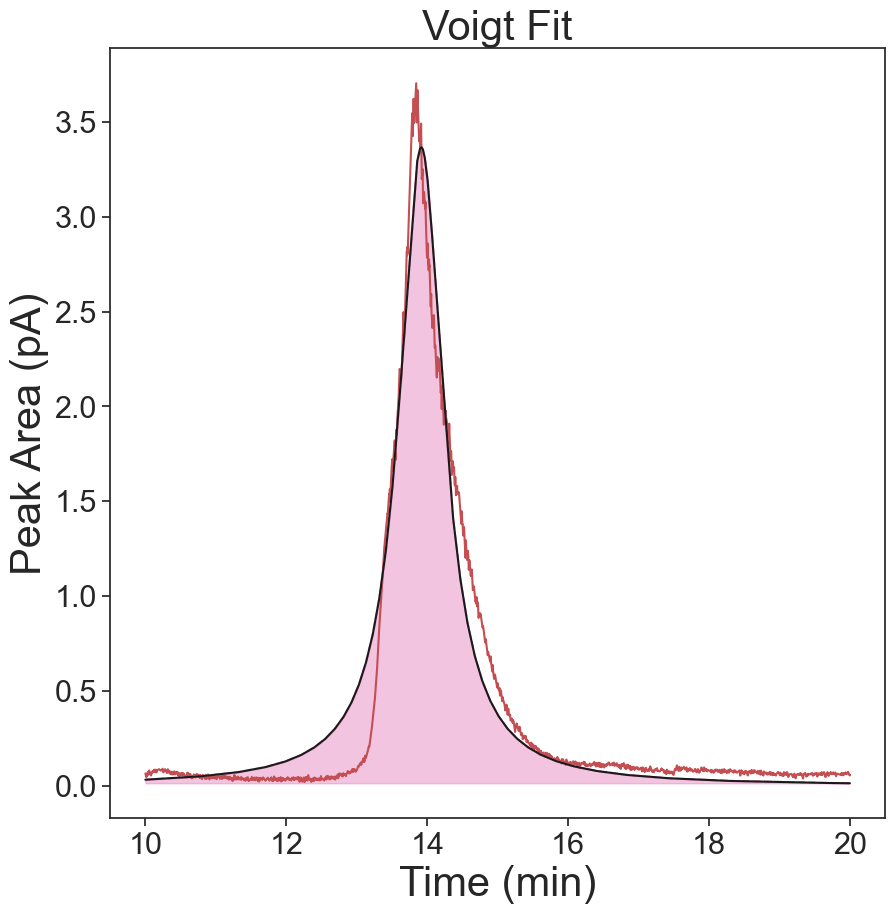

Gaussian
[6.89655928]
-9927.40550929324
-9927.40550929324
0.4325243677036392


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


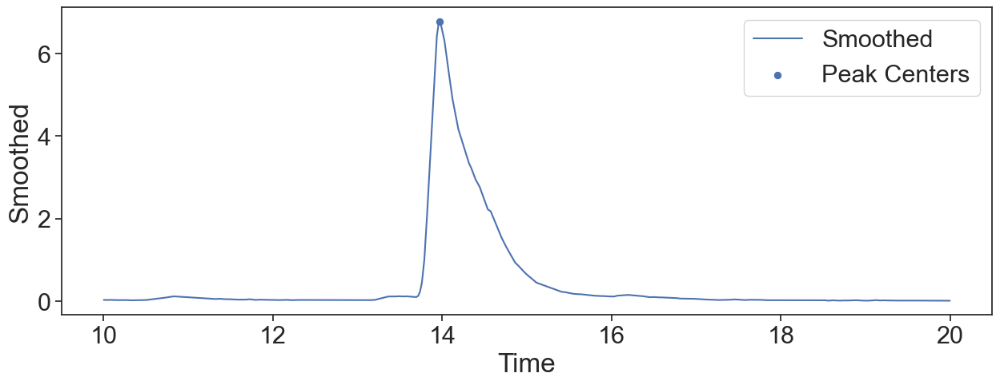

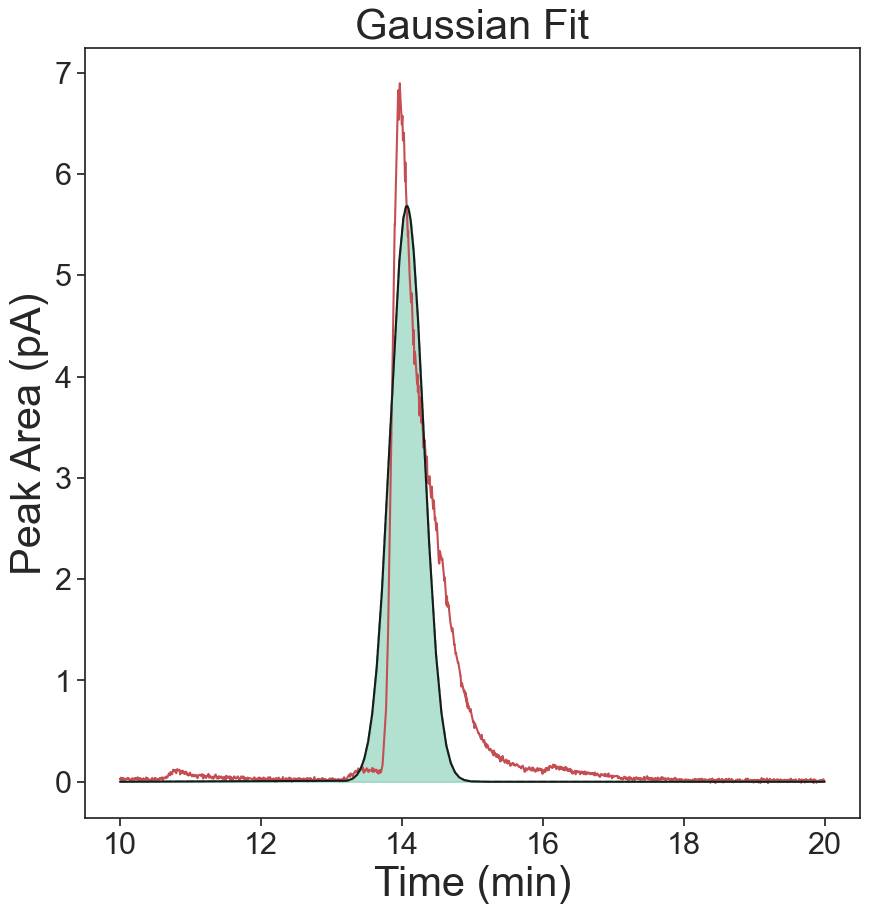

Exp Gaussian
[6.89655928]
0.07069111215965959


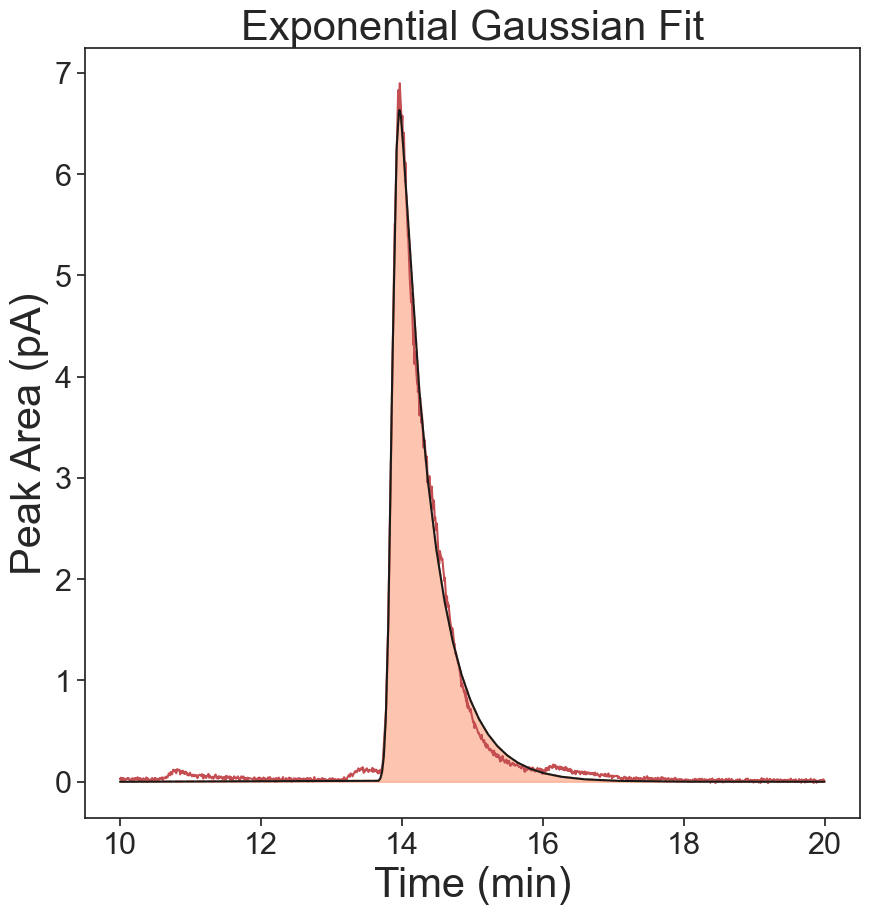

Skew Gaussian
[6.89655928]
0.27617388216343025


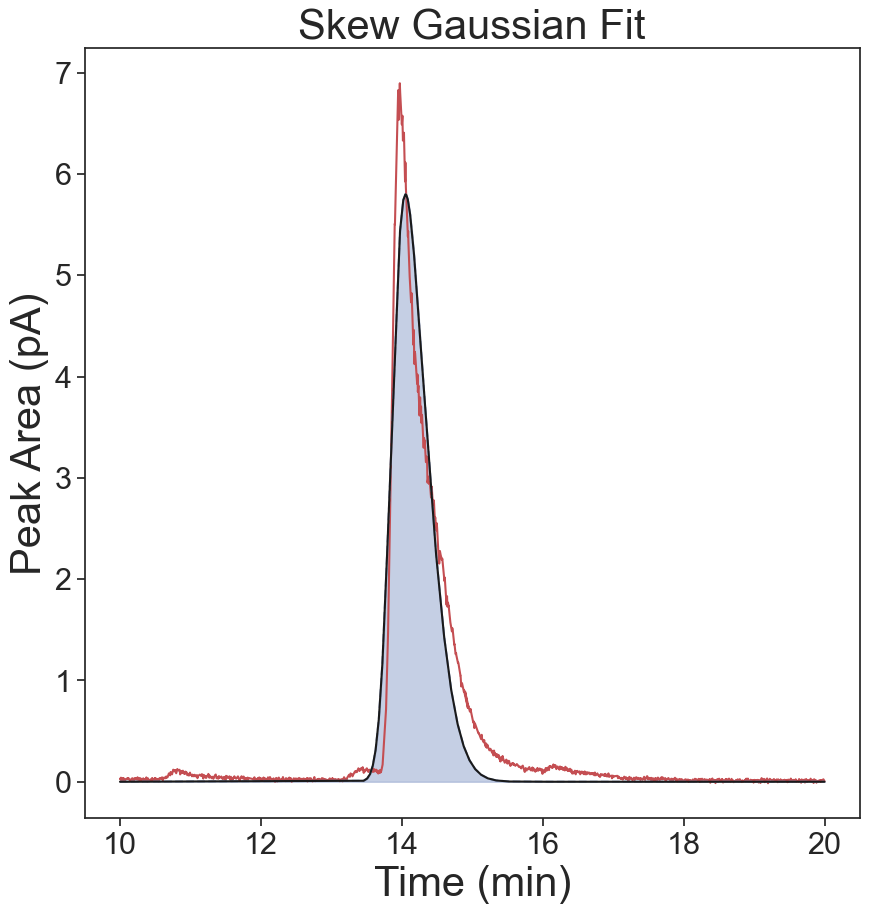

Voigt
[6.89655928]
0.39487614543962457


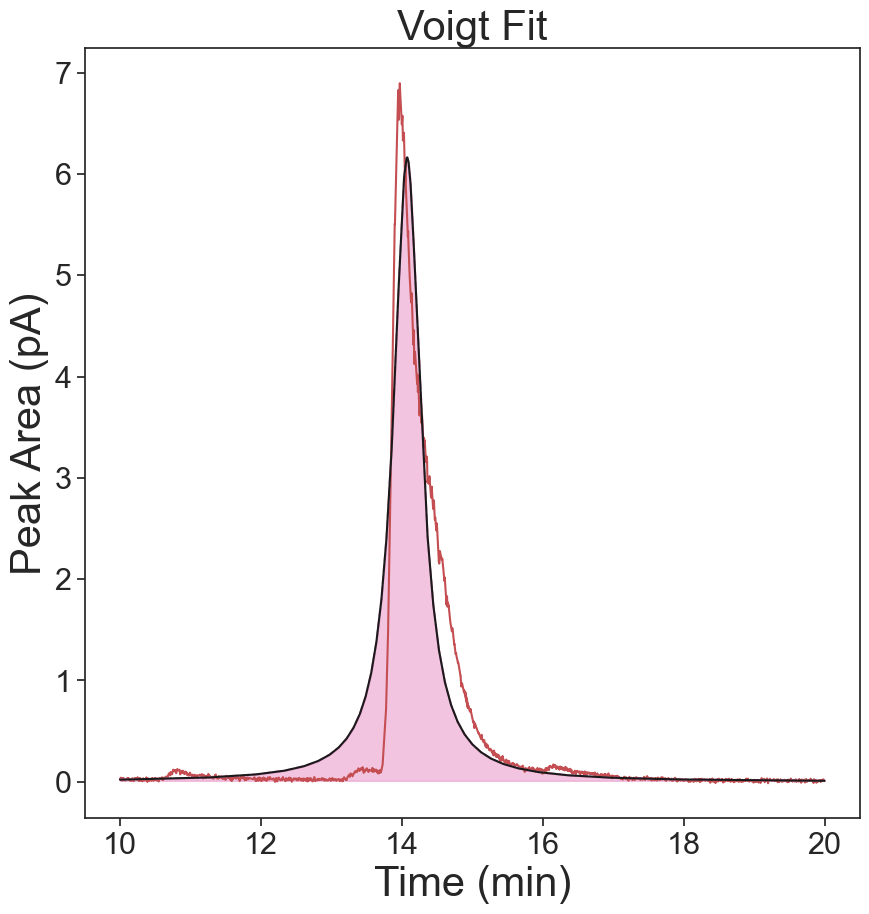

/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


Gaussian
[6.84660836]
-9358.50086007837
-9358.50086007837
0.4538085461455572


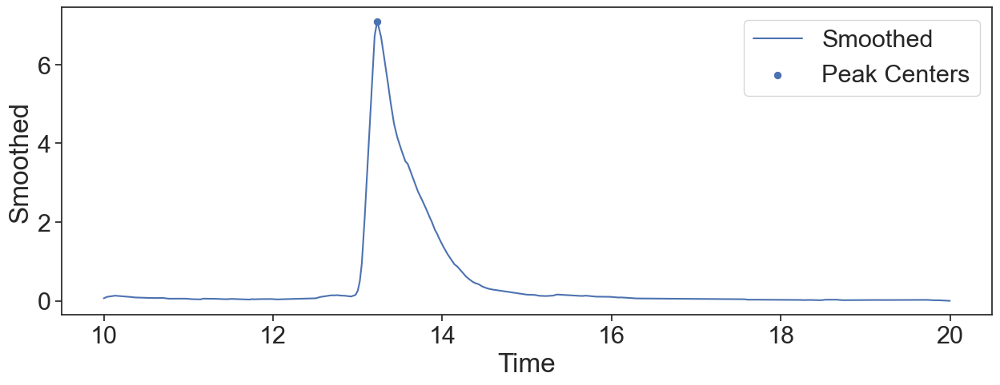

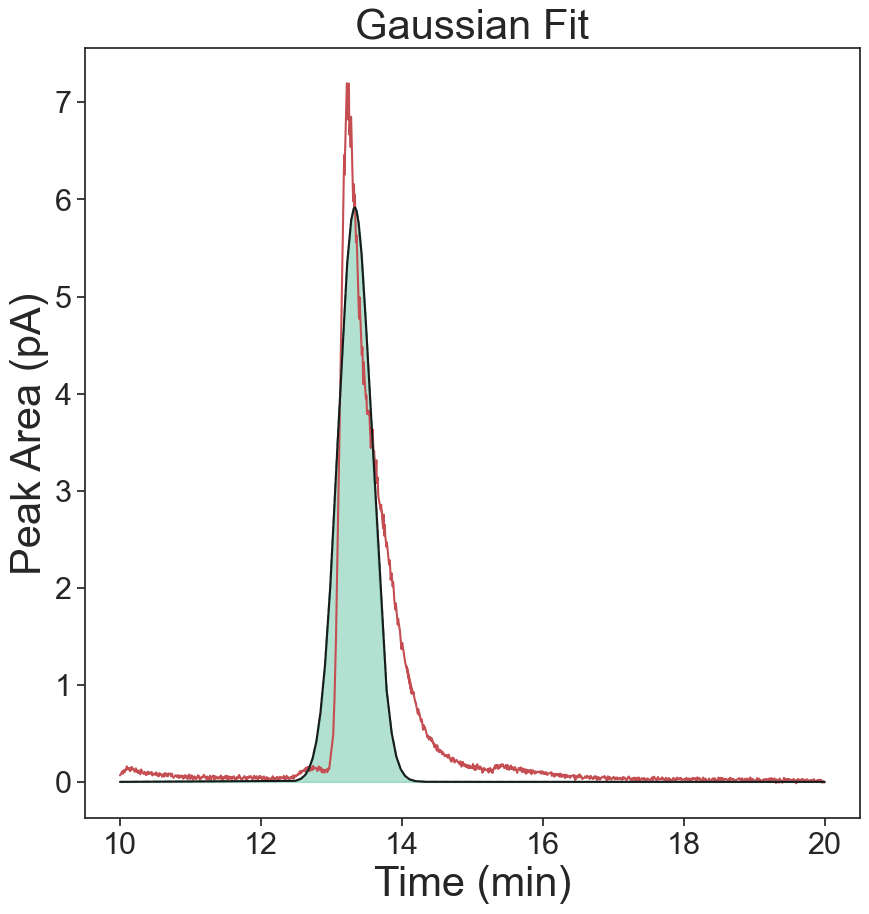

Exp Gaussian
[6.84660836]
0.08051066335557551


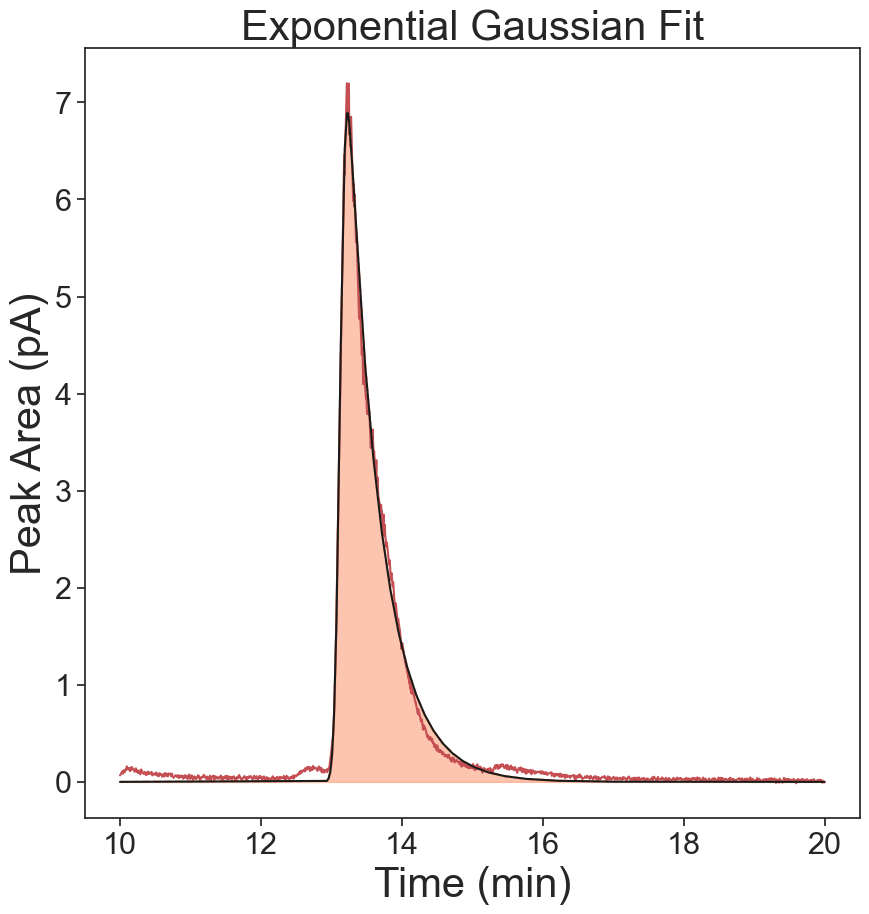

Skew Gaussian
[6.84660836]
0.290727415054641


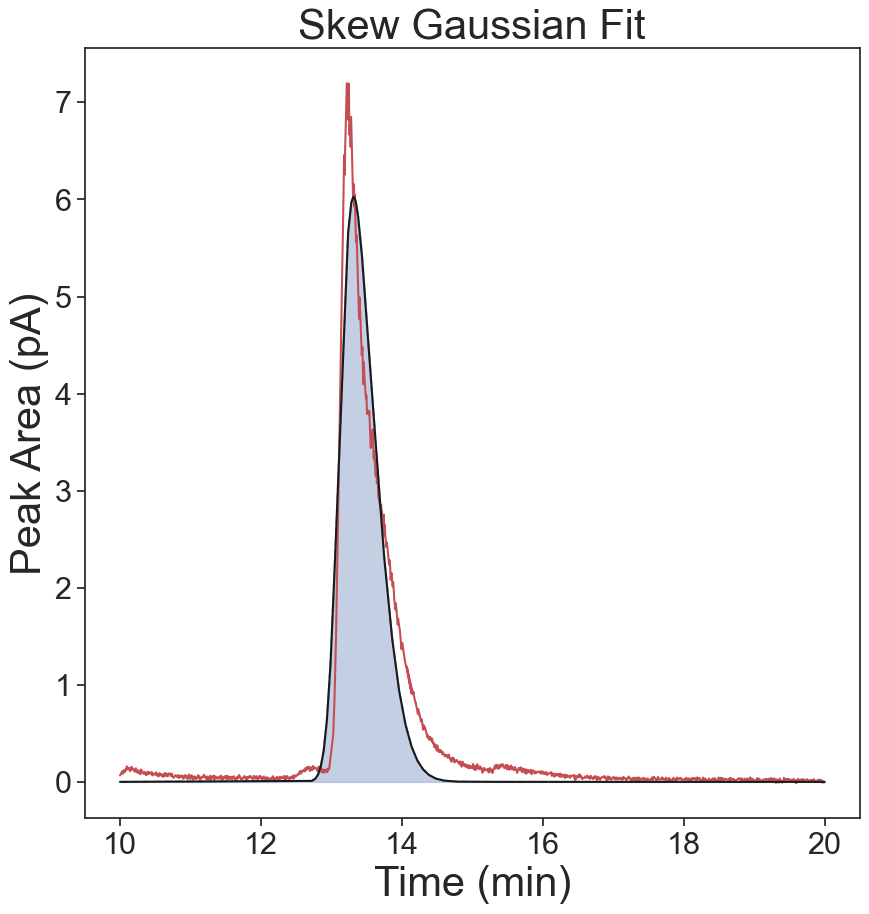

Voigt
[6.84660836]
0.40875919584140274


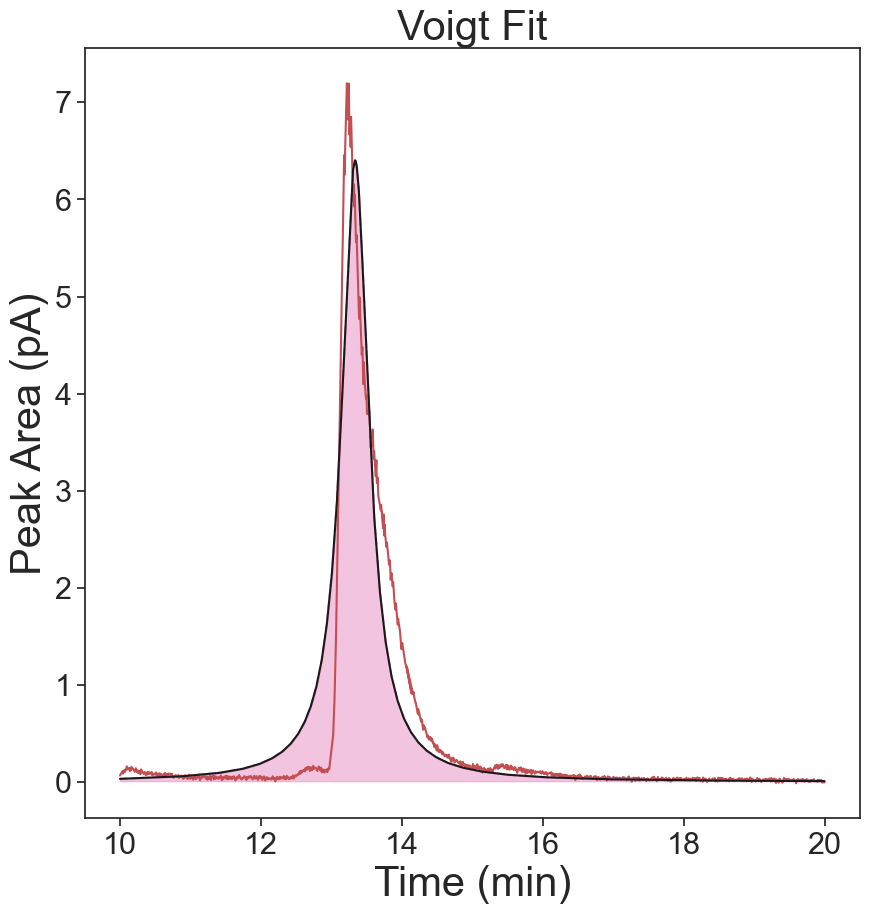

Gaussian
[7.19962747]
-9537.613878088108
-9537.613878088108
0.4470167261474005


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


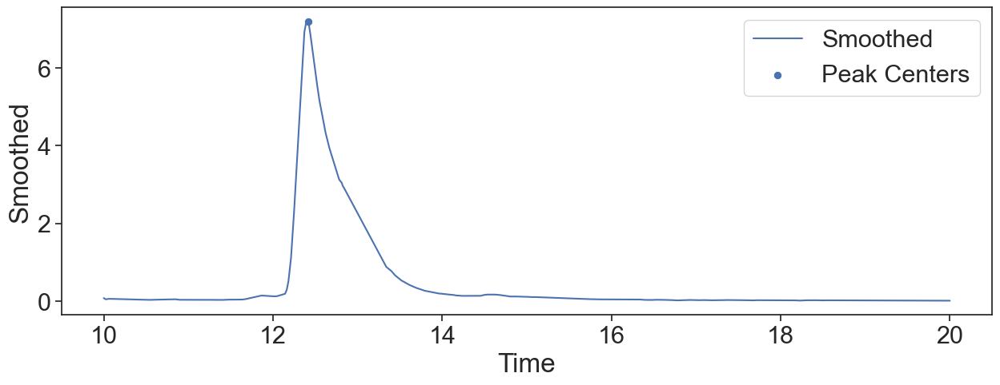

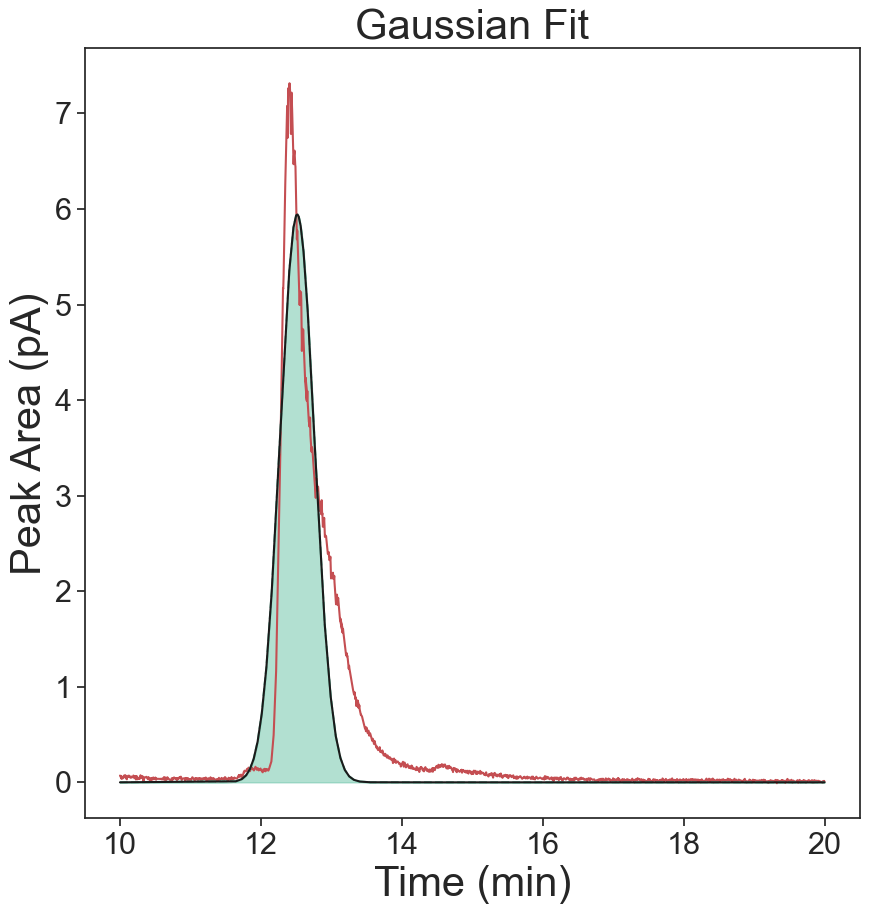

Exp Gaussian
[7.19962747]
0.07987554456776408


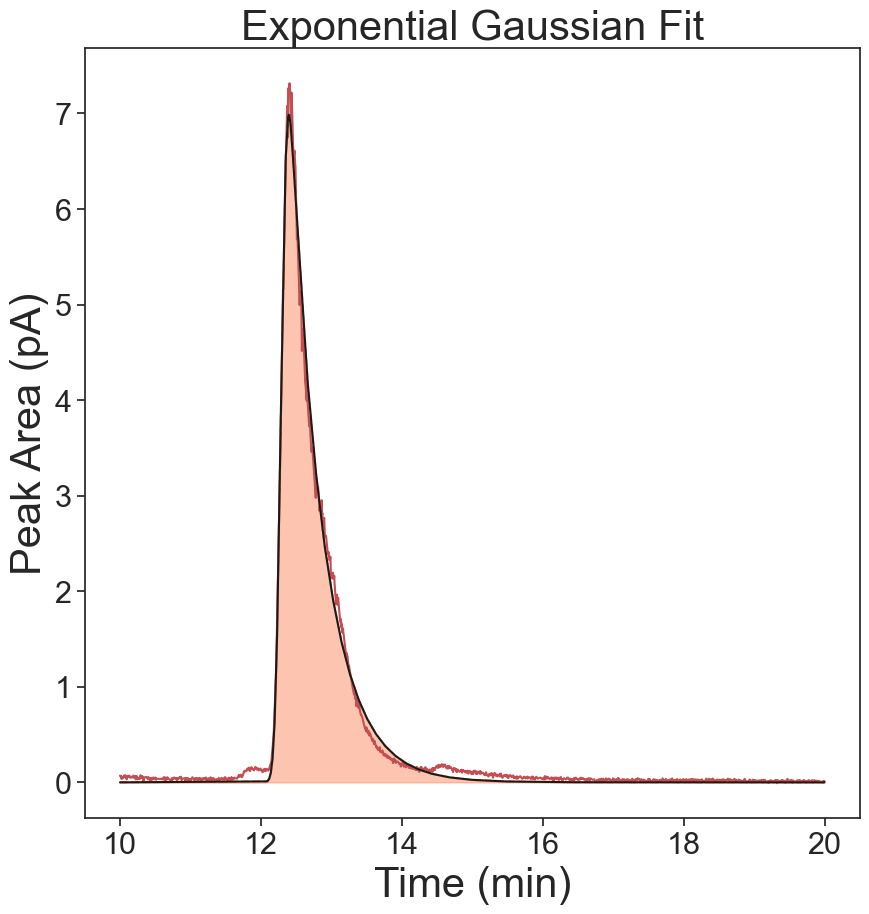

Skew Gaussian
[7.19962747]
0.29915247908804793


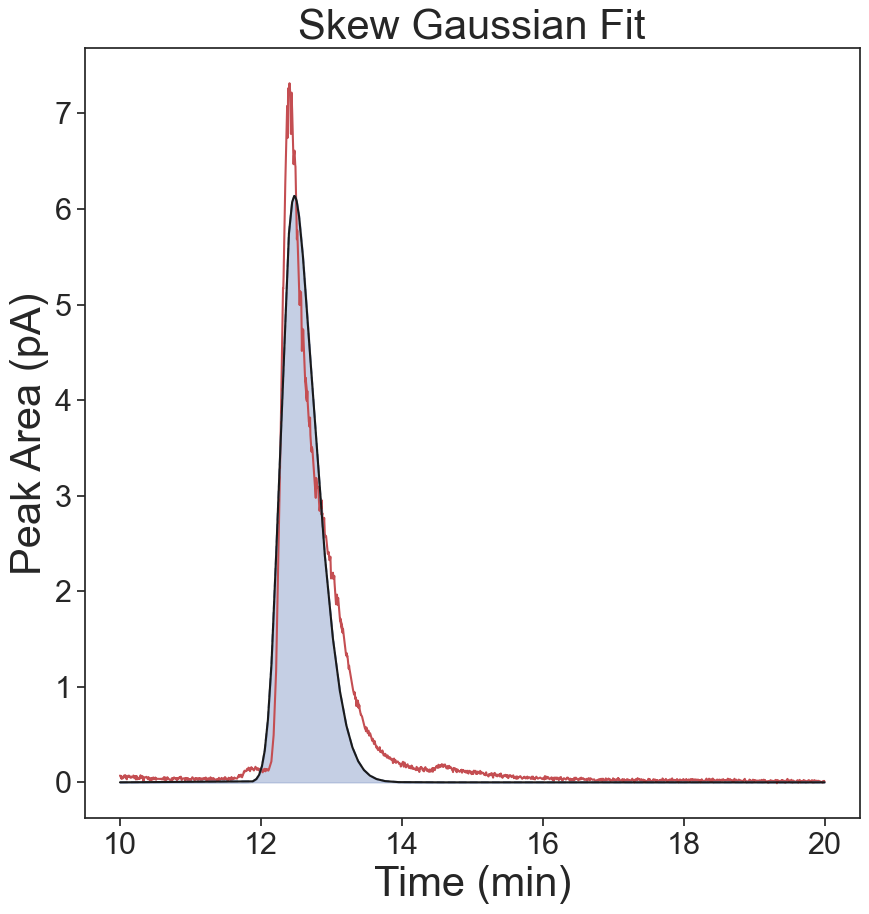

Voigt
[7.19962747]
0.40967430964888396


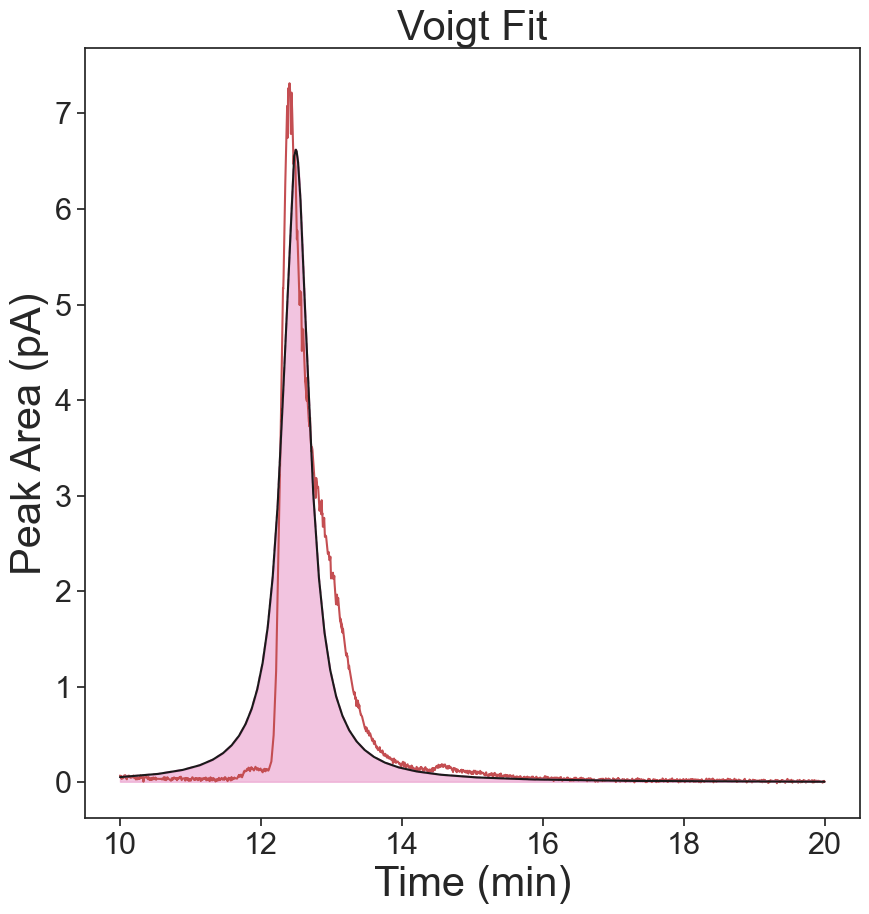

Gaussian
[6.6440458]
-11654.493558398022
-11654.493558398022
0.37410742675811987


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


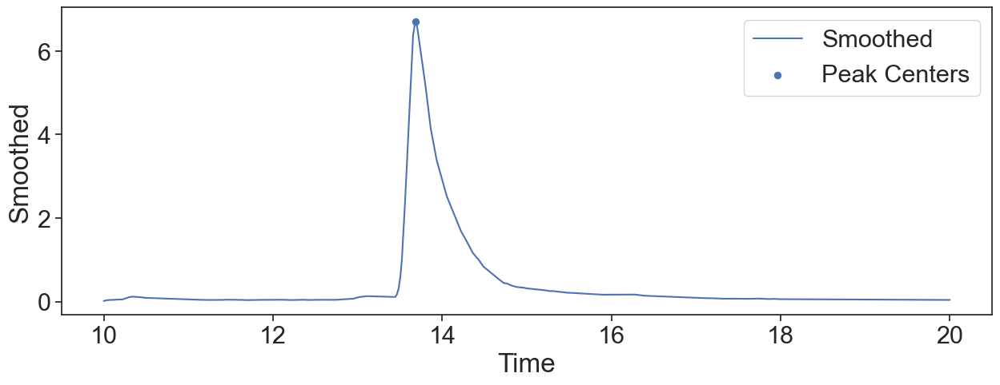

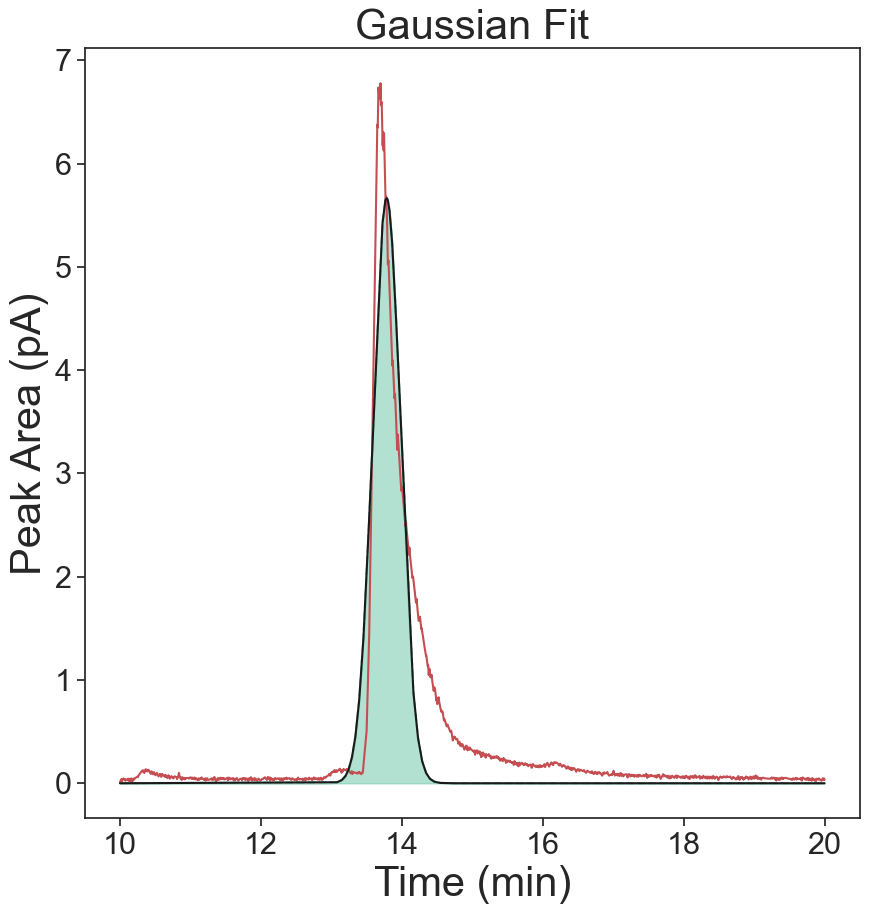

Exp Gaussian
[6.6440458]
0.09137287635359843


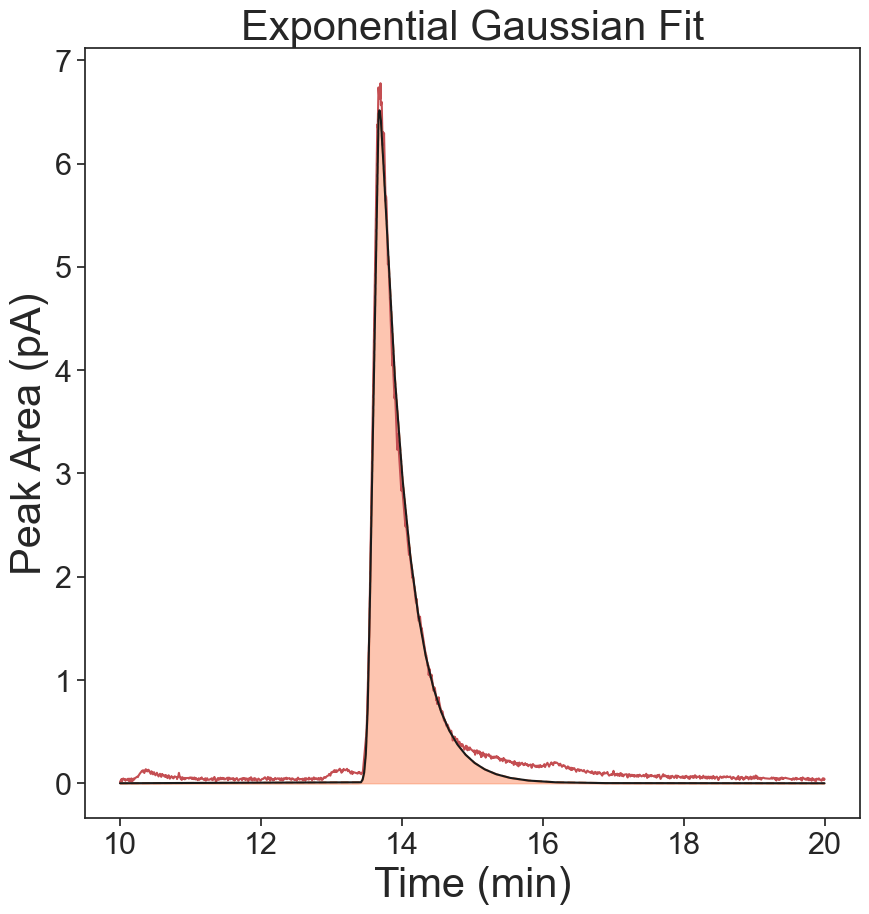

Skew Gaussian
[6.6440458]
0.26116269336971565


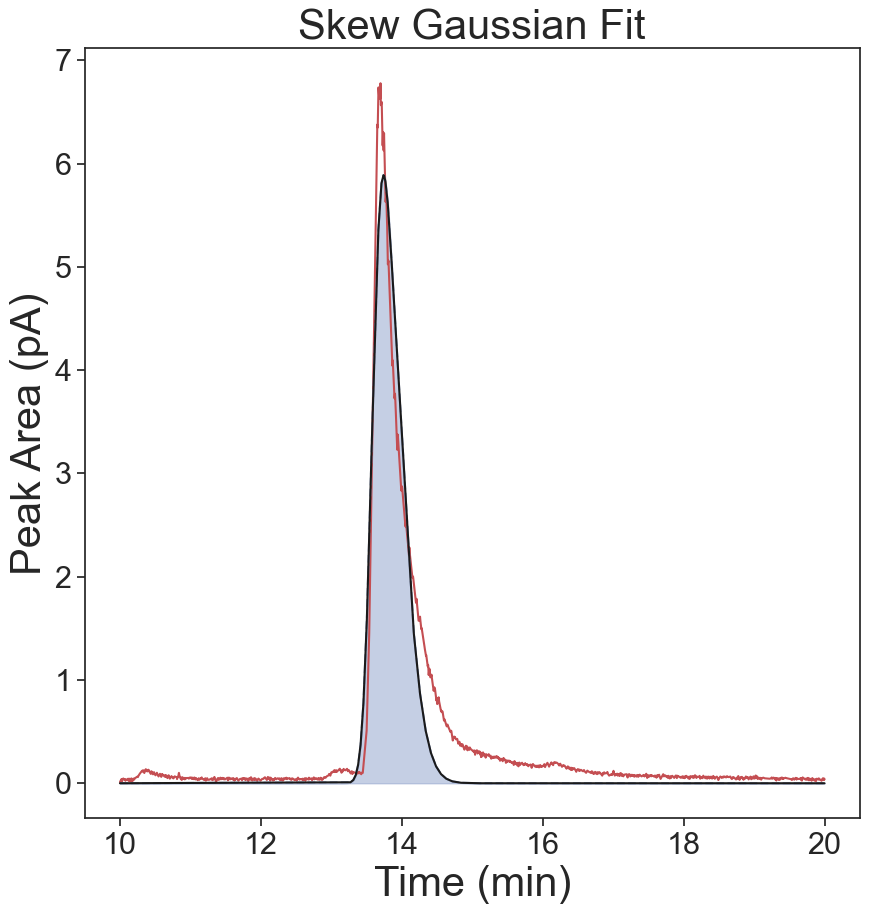

Voigt
[6.6440458]
0.33356369865633856


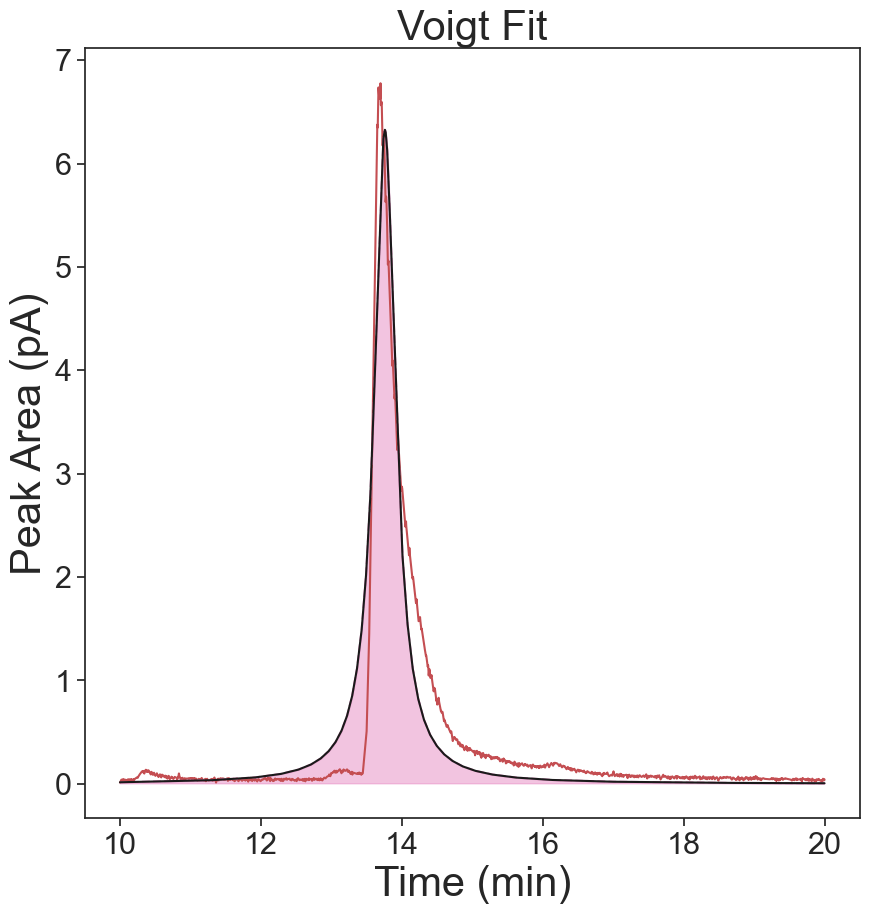

Gaussian
[4.34889002]
-17764.759811312535
-17764.759811312535
0.22362235312347625


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


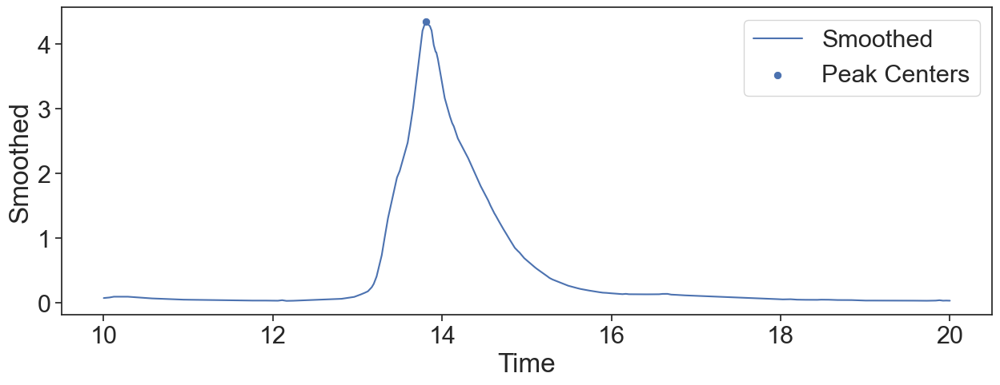

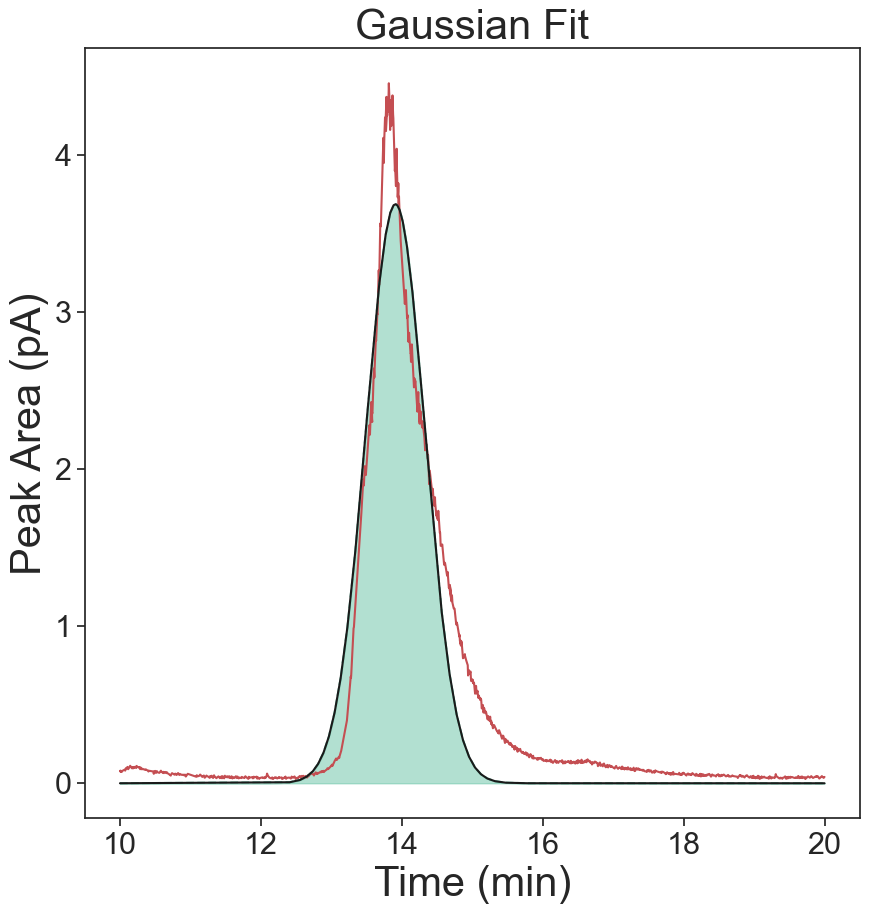

Exp Gaussian
[4.34889002]
0.09674114462711907


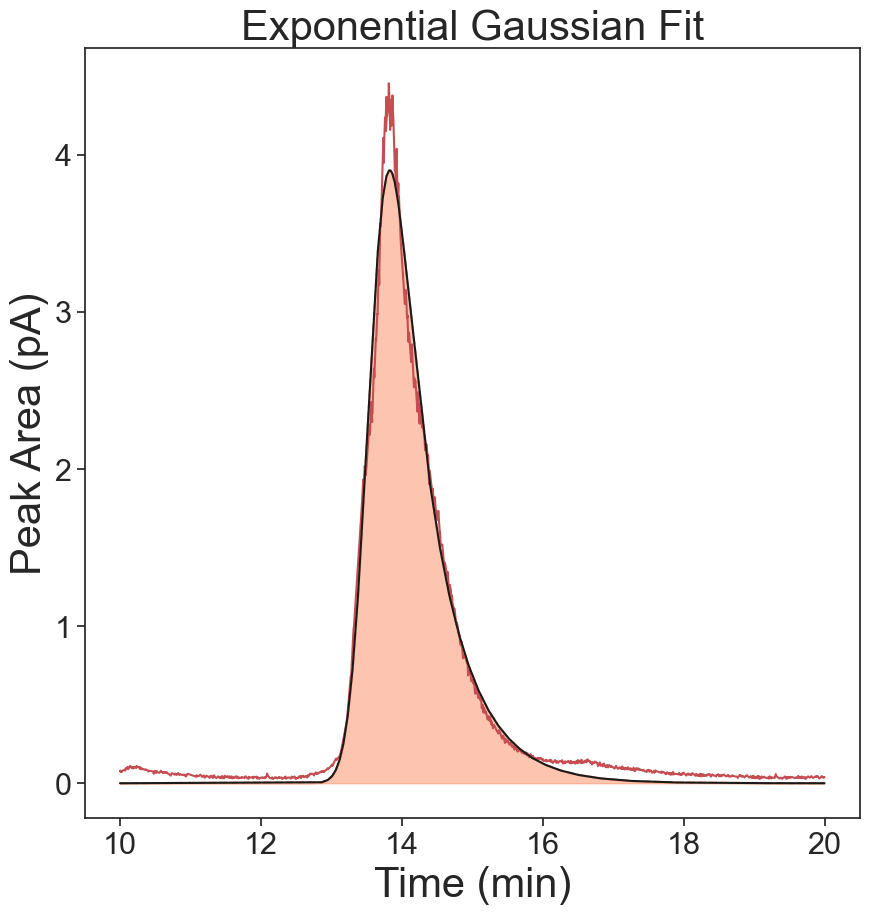

Skew Gaussian
[4.34889002]
0.1303184920332296


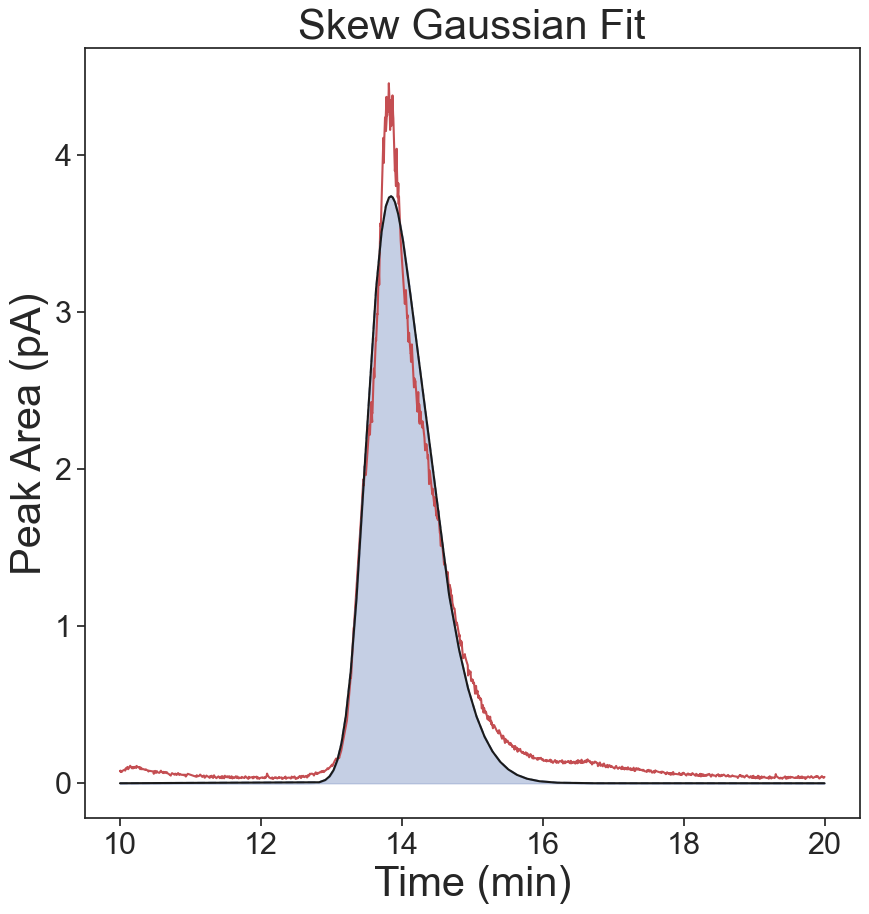

Voigt
[4.34889002]
0.201541560503855


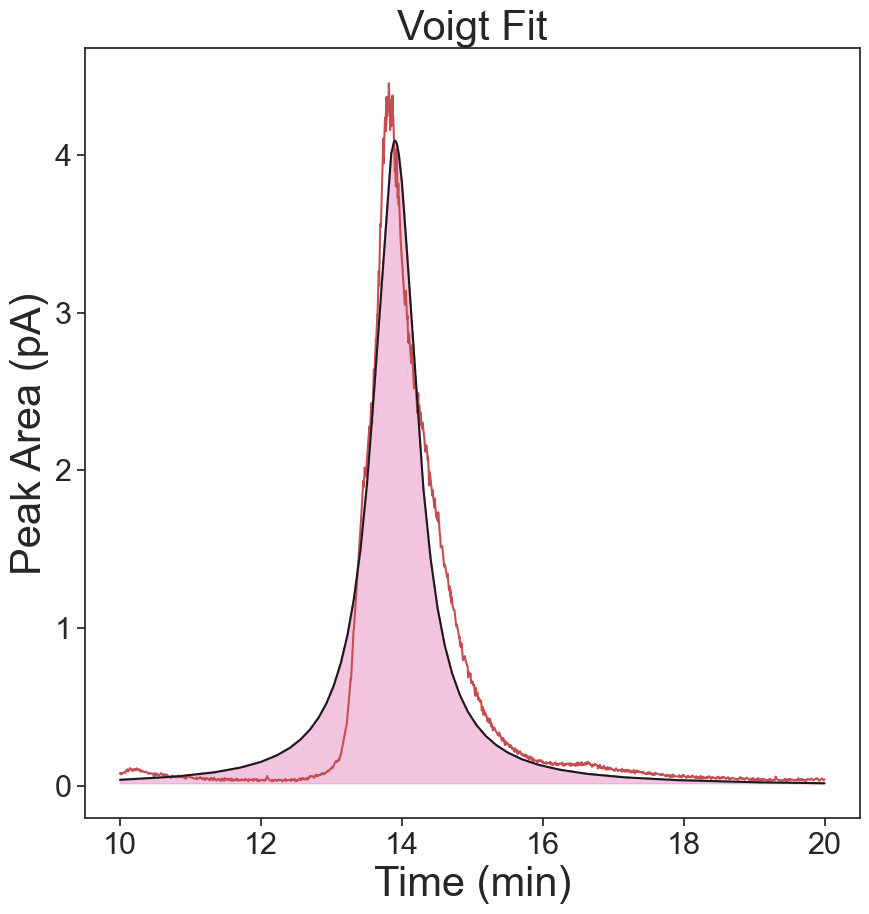

Gaussian
[7.00491729]
-8291.563555968056
-8291.563555968056
0.4964585839298946


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


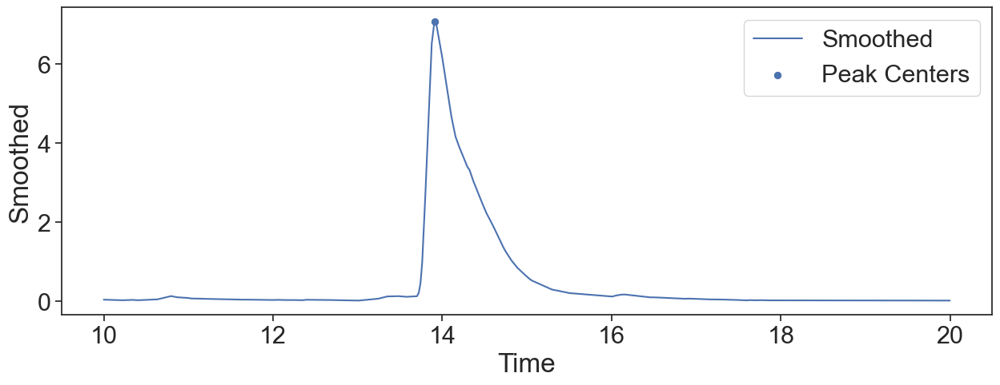

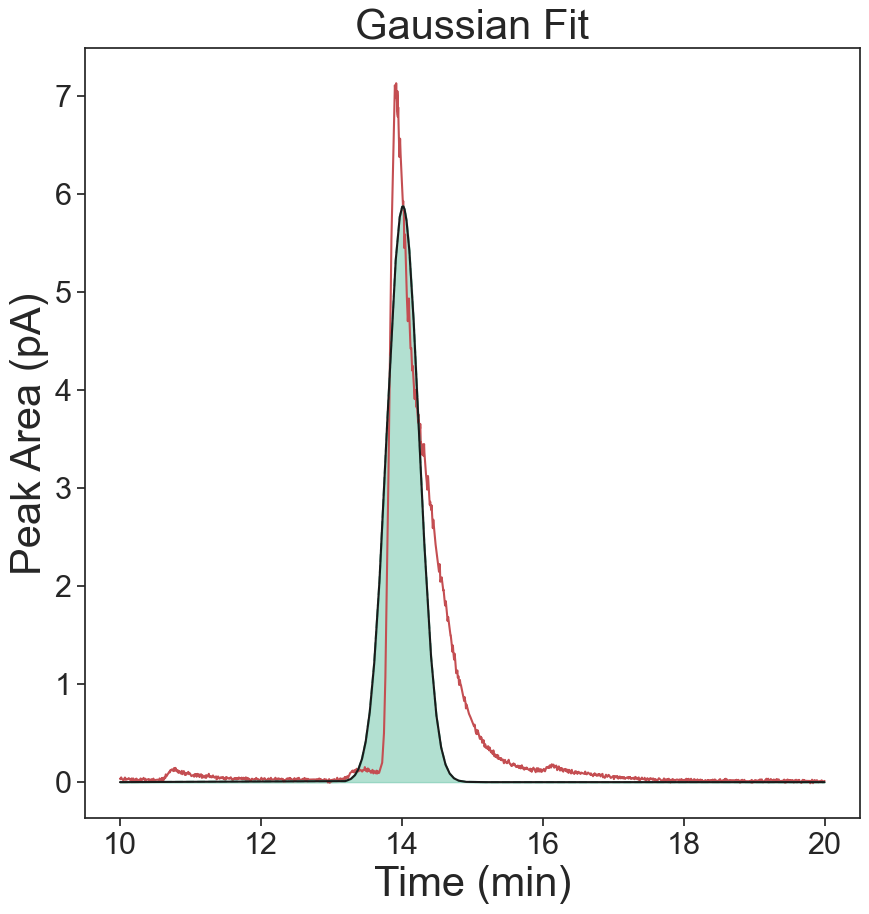

Exp Gaussian
[7.00491729]
0.07366038021306723


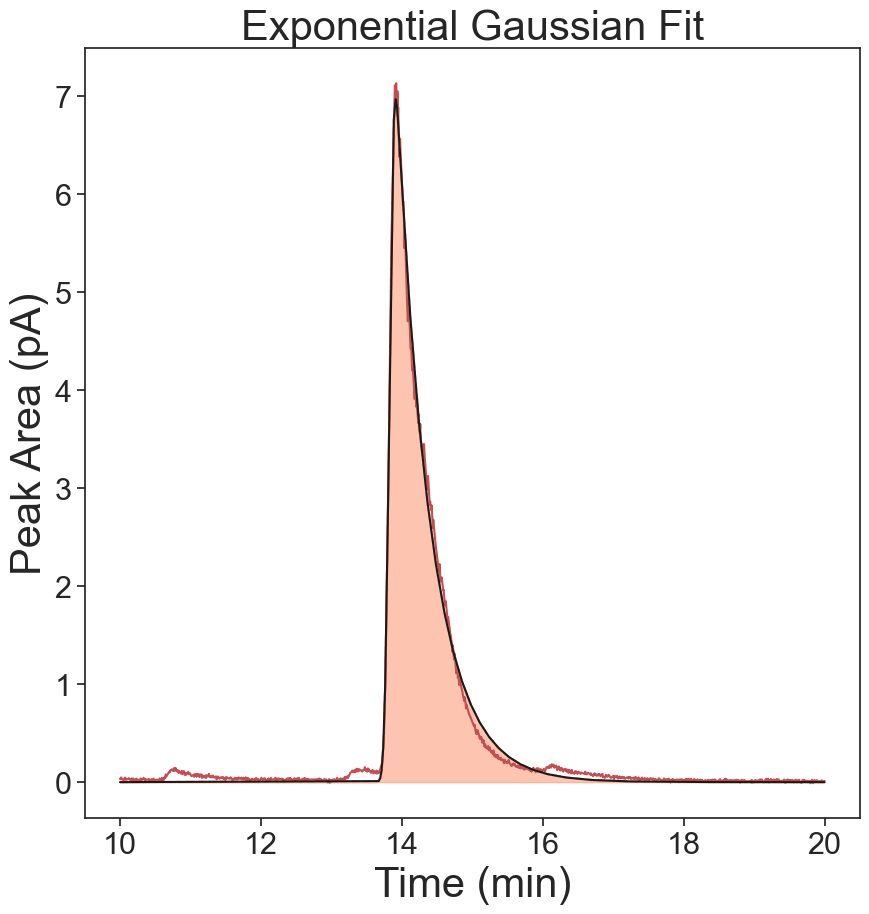

Skew Gaussian
[7.00491729]
0.31887879547383097


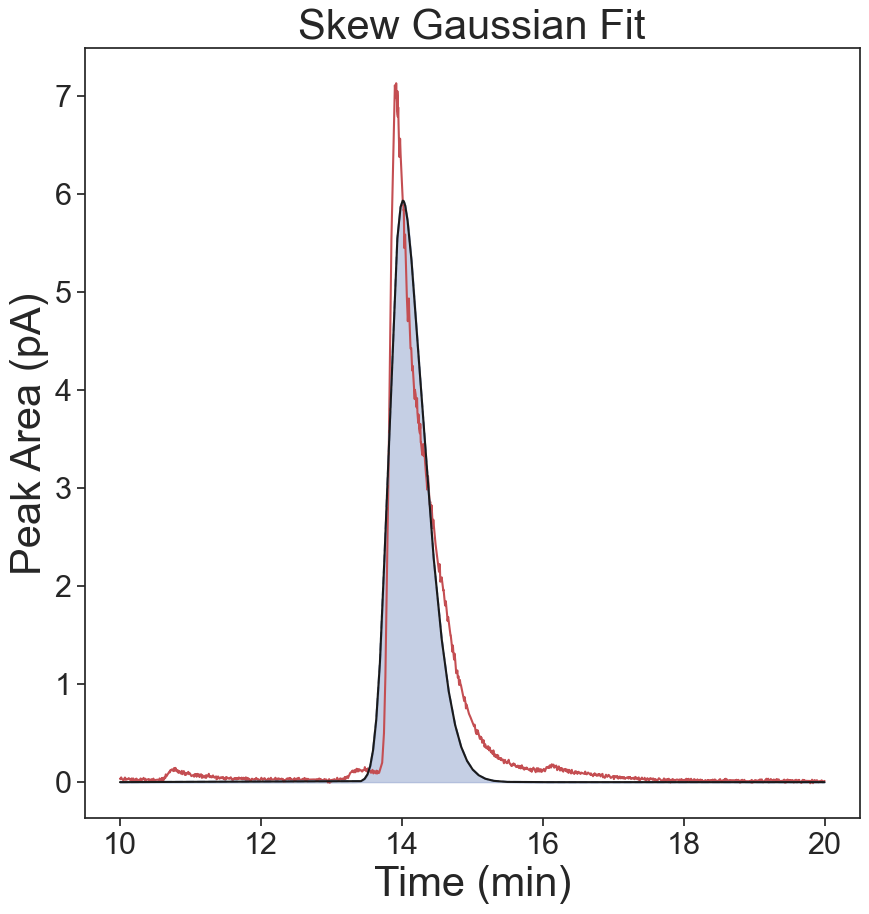

Voigt
[7.00491729]
0.43824089219803614


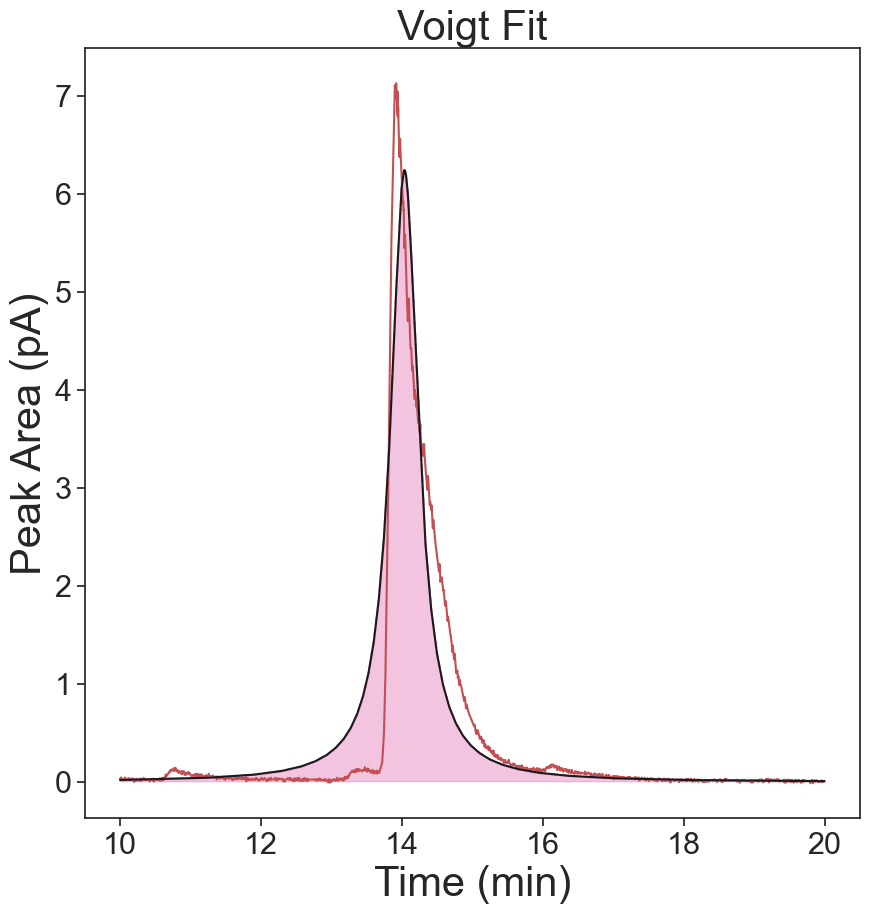

Gaussian
[7.78934504]
-8056.231978835132
-8056.231978835132
0.5063926997177567


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


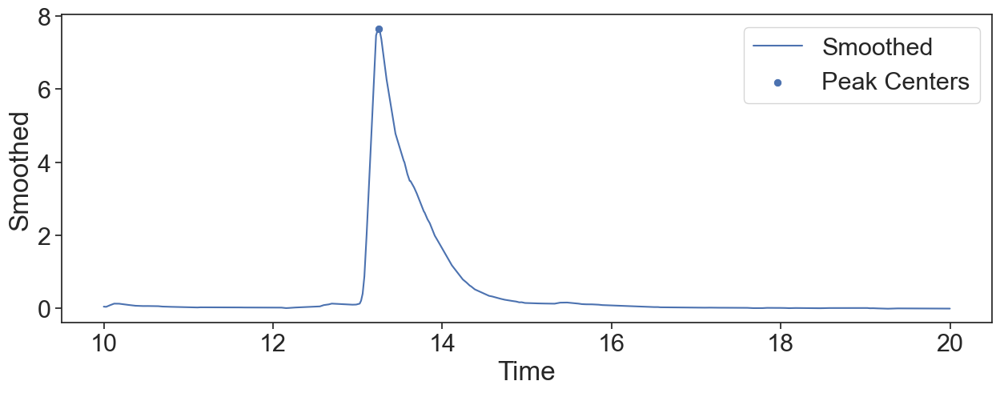

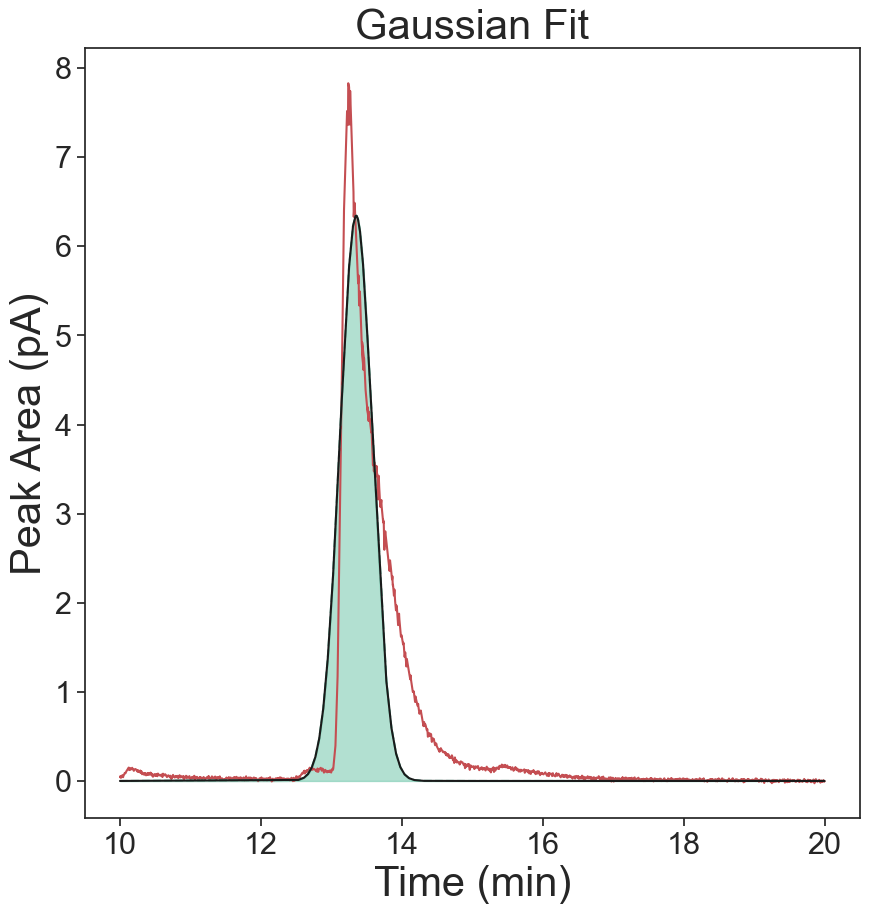

Exp Gaussian
[7.78934504]
0.07454972486405434


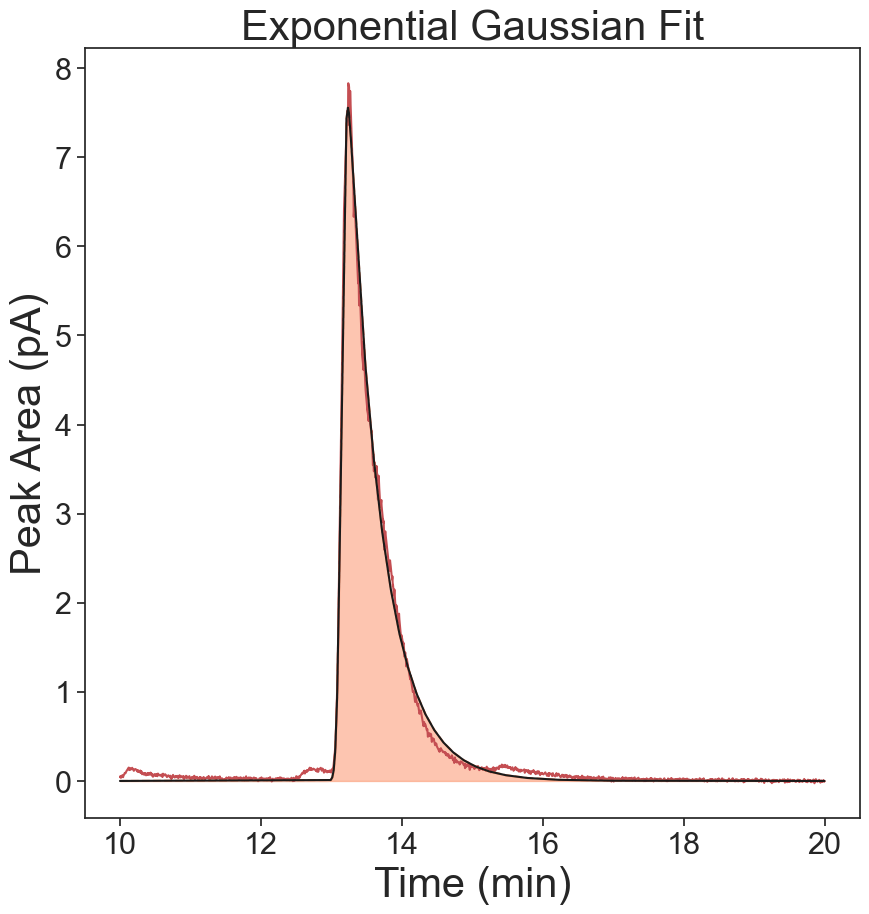

Skew Gaussian
[7.78934504]
0.34177490068157207


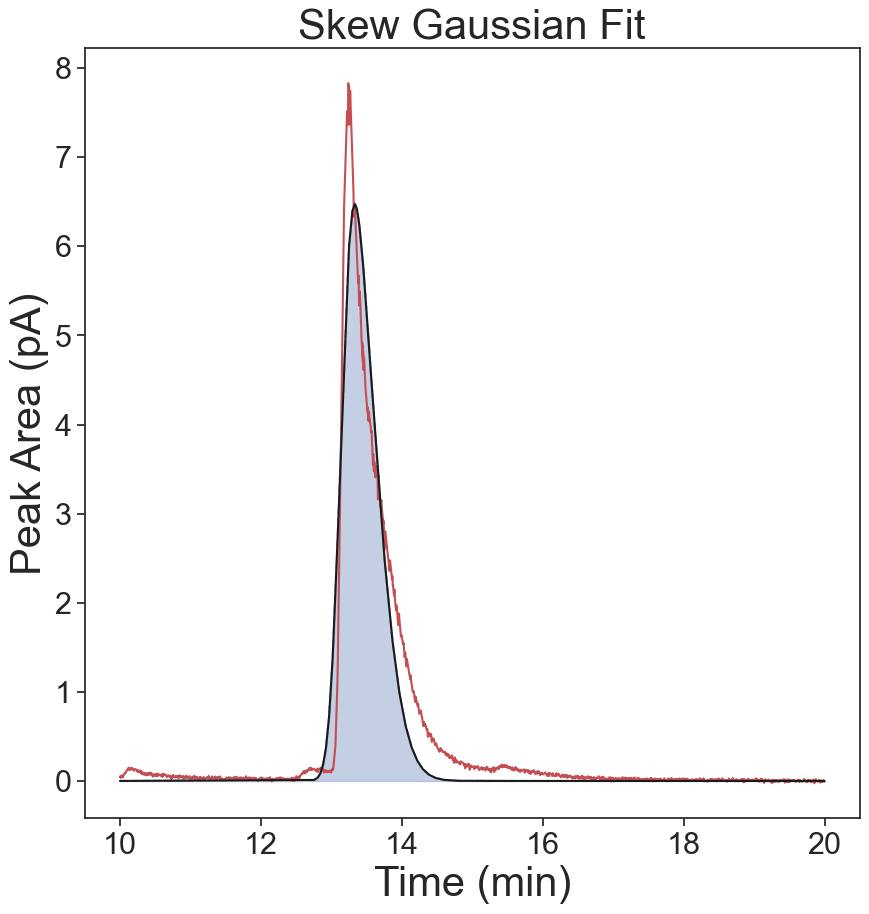

Voigt
[7.78934504]
0.4654937195530098


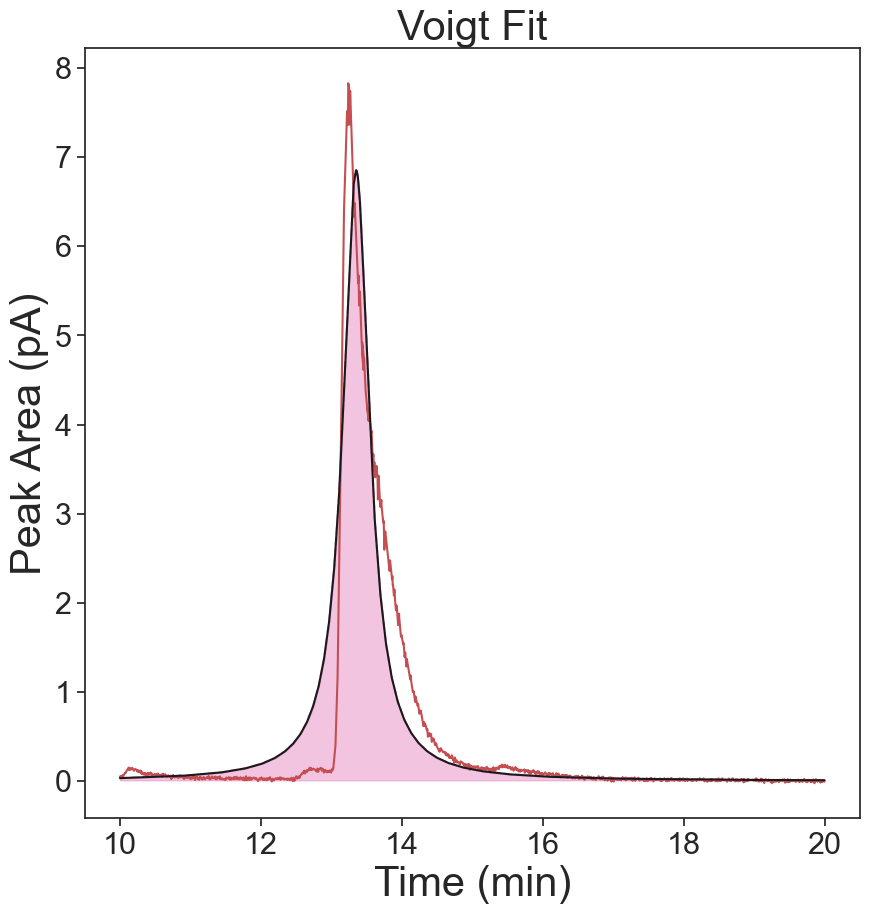

Gaussian
[7.38635298]
-7970.531483936233
-7970.531483936233
0.5100595663768814


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


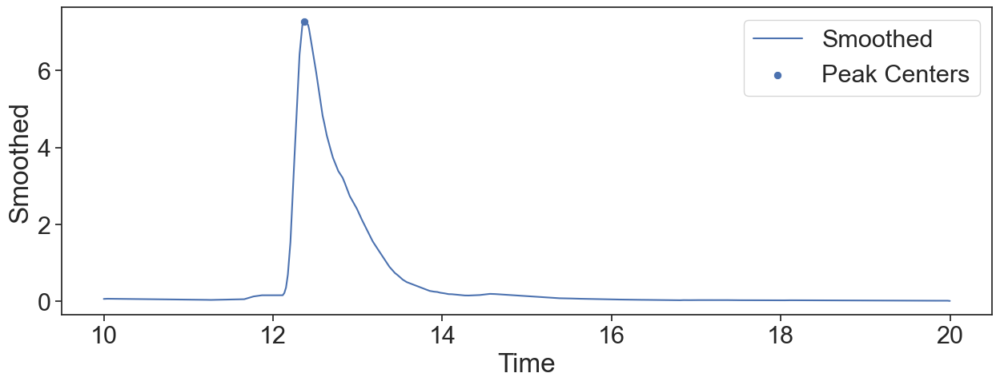

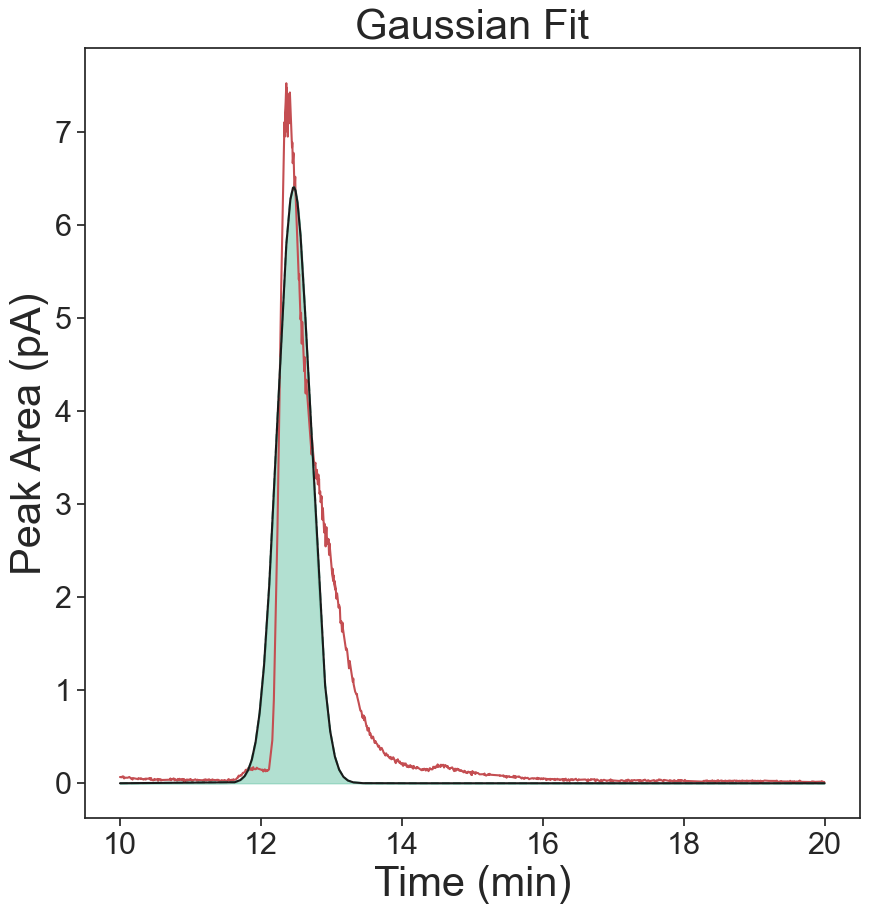

Exp Gaussian
[7.38635298]
0.07716366413312255


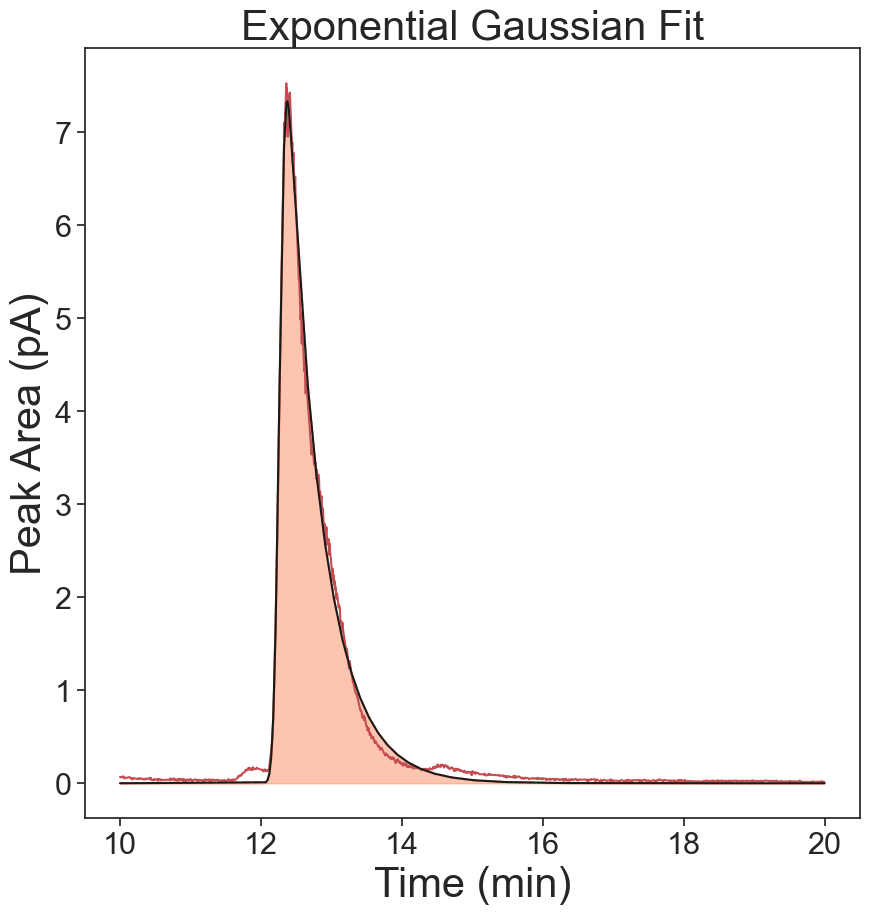

Skew Gaussian
[7.38635298]
0.3185114897052408


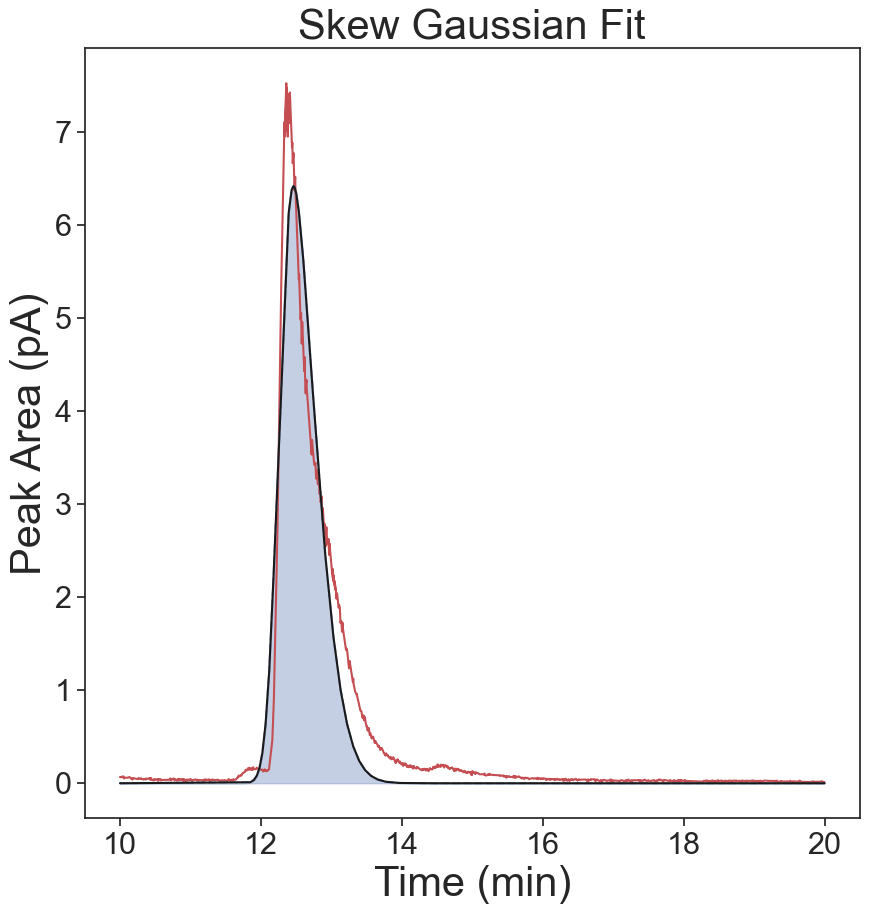

Voigt
[7.38635298]
0.4408375136893757


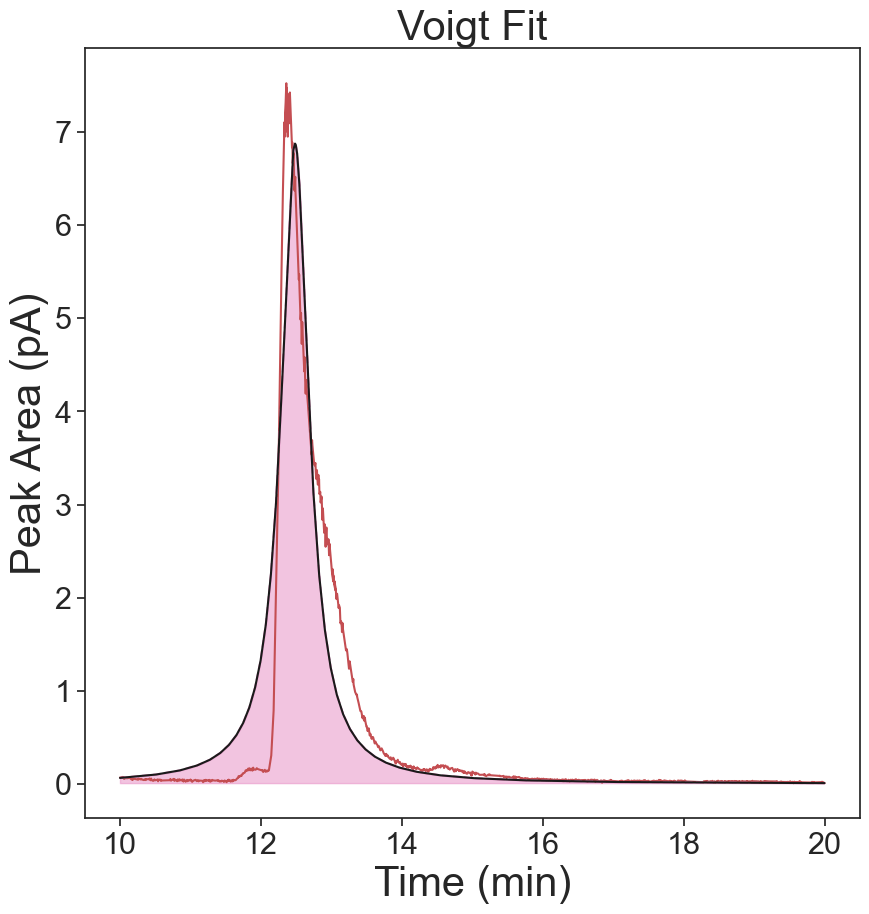

Gaussian
[12.78727903]
-2136.9108552623193
-2136.9108552623193
0.8335183392872978


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


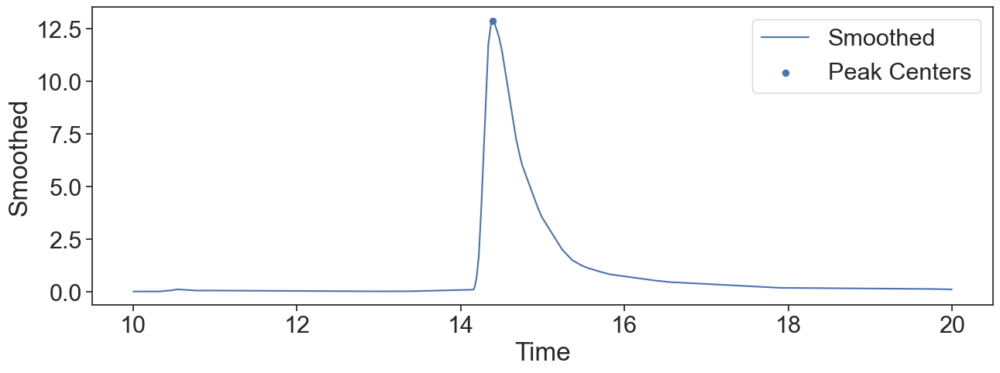

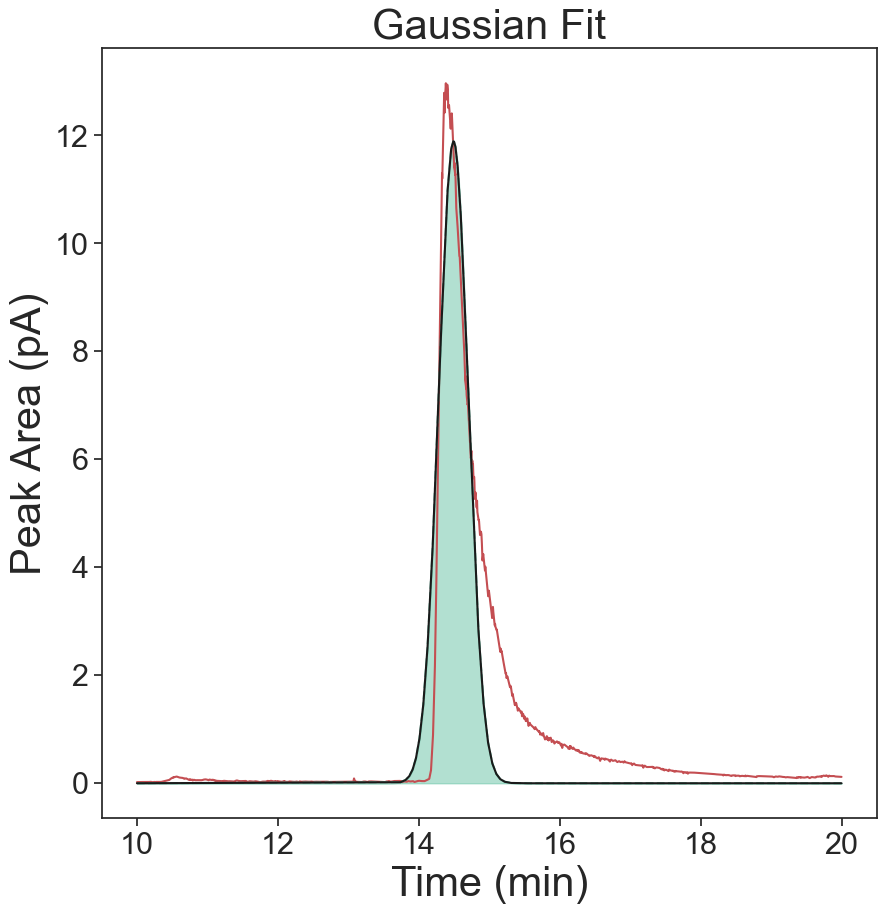

Exp Gaussian
[12.78727903]
0.17950099467946642


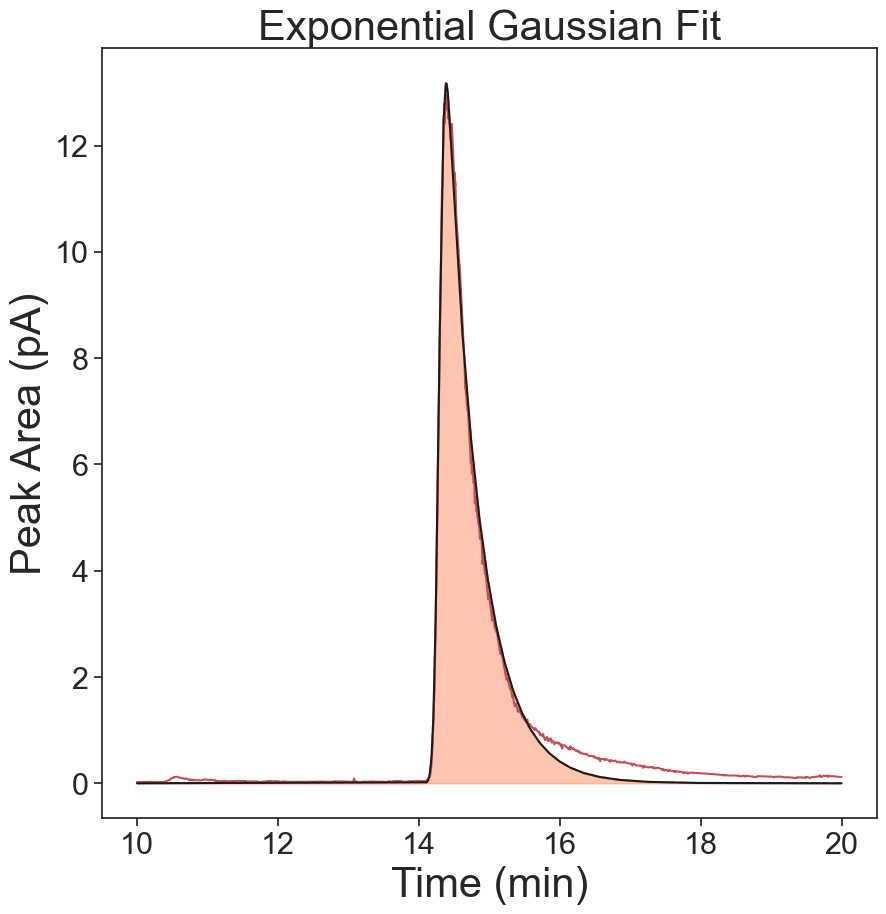

Skew Gaussian
[12.78727903]
0.5684962691107309


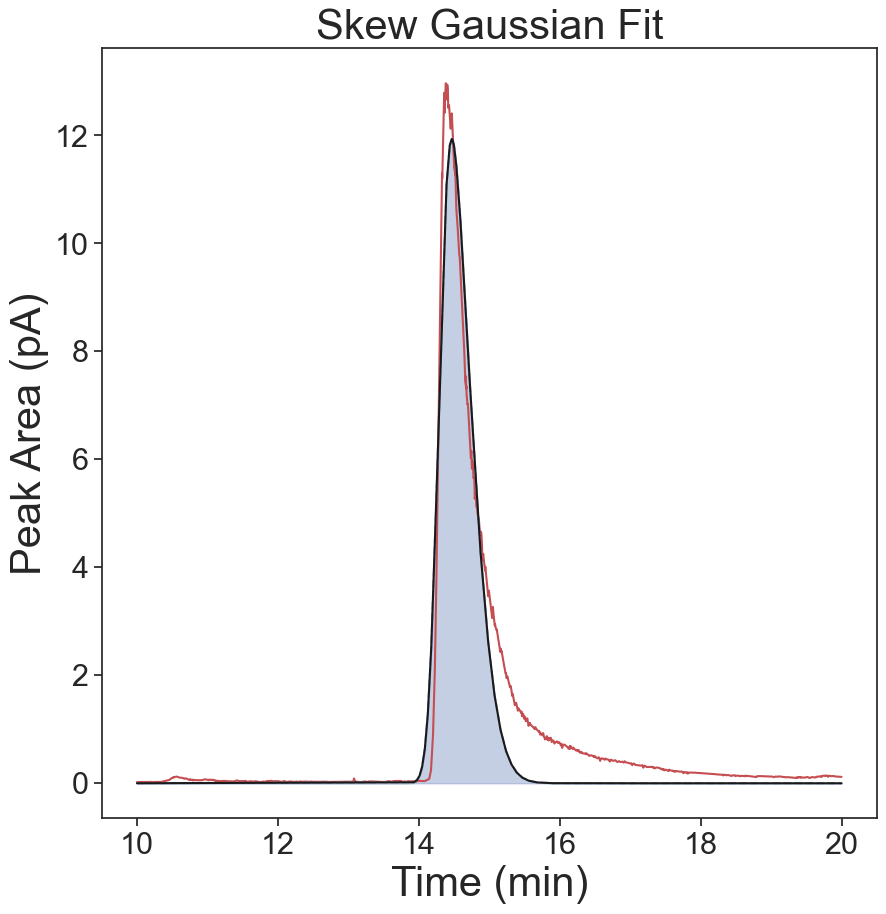

Voigt
[12.78727903]
0.7574379412753042


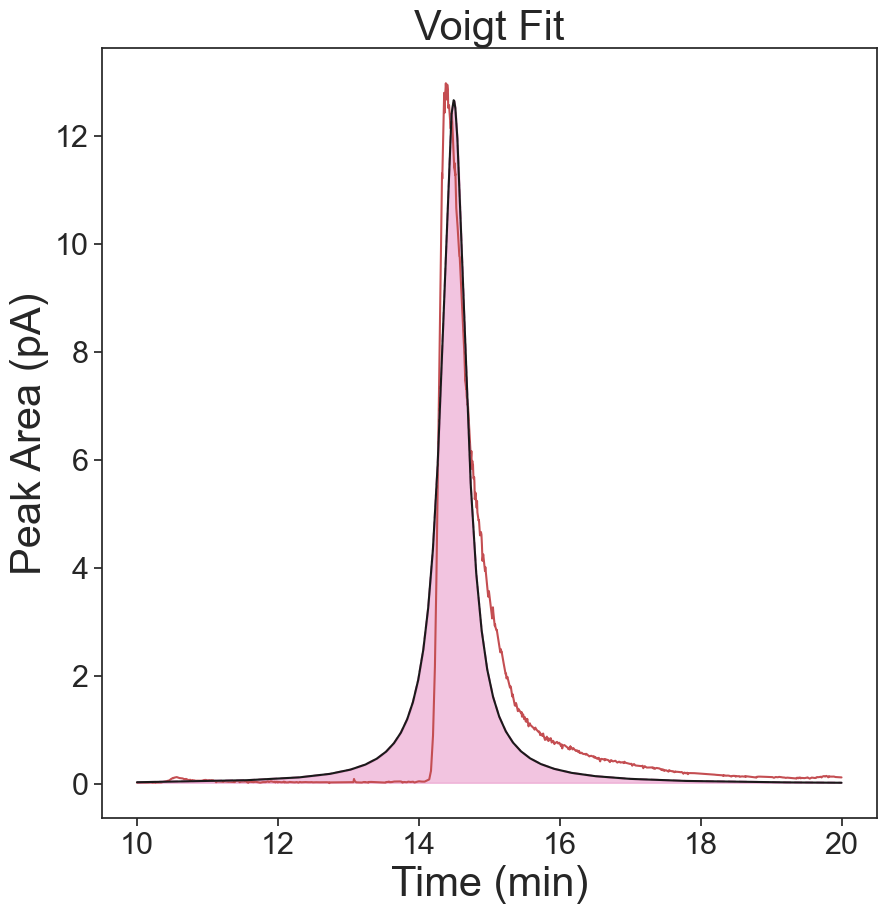

Gaussian
[5.92329245]
-12260.940688388413
-12260.940688388413
0.35542745034789097


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


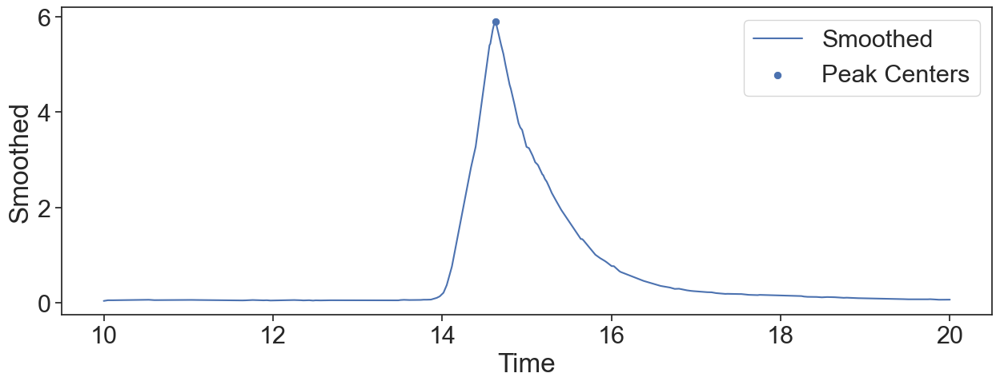

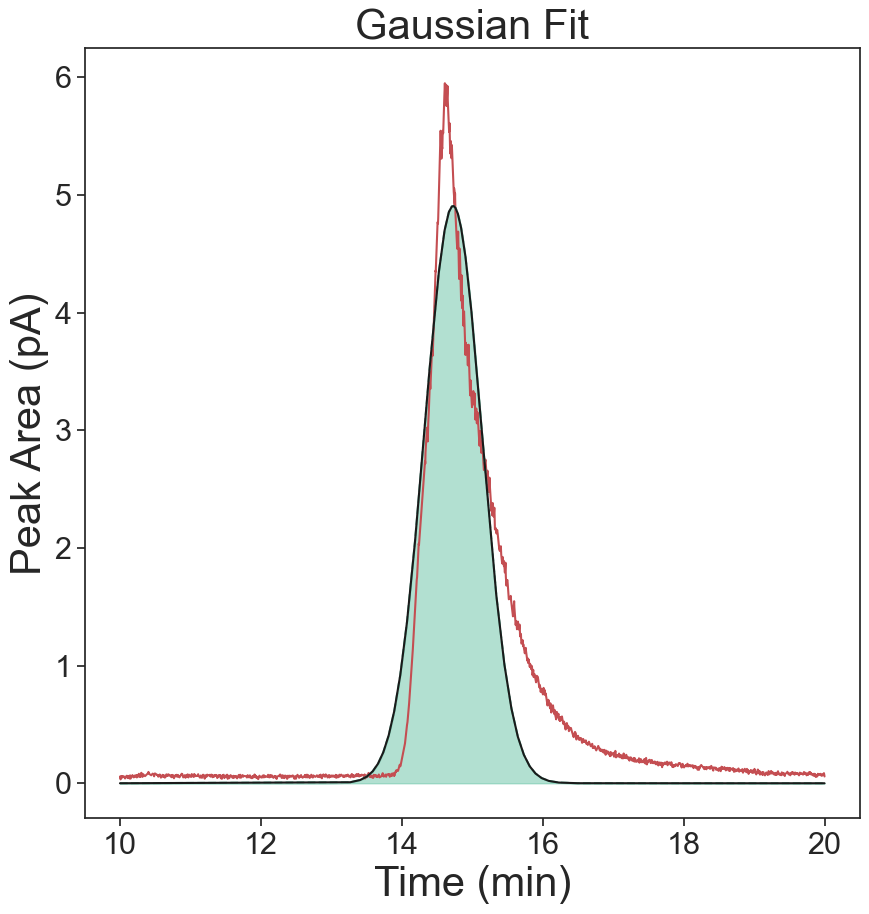

Exp Gaussian
[5.92329245]
0.11456656995543371


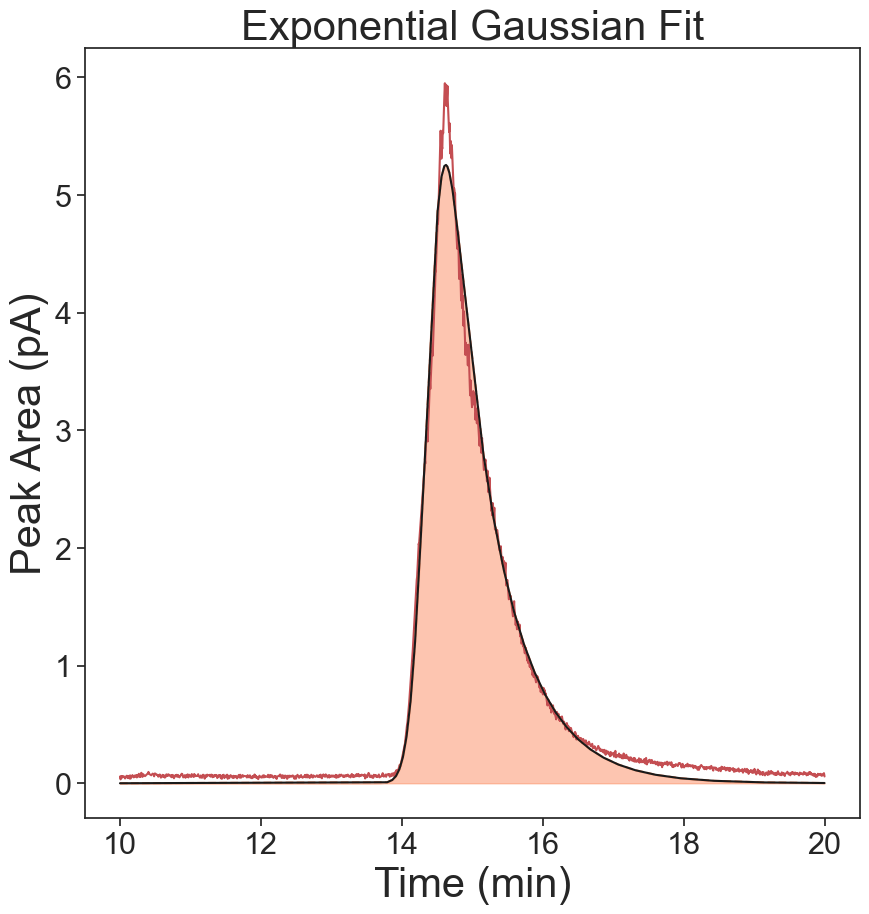

Skew Gaussian
[5.92329245]
0.21196900647425326


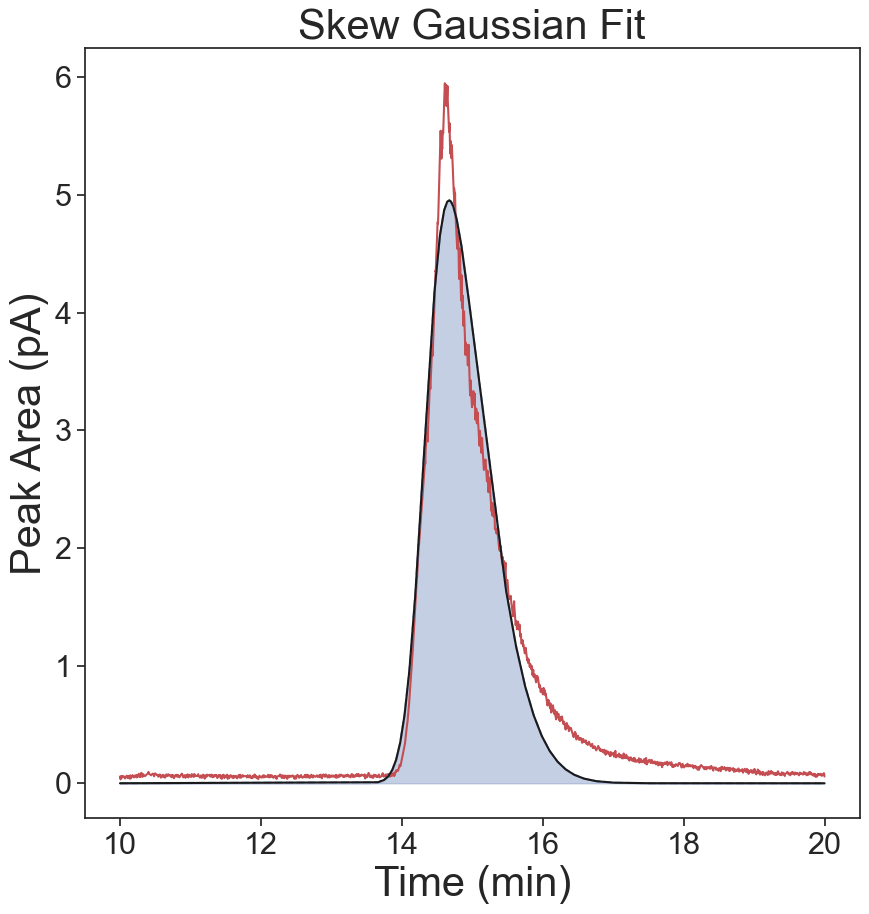

Voigt
[5.92329245]
0.3077044078937307


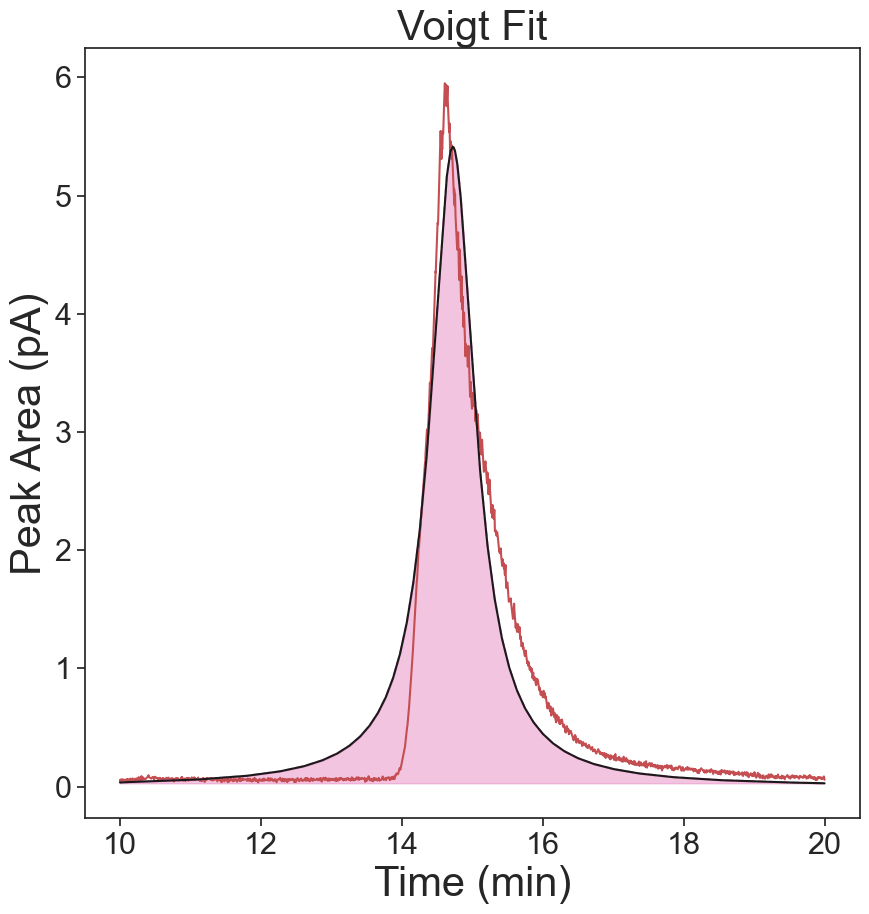

Gaussian
[10.22603755]
-2079.3749206728644
-2079.3749206728644
0.8375406532945535


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


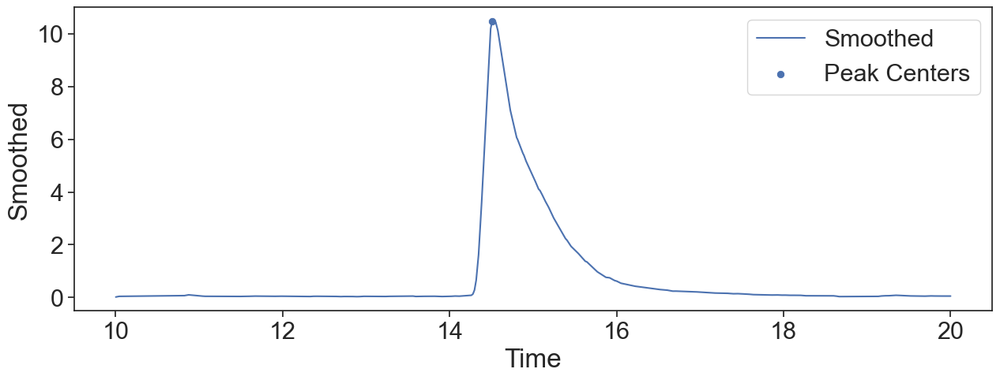

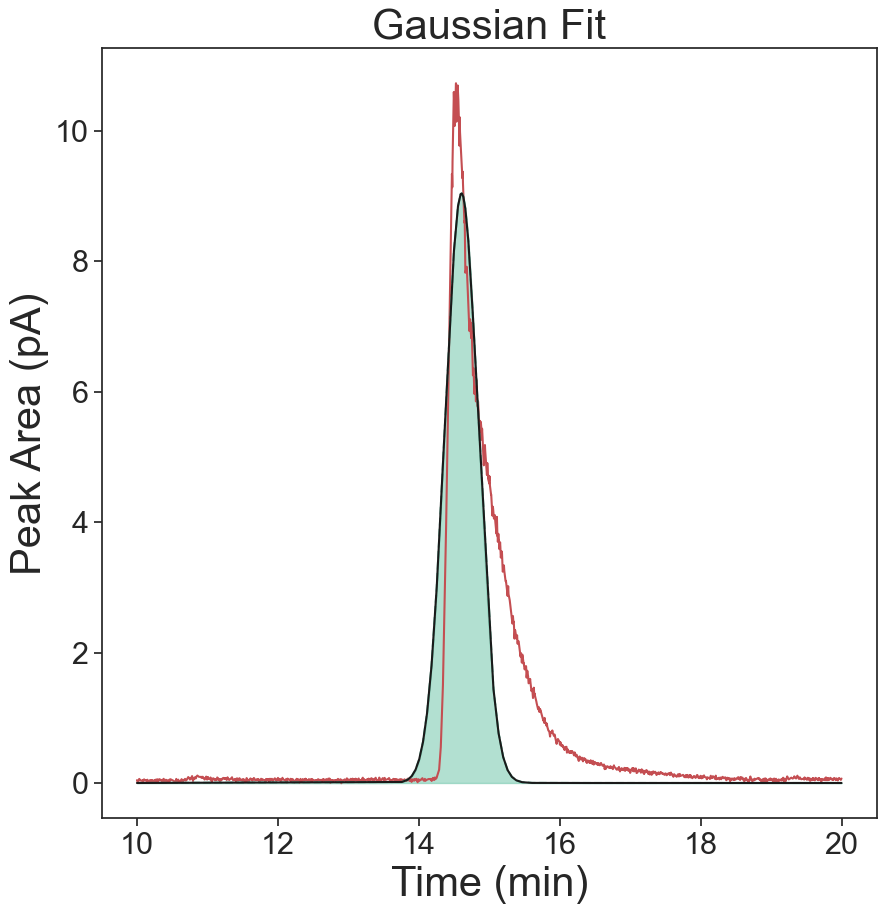

Exp Gaussian
[10.22603755]
0.09941344268575339


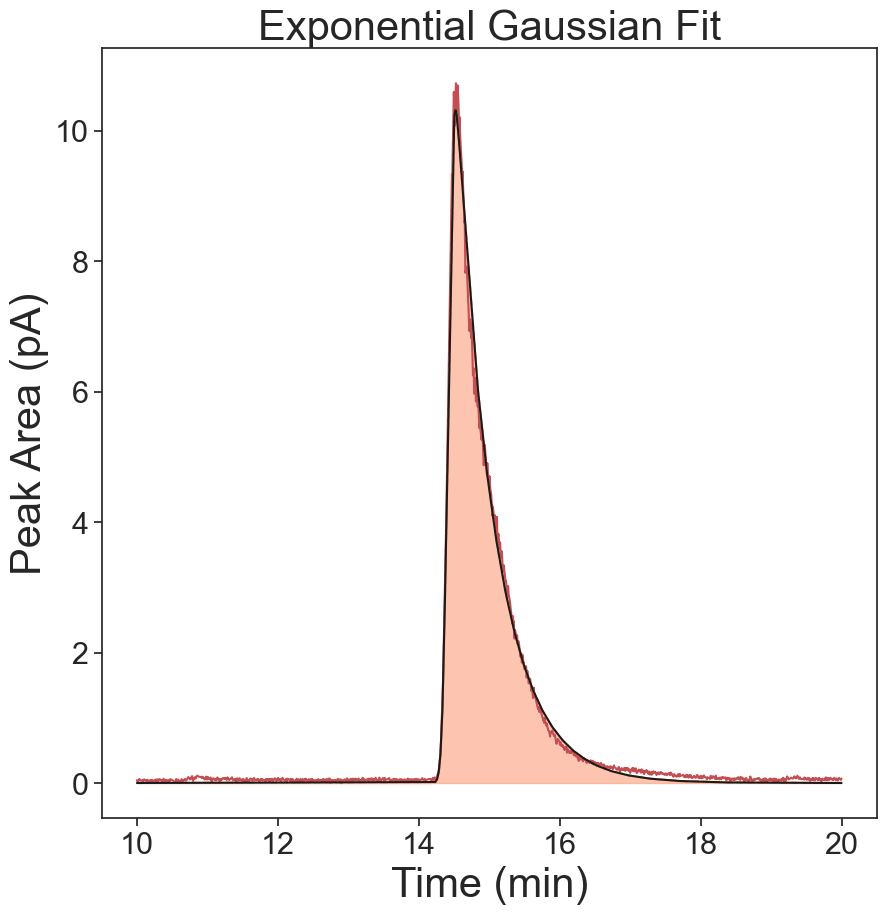

Skew Gaussian
[10.22603755]
0.5130558036528412


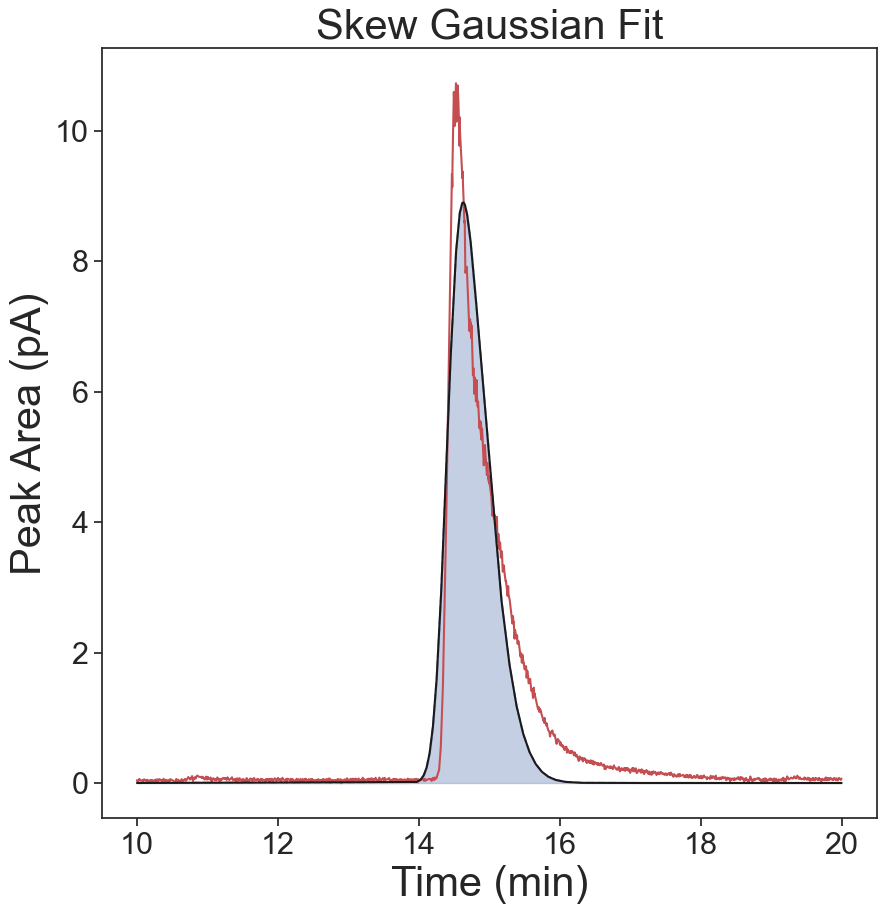

Voigt
[10.22603755]
0.6952532728713077


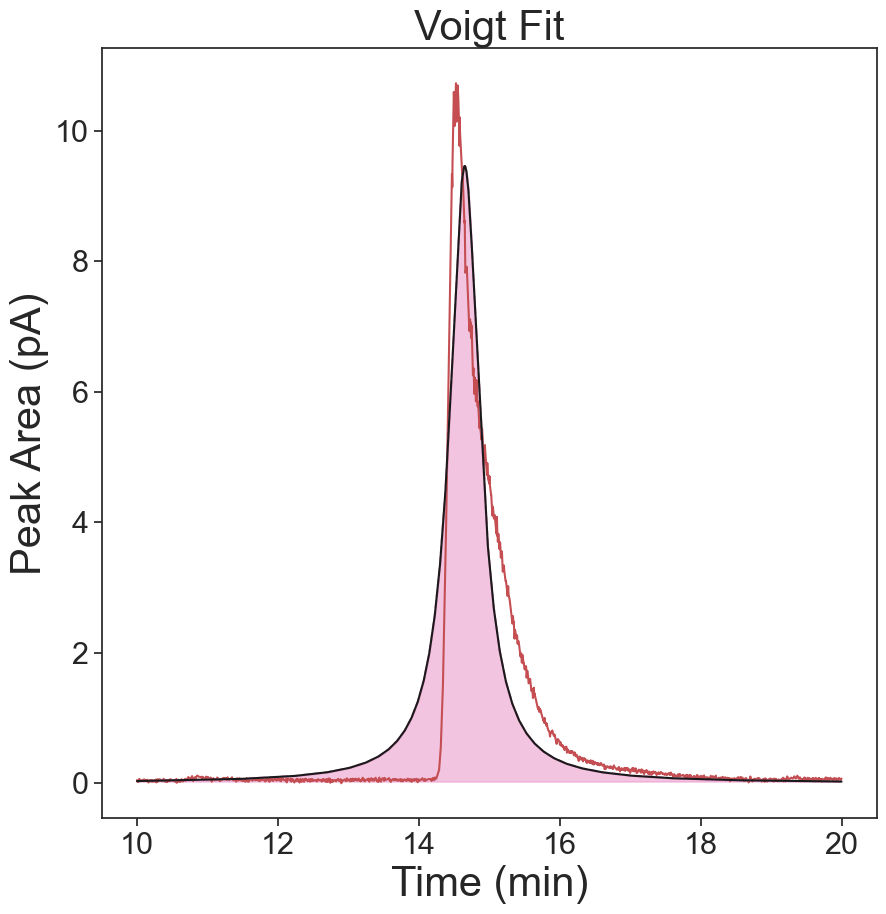

Gaussian
[11.60633906]
-1508.3775226378286
-1508.3775226378286
0.8788124076356384


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


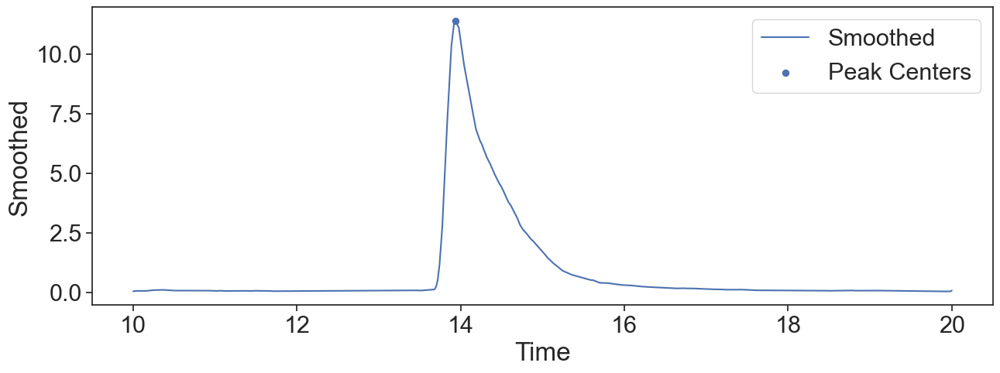

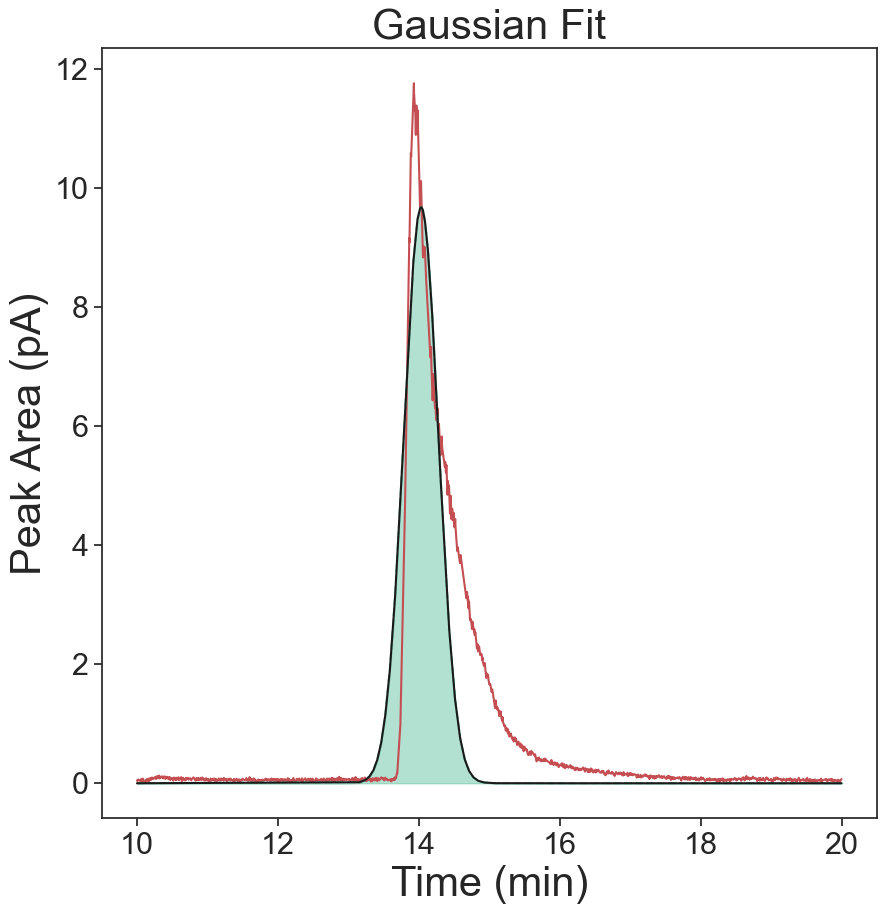

Exp Gaussian
[11.60633906]
0.1063688510766019


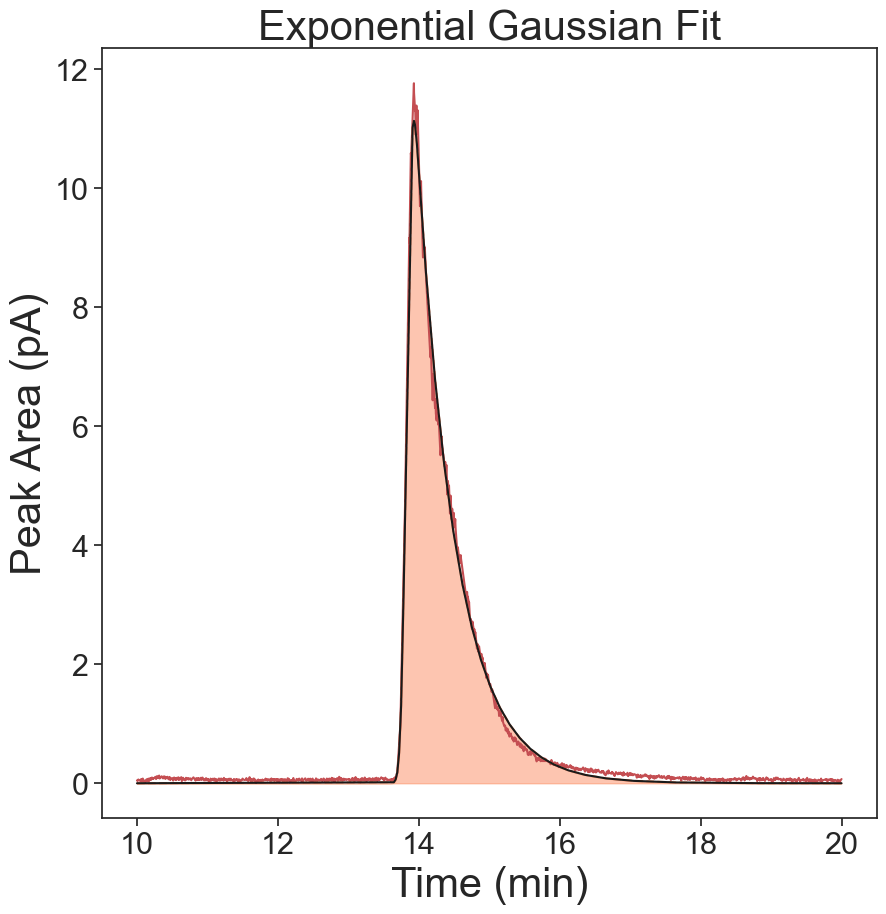

Skew Gaussian
[11.60633906]
0.5586653099871259


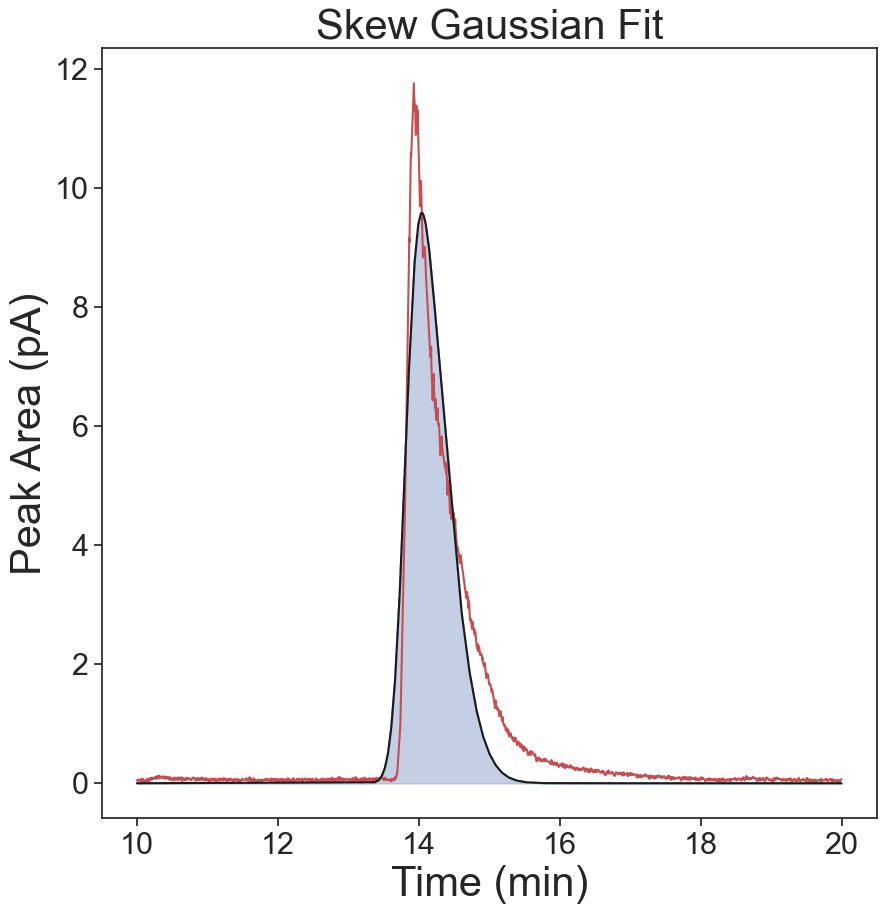

Voigt
[11.60633906]
0.7547770098180946


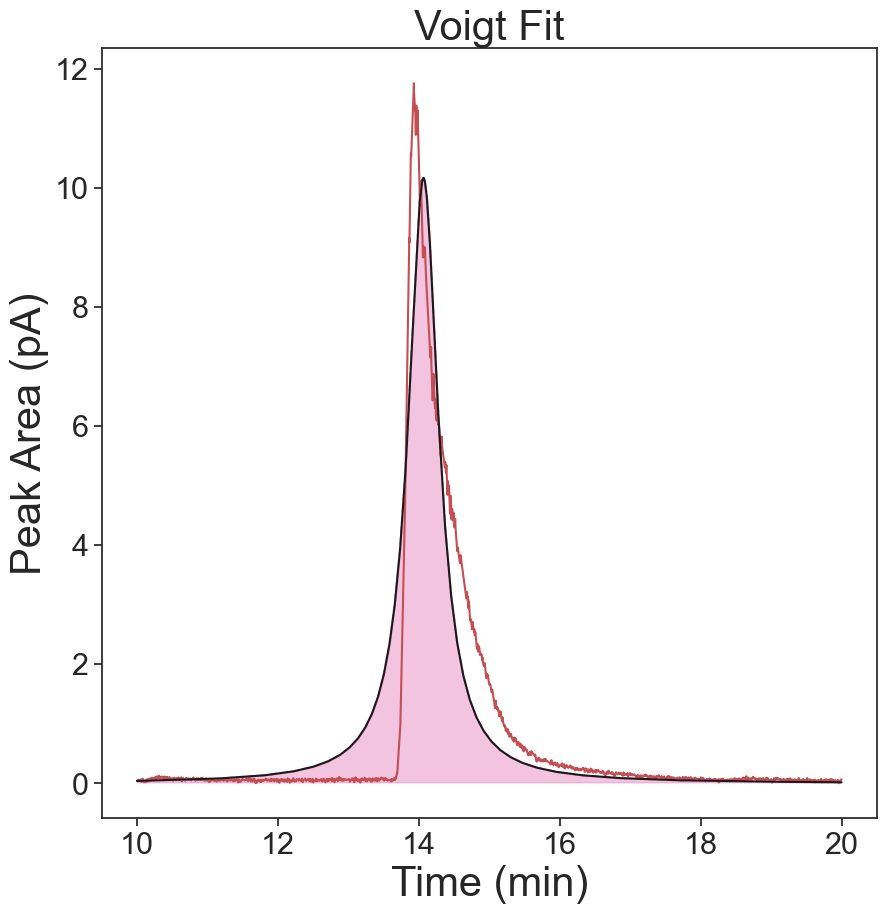

Gaussian
[12.24851241]
-832.1323439118554
-832.1323439118554
0.9302971383334827


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


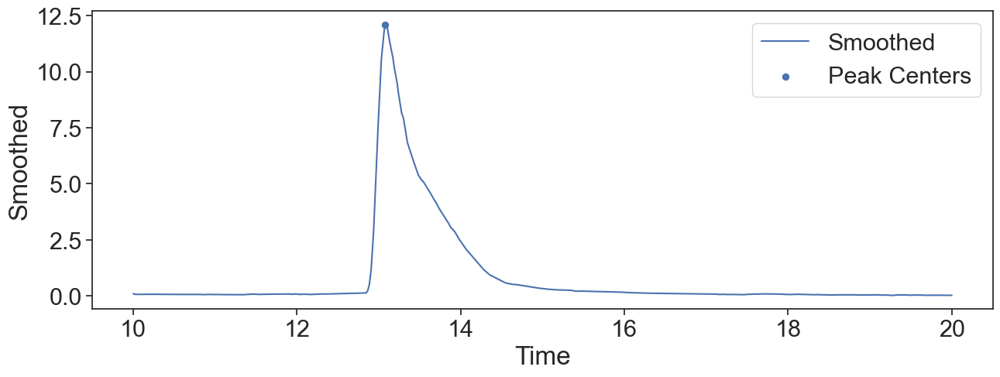

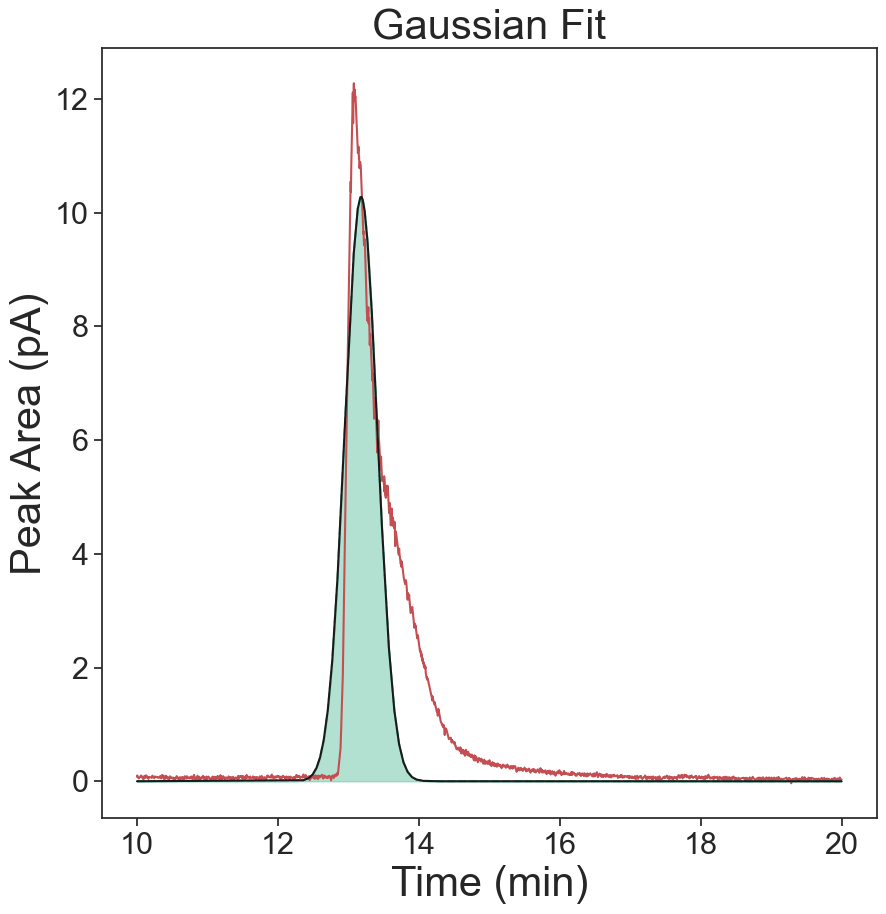

Exp Gaussian
[12.24851241]
0.12767437094976325


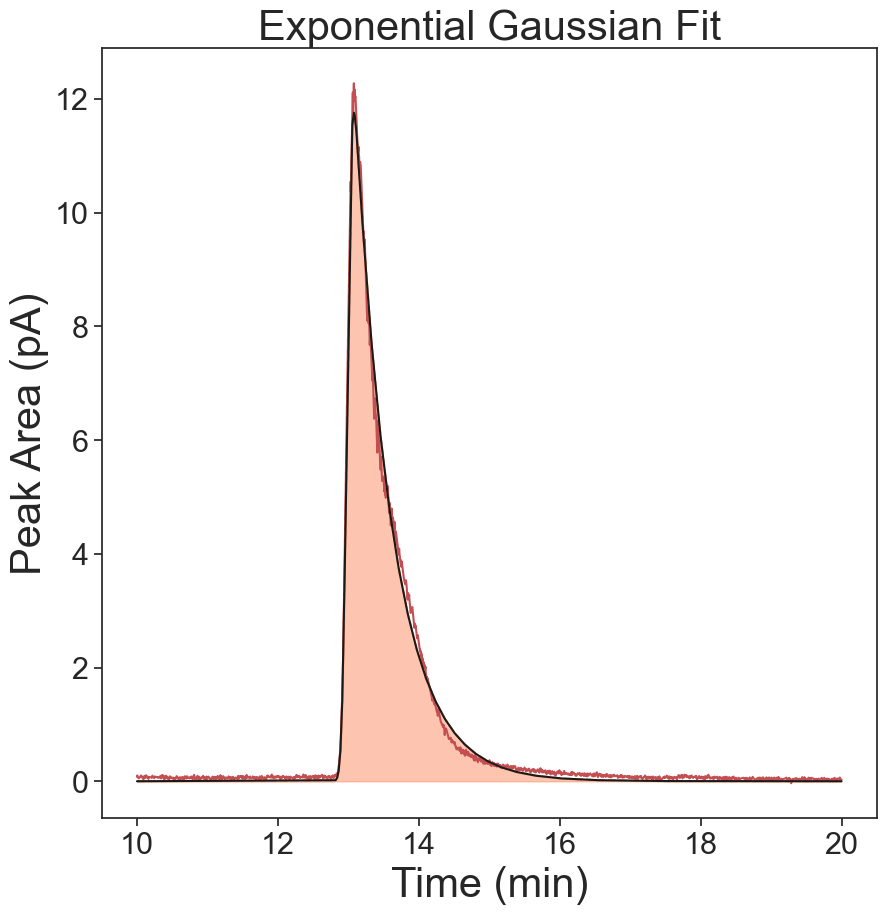

Skew Gaussian
[12.24851241]
0.609951702944855


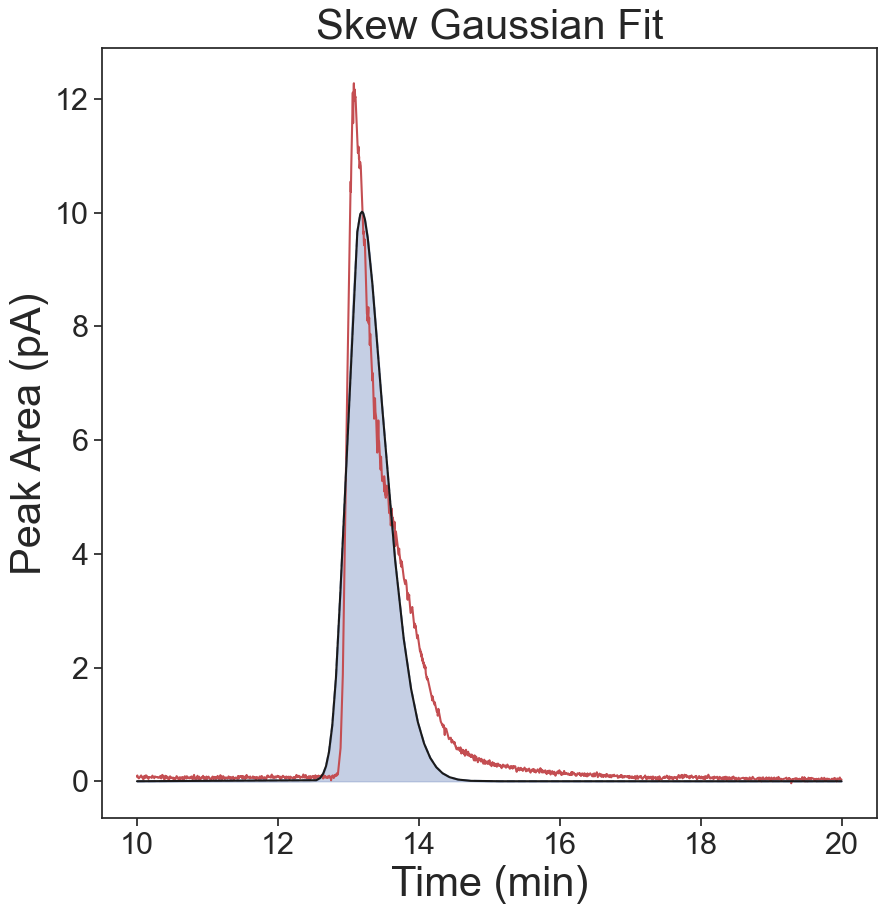

Voigt
[12.24851241]
0.7972505898020347


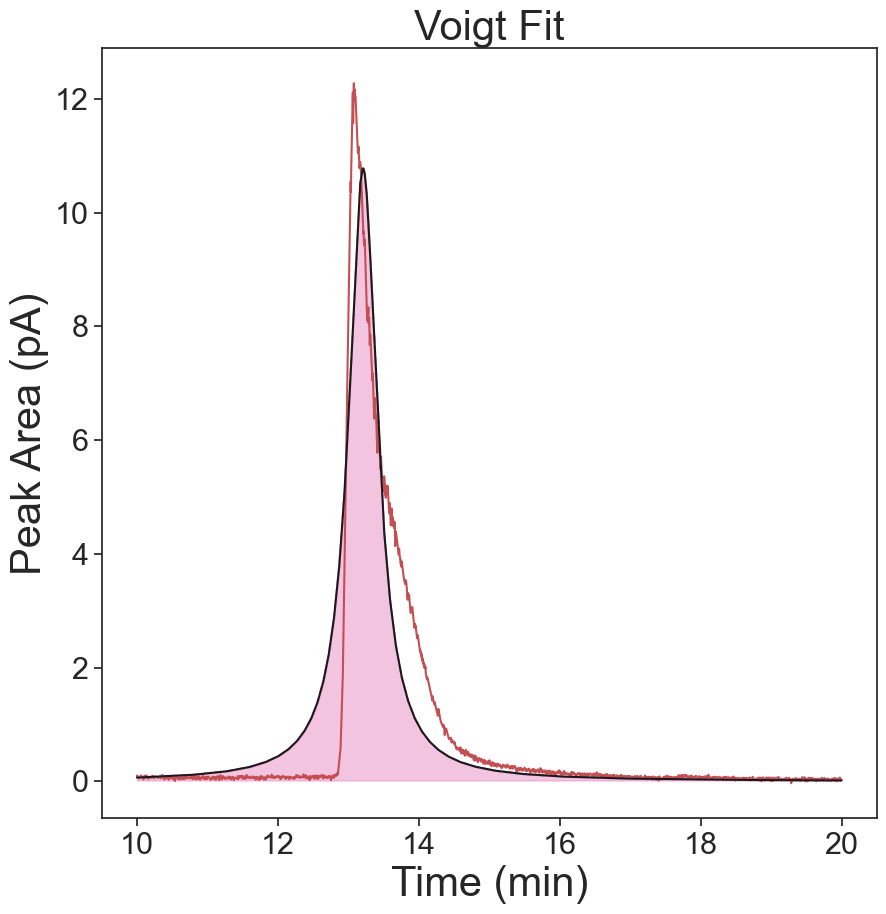

Gaussian
[7.19581515]
-9258.089889607045
-9258.089889607045
0.4576610888963091


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


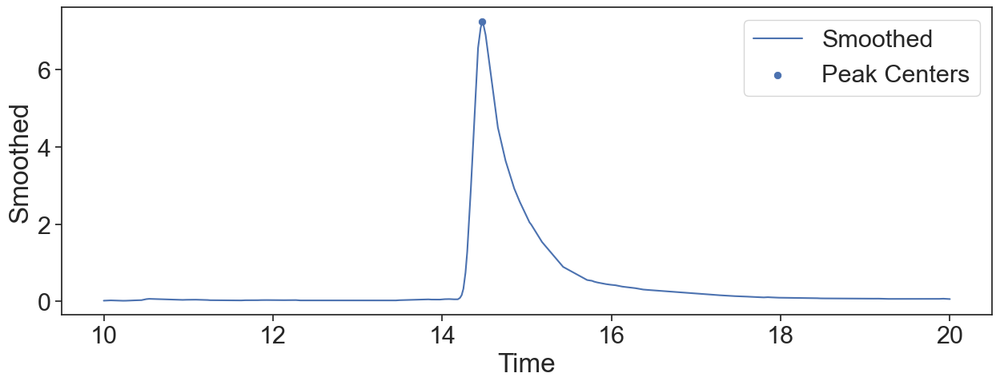

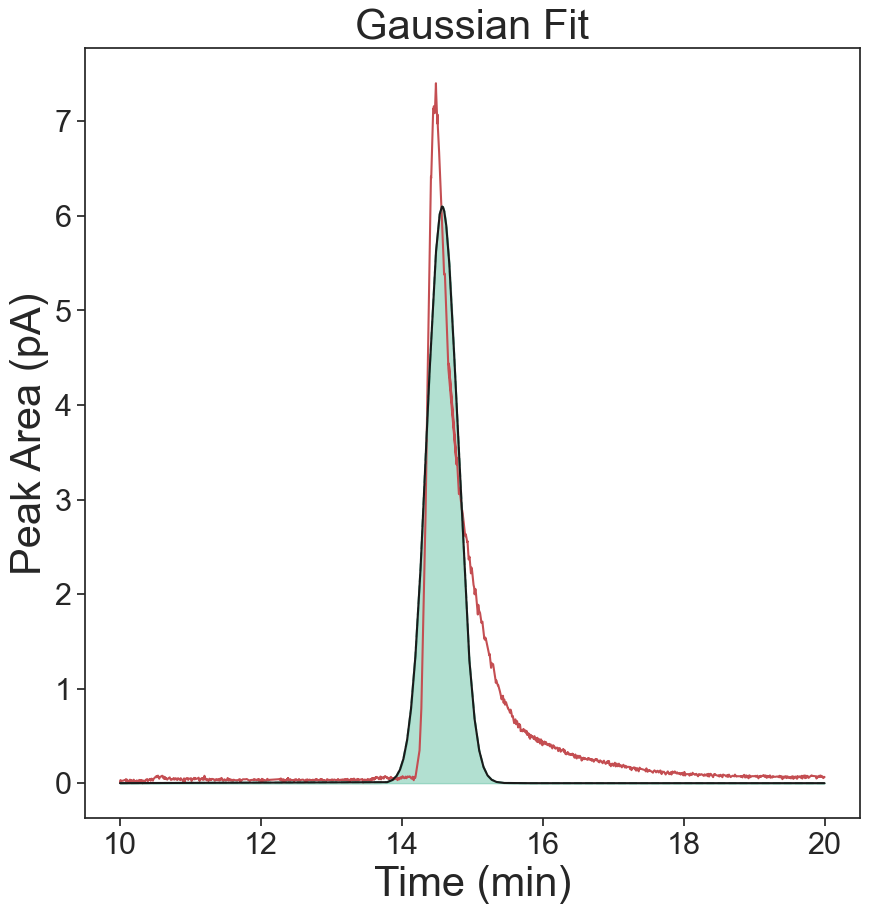

Exp Gaussian
[7.19581515]
0.10734707878213427


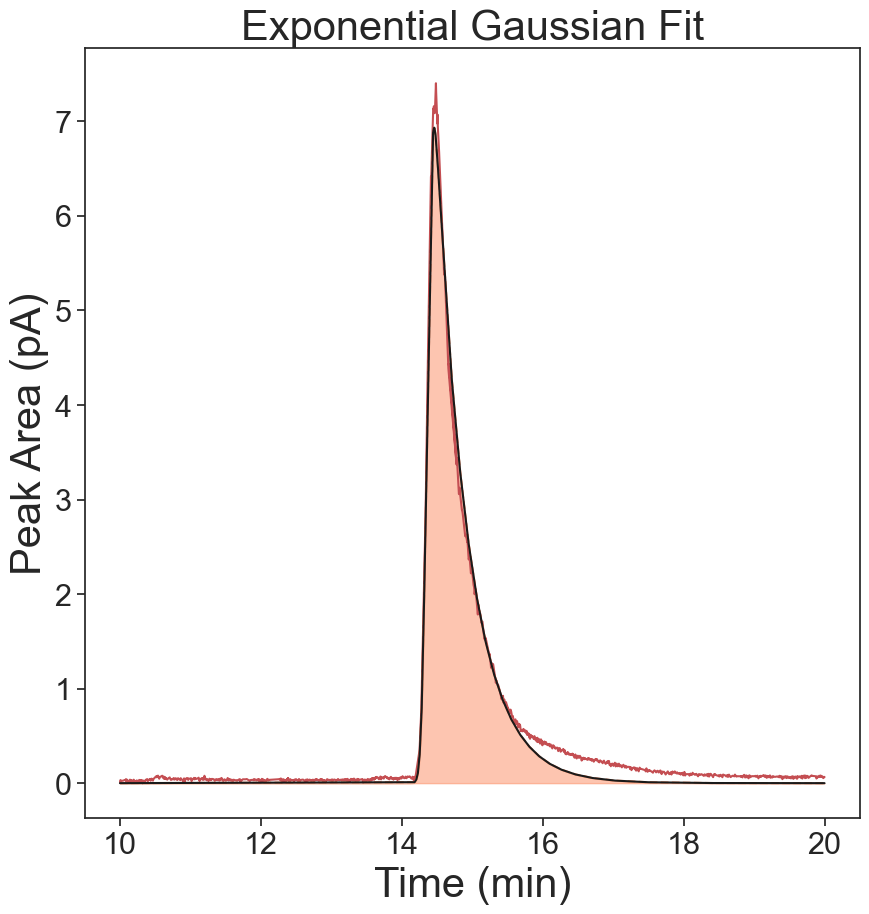

Skew Gaussian
[7.19581515]
0.32879575045204584


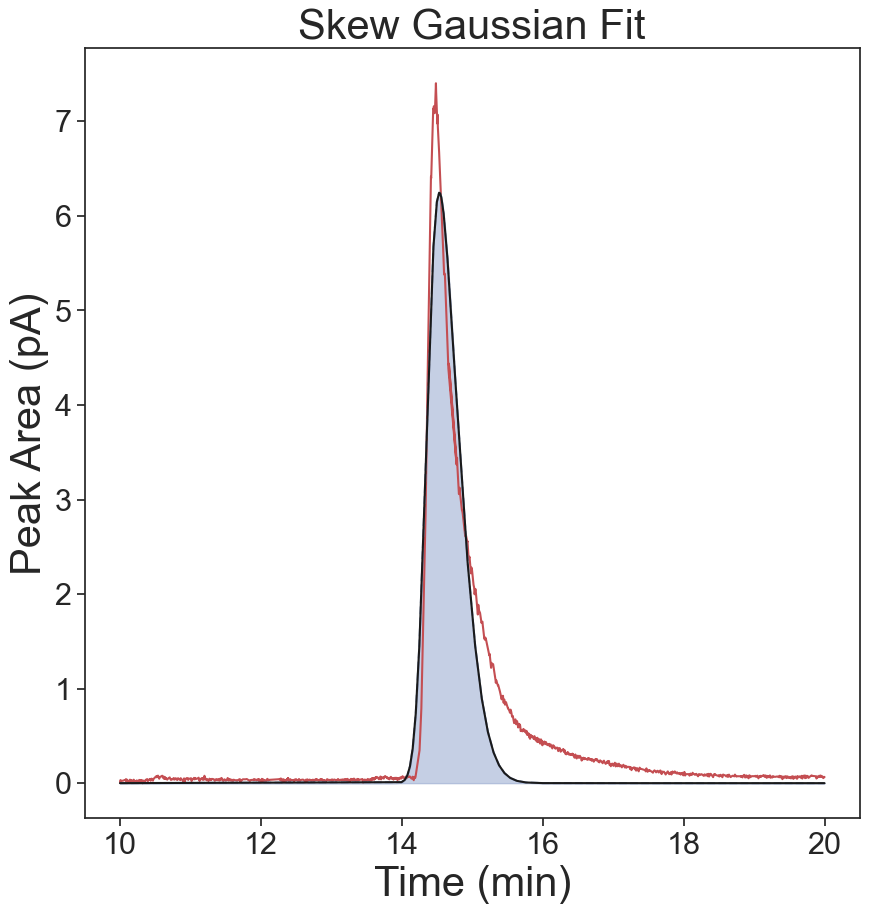

Voigt
[7.19581515]
0.4101095563509571


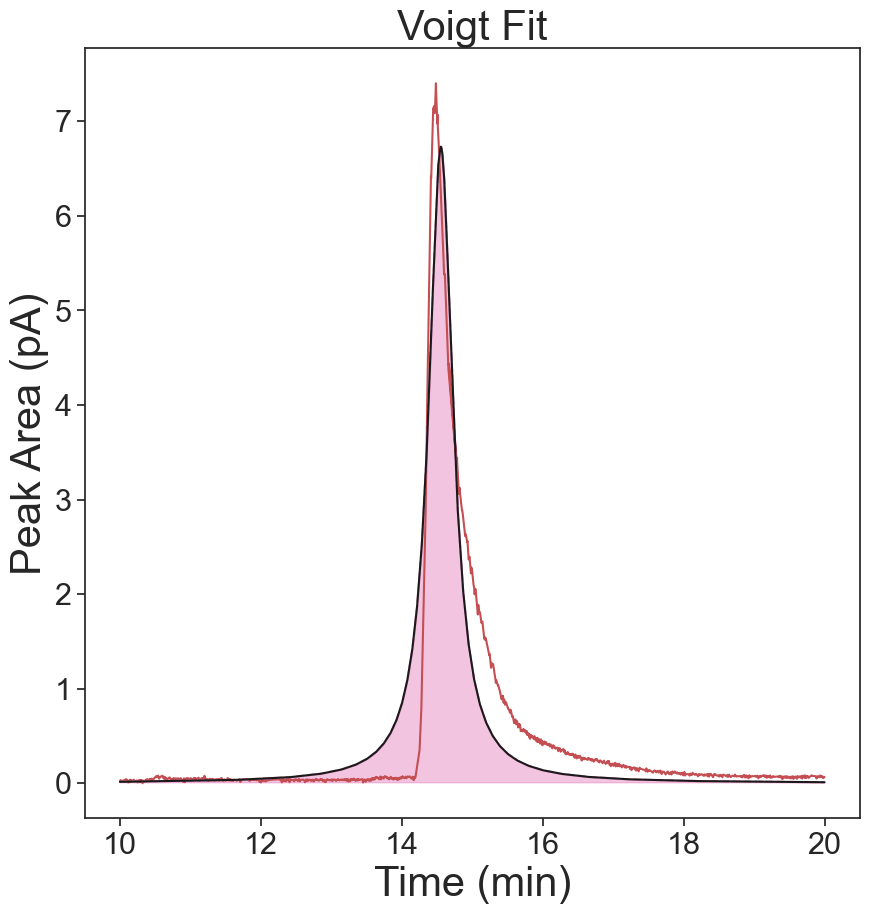

Gaussian
[7.40191289]
-8455.463202272165
-8455.463202272165
0.4896552022003379


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


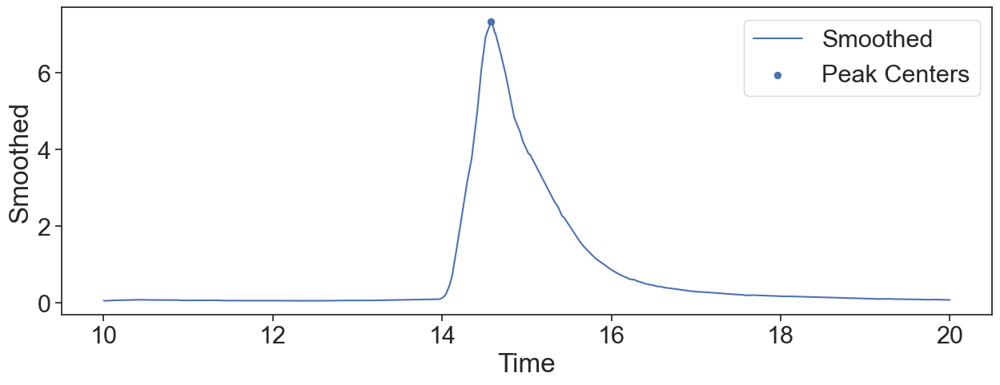

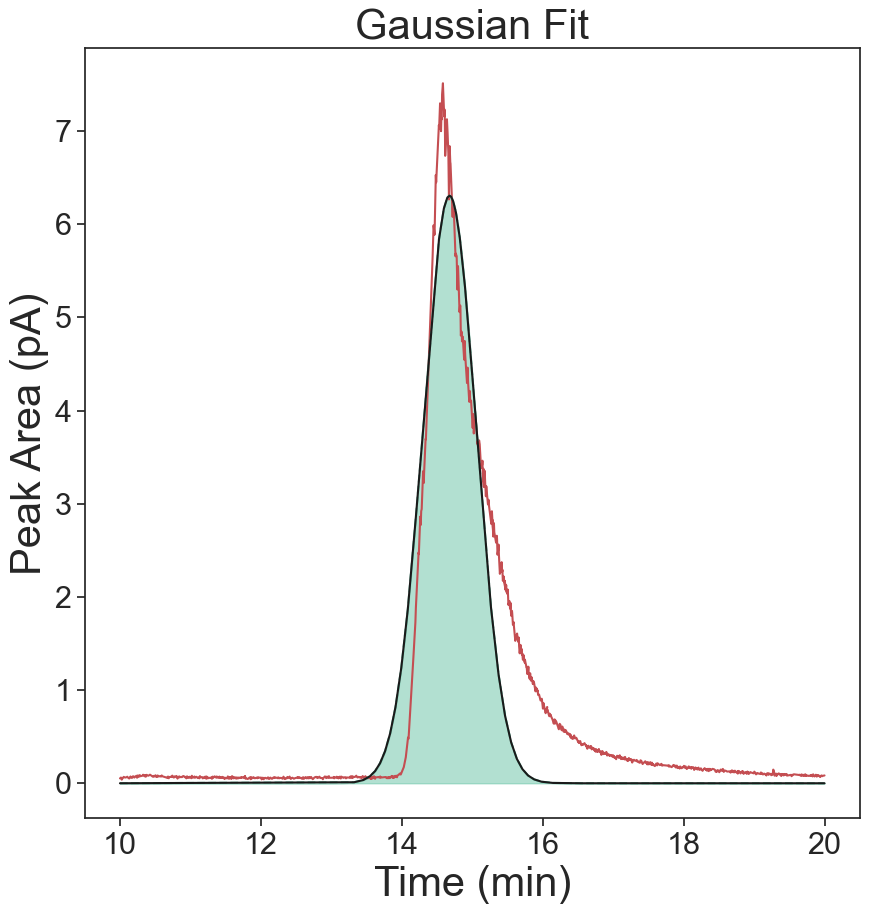

Exp Gaussian
[7.40191289]
0.1201314747739402


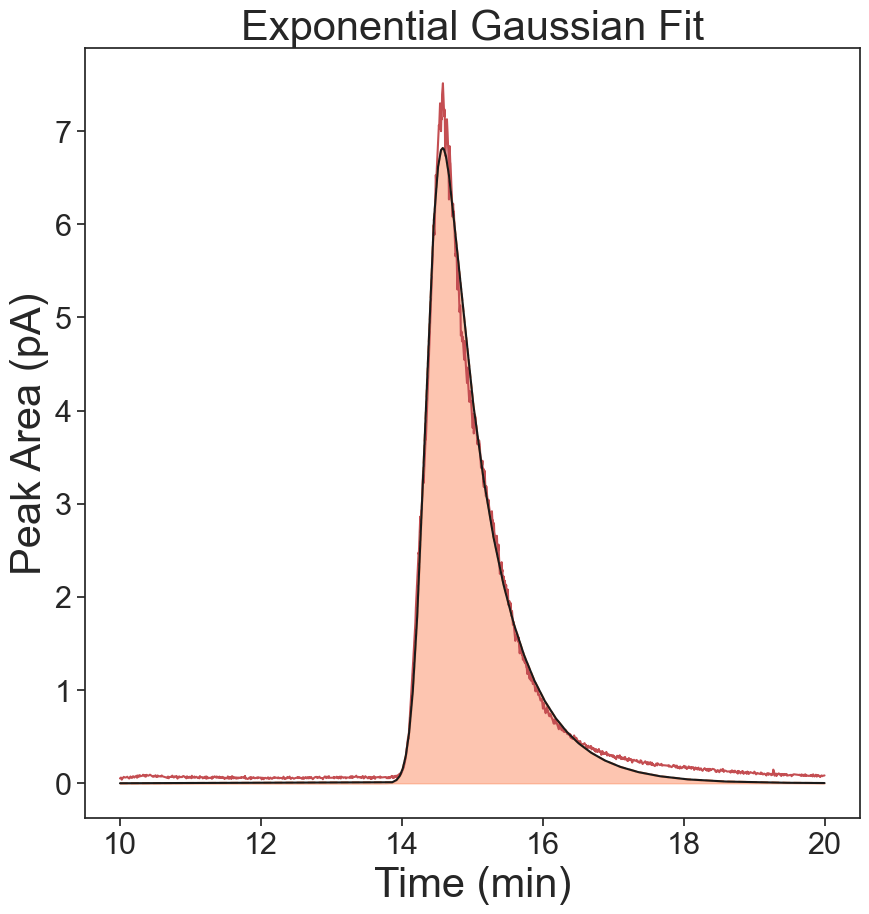

Skew Gaussian
[7.40191289]
0.2797602818094324


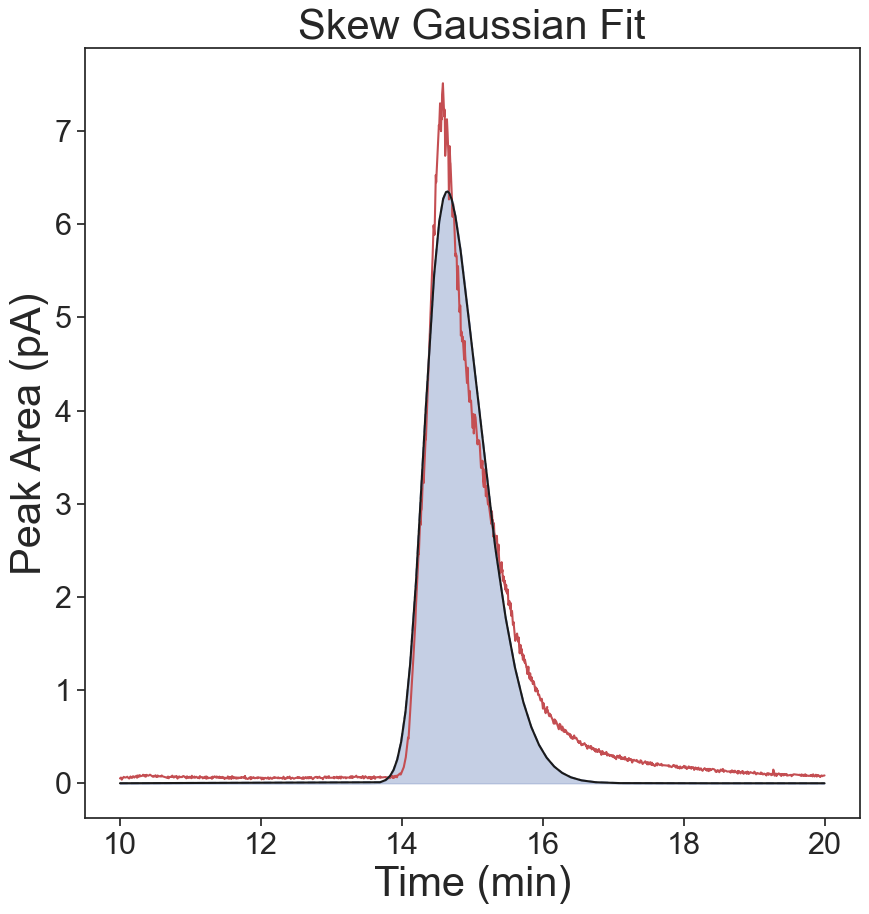

Voigt
[7.40191289]
0.42216158540099896


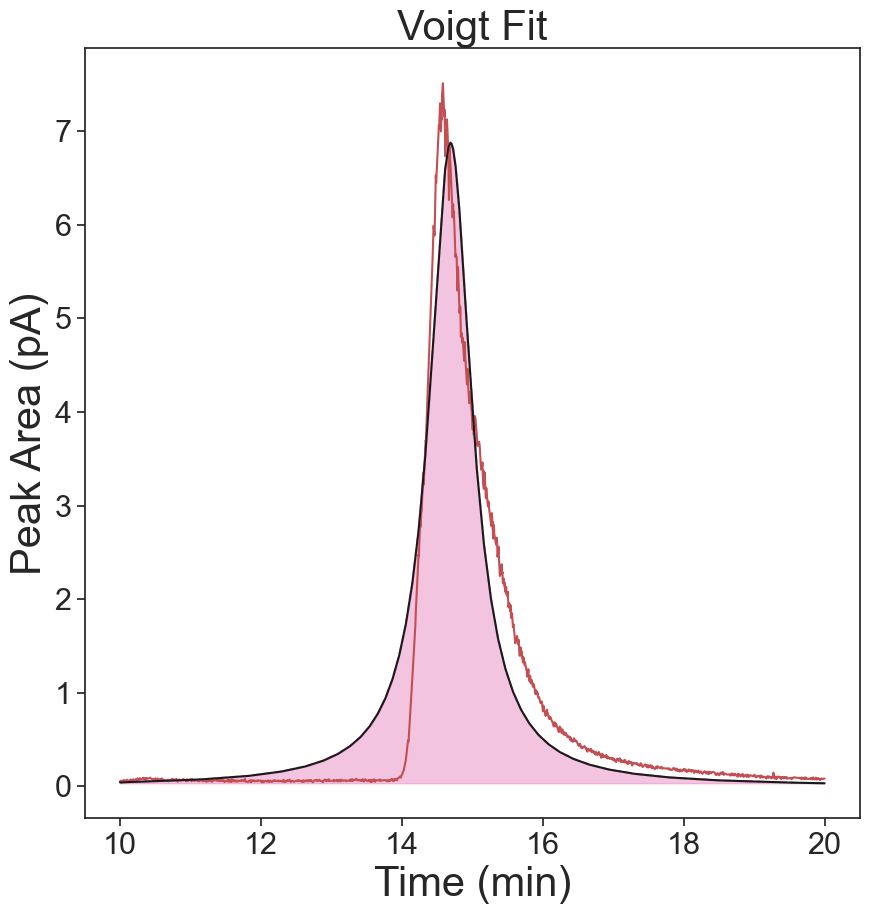

Gaussian
[12.41682688]
-783.3666342150608
-783.3666342150608
0.9341243697827558


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


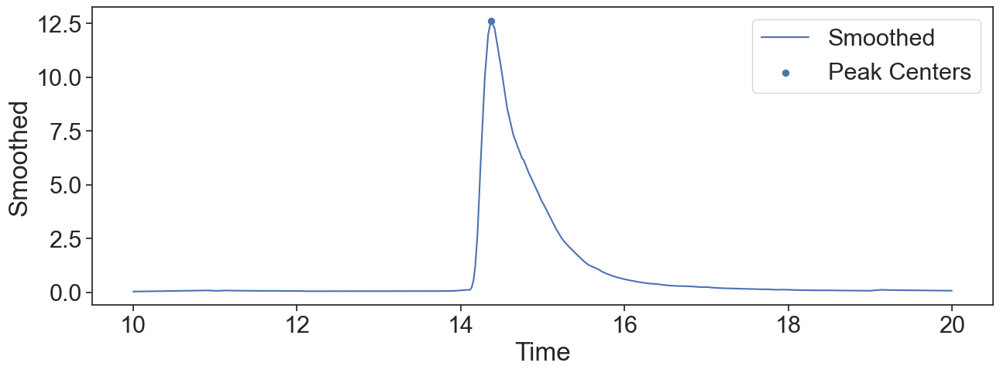

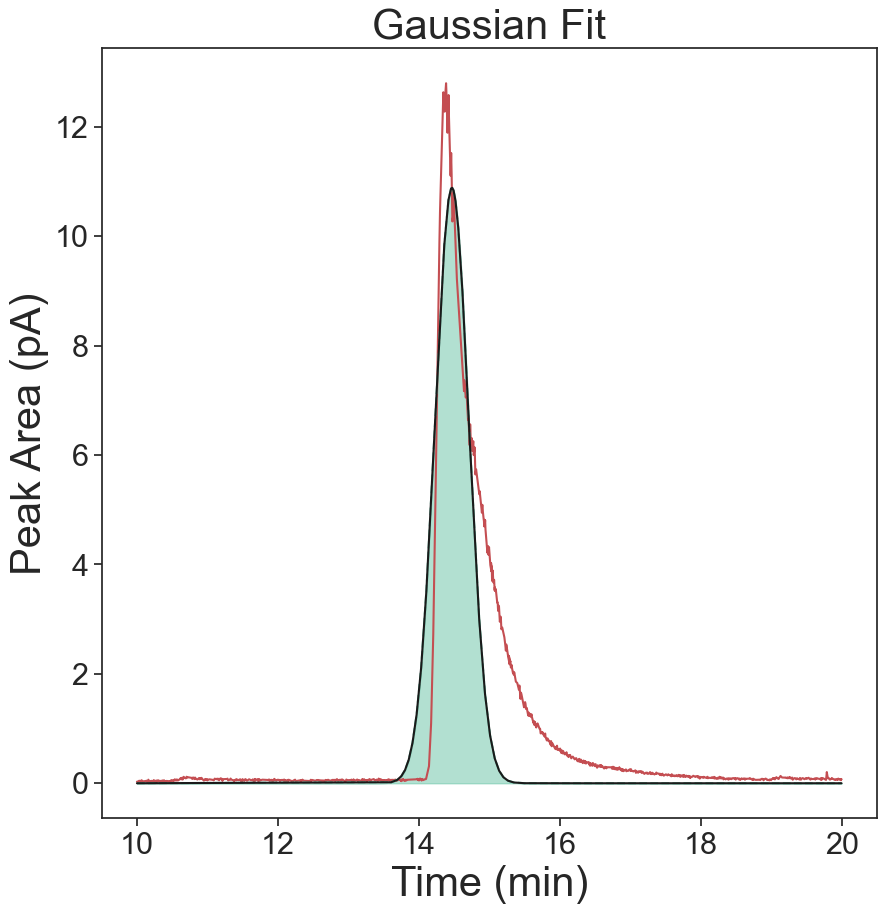

Exp Gaussian
[12.41682688]
0.1117270356526143


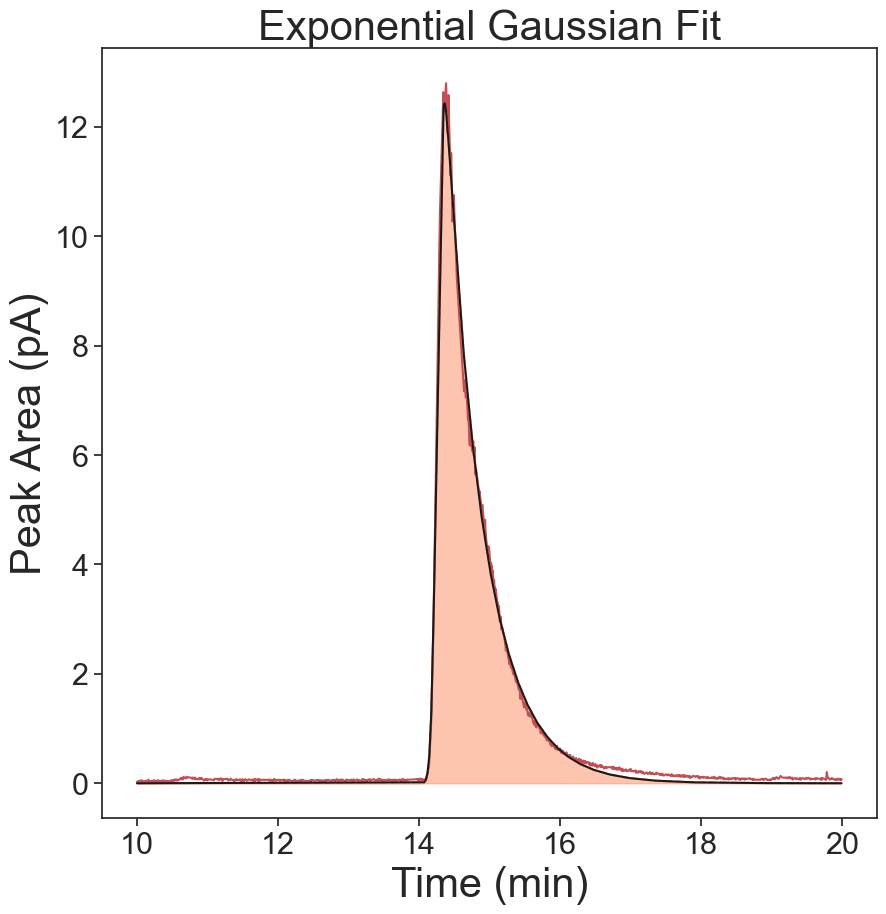

Skew Gaussian
[12.41682688]
0.6036021503476476


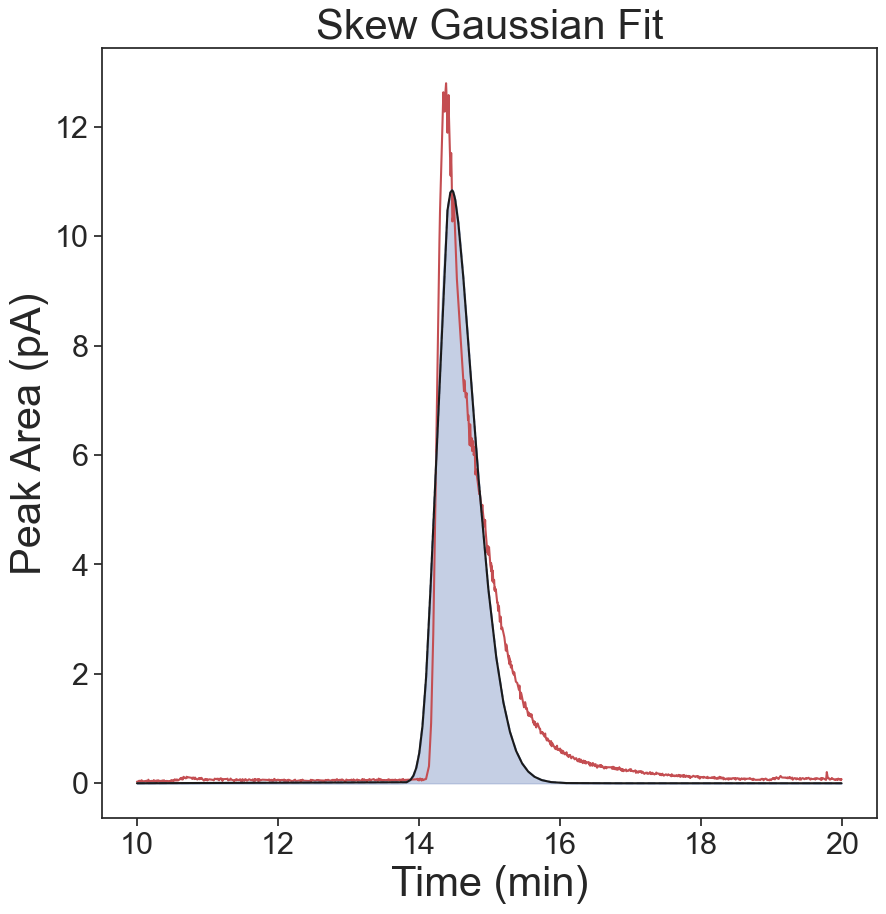

Voigt
[12.41682688]
0.8185852150894024


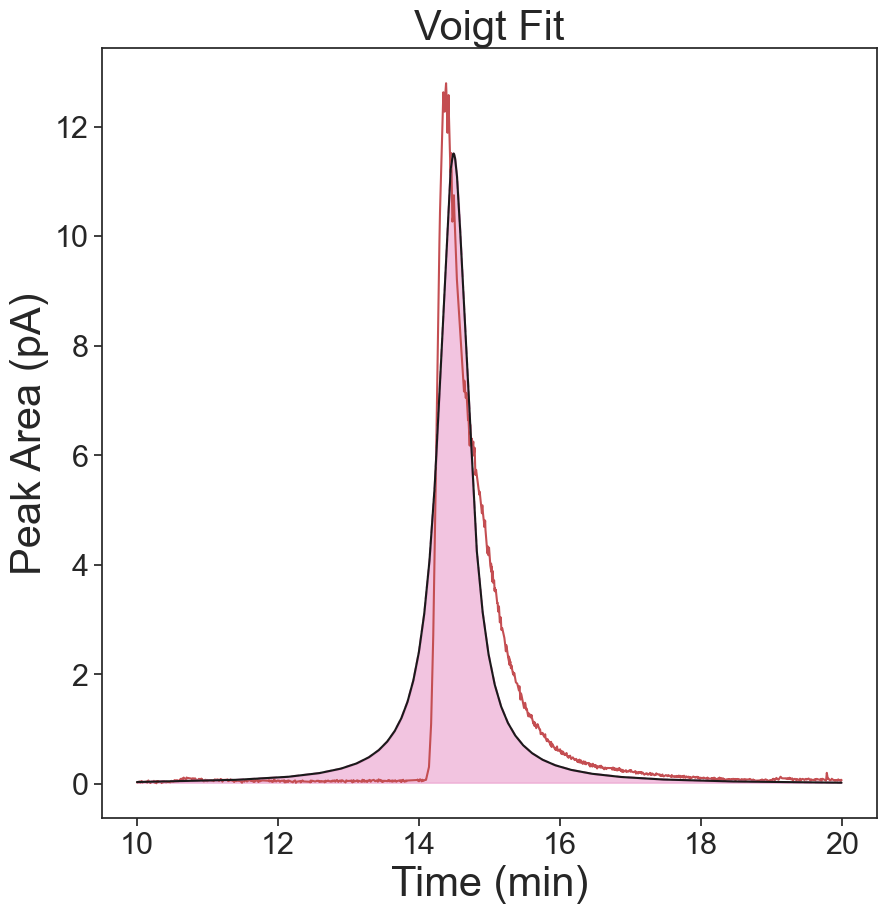

/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


Gaussian
[13.44804611]
-332.40097671427924
-332.40097671427924
0.9702716185571789


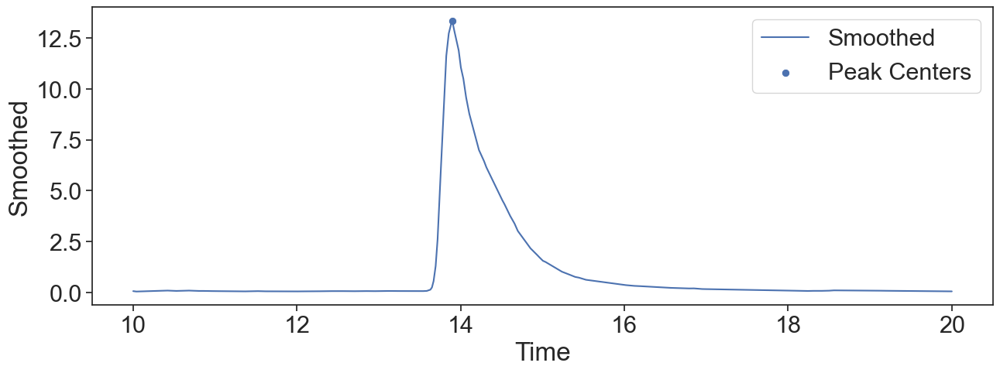

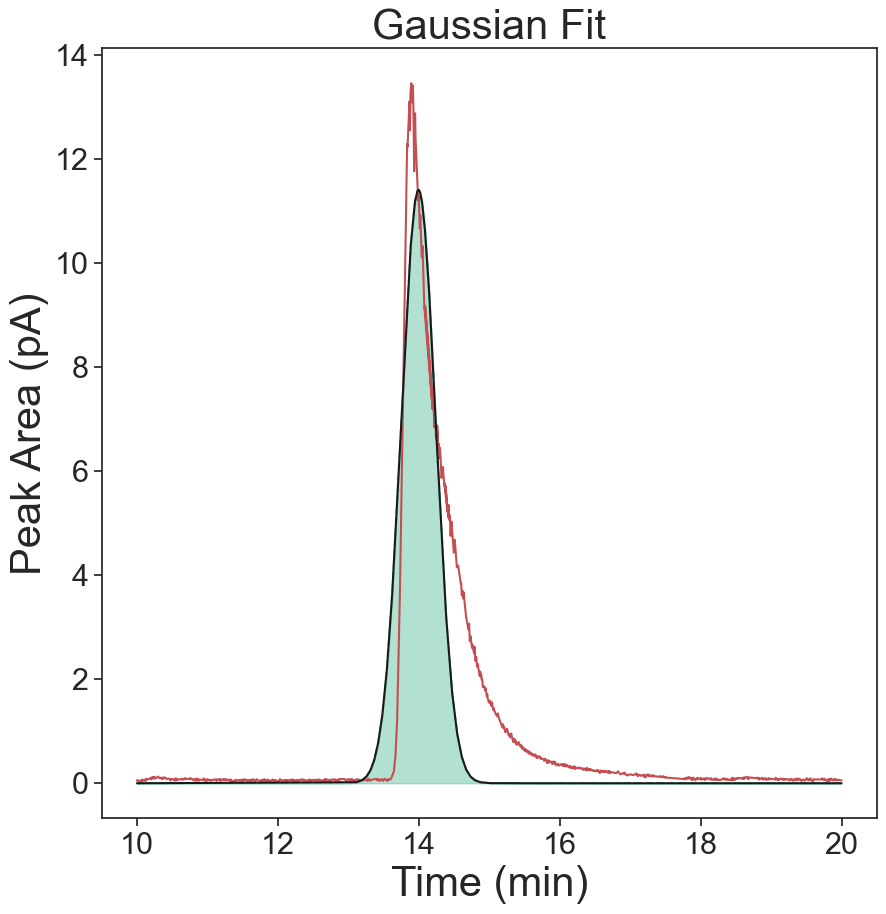

Exp Gaussian
[13.44804611]
0.11221707256394062


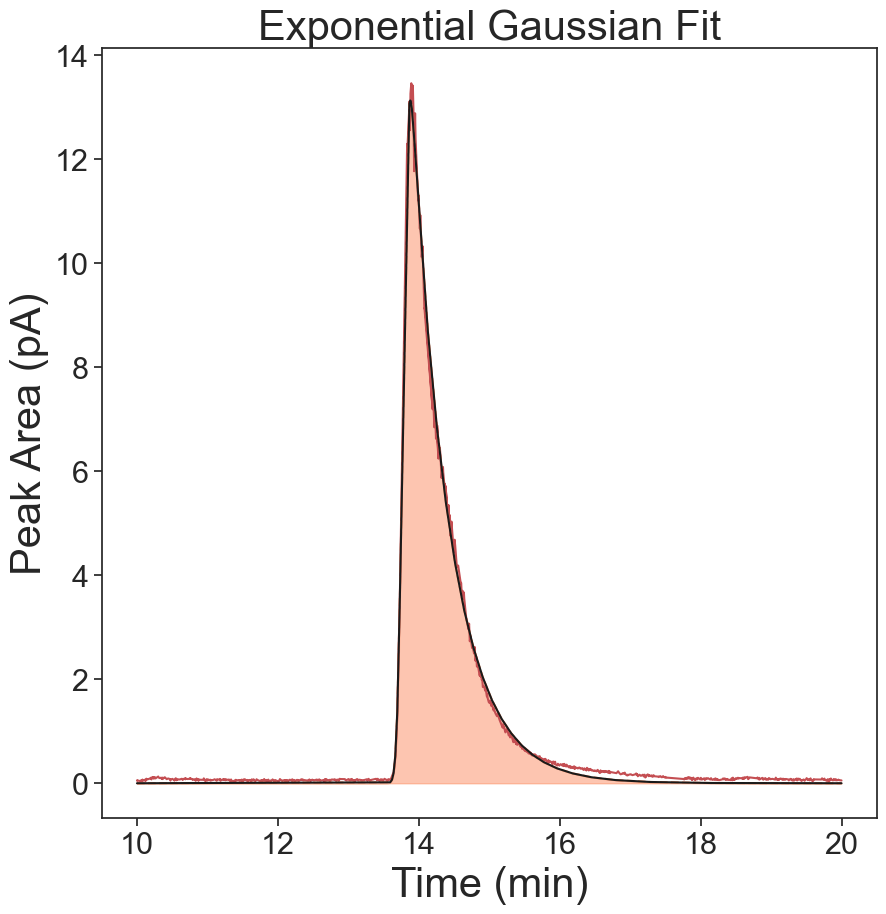

Skew Gaussian
[13.44804611]
0.6384452995549678


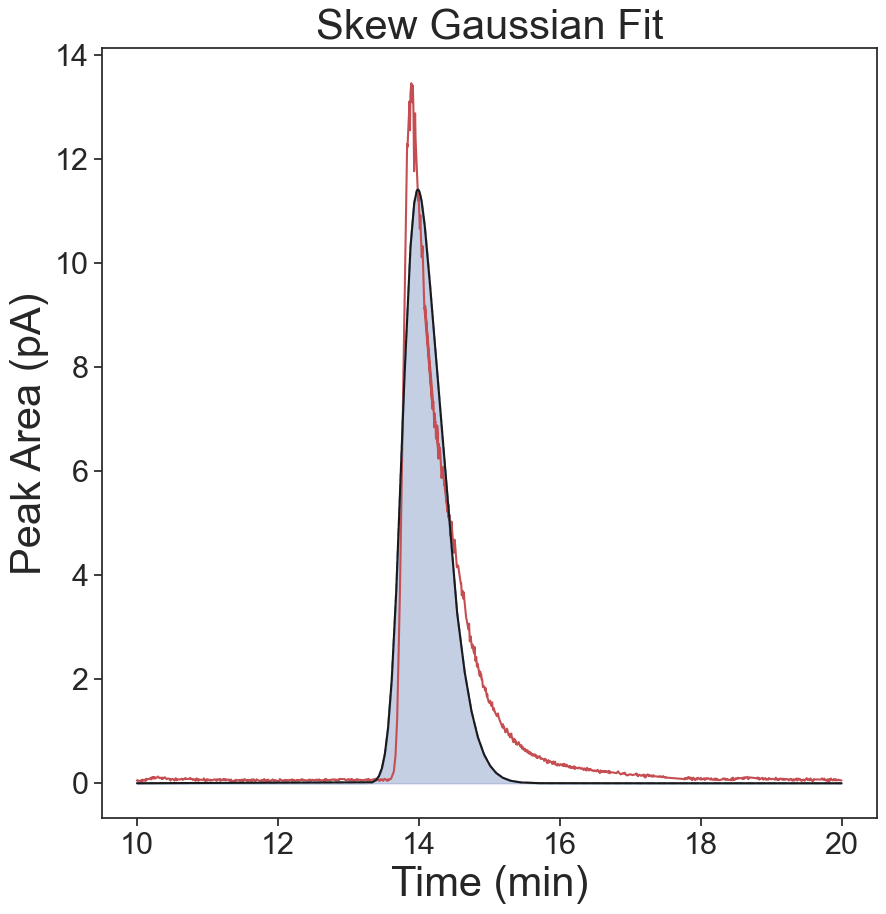

Voigt
[13.44804611]
0.865832074152155


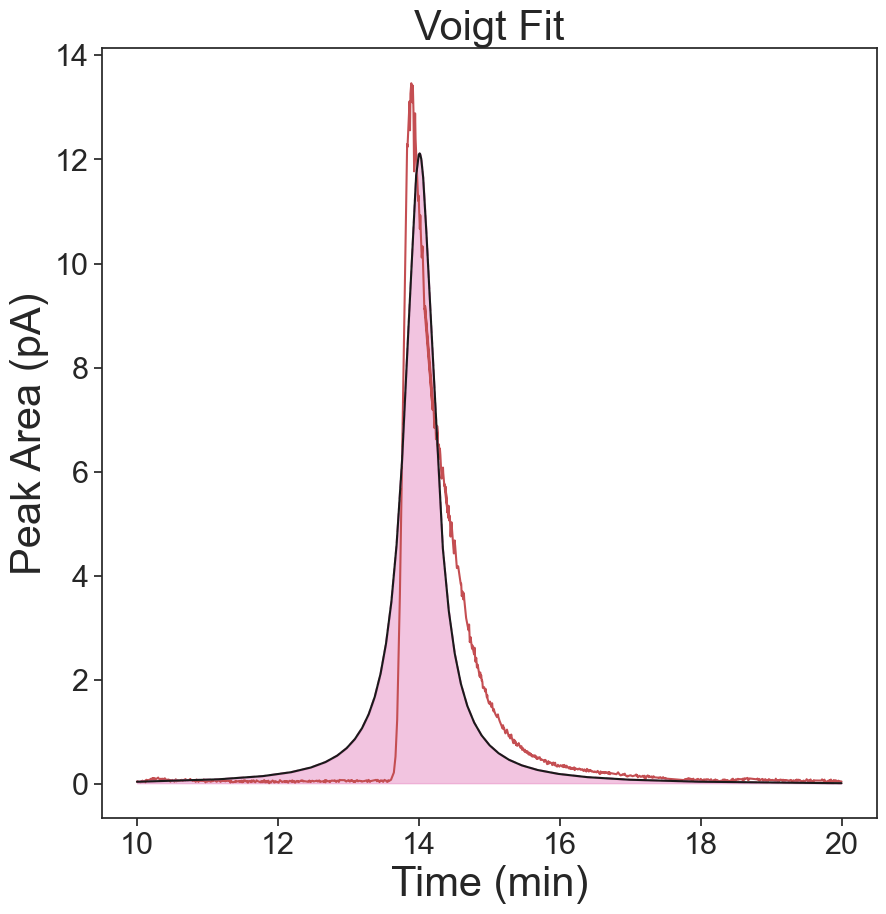

Gaussian
[13.49211694]
-216.37113036654762
-216.37113036654762
0.9797961286534057


/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:461: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[:, 'Smoothed']=savgol_filter(data["Value"].copy(), window_length=51, polyorder=3, deriv=0)
/var/folders/6c/5bxs10ps1rgc_ff8r24b_x0c0000gp/T/ipykernel_27918/584517974.py:465: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Inverse Smoothed"]=data['Smoothed']*-1+50


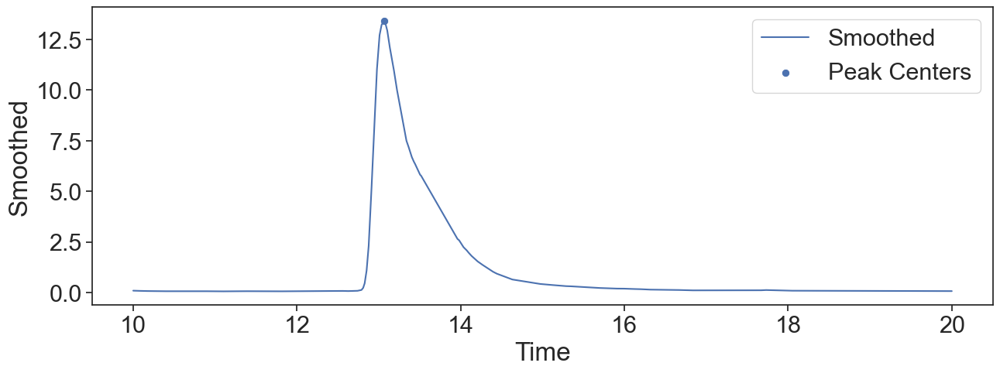

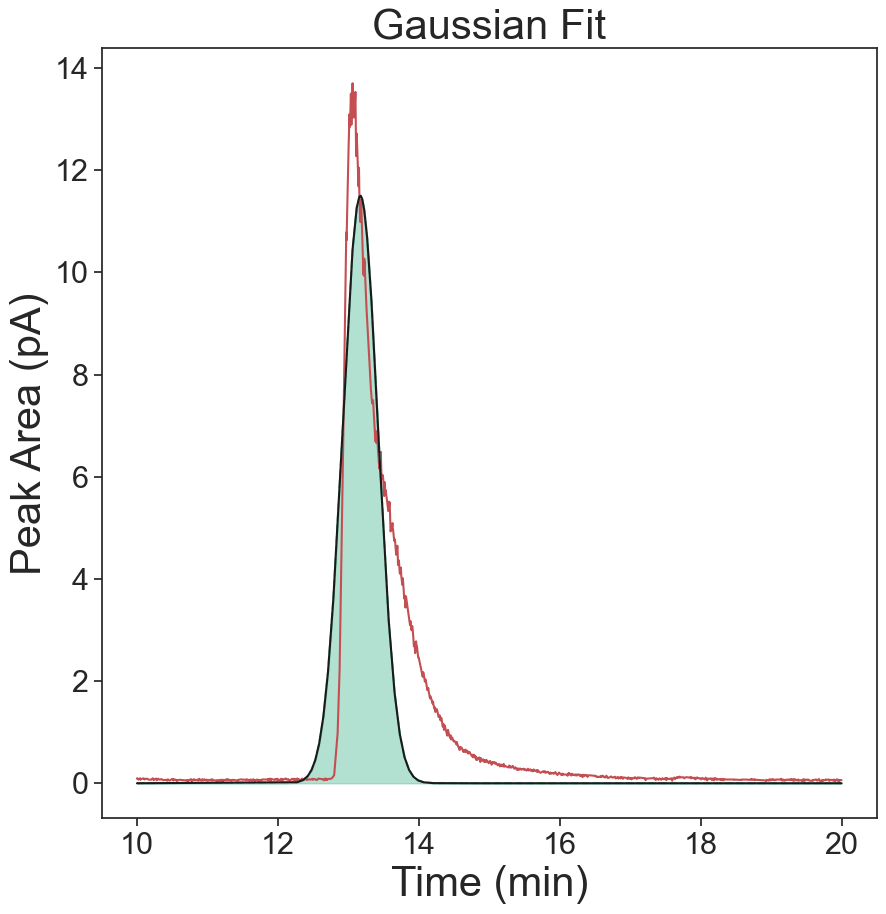

Exp Gaussian
[13.49211694]
0.1292085161443348


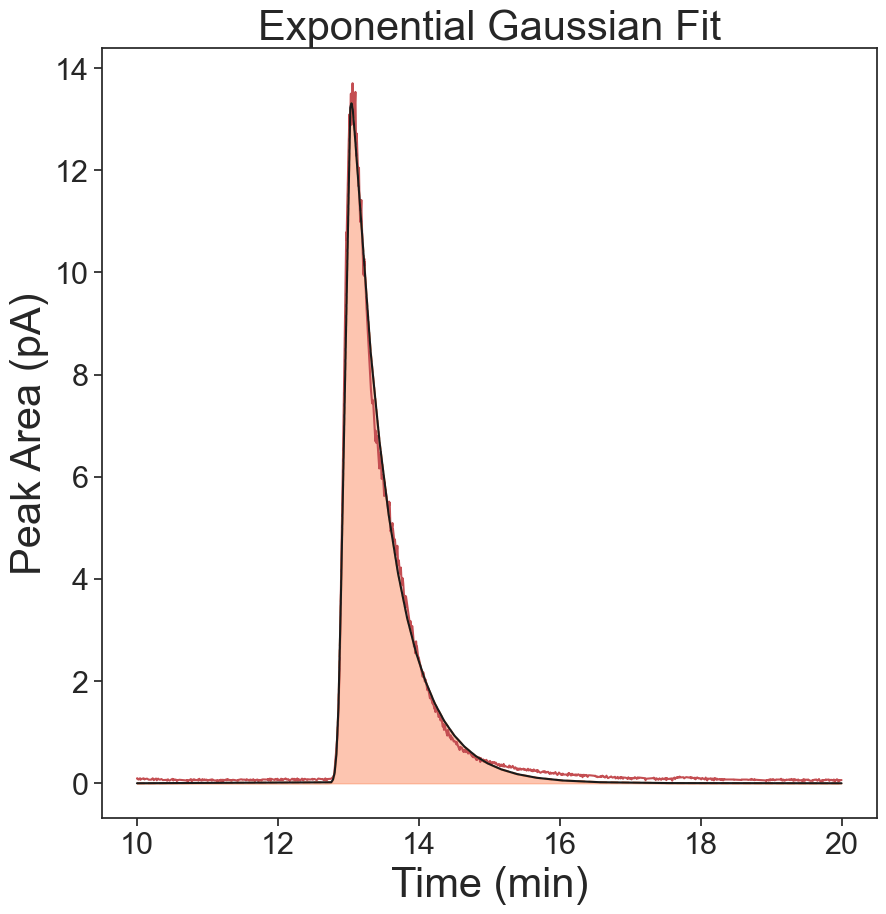

Skew Gaussian
[13.49211694]
0.6661589210831351


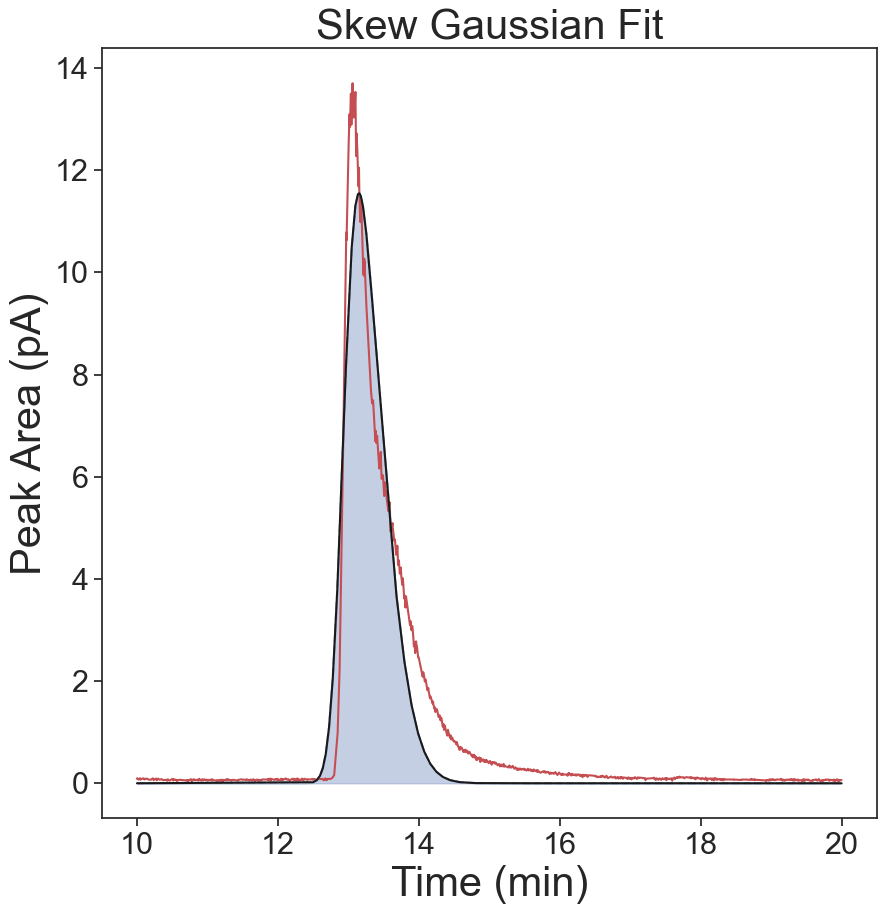

Voigt
[13.49211694]
0.8836214357578619


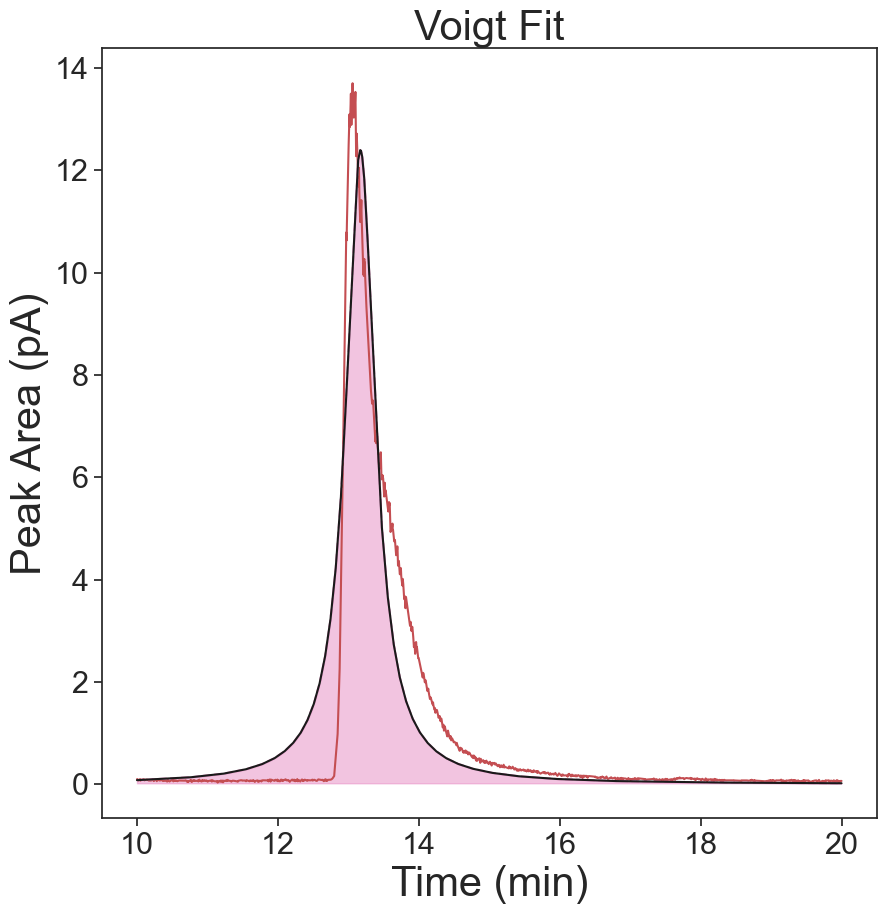

In [29]:
big_array=[]

type_list=["Gaussian","Skew Gaussian","Exponential Gaussian","Voigt"]
for name in ["ara_alone5","ara_alone5_2","ara_alone5_3","ara_alone5_4","ara_alone5_5",
            "ara_alone10","ara_alone10_2","ara_alone10_3","ara_alone10_4","ara_alone10_5",
             "dha_alone5","dha_alone5_2","dha_alone5_3","dha_alone5_4","dha_alone5_5",
            "dha_alone10","dha_alone10_2","dha_alone10_3","dha_alone10_4","dha_alone10_5",
              "la_alone5","la_alone5_2","la_alone5_3","la_alone5_4","la_alone5_5",
            "la_alone10","la_alone10_2","la_alone10_3","la_alone10_4","la_alone10_5"]:  
    a=find_peak_areas(hplc,10,20,name)

    for x,z in zip(a,type_list):
        if 'ara' in name:
            compound="C20:4"
        elif 'la' in name:
            compound="C18:2"
        else:
            compound="C22:6"
        if '5' in name:
            concentration="0.5 mg/mL"
        else:
            concentration="1 mg/mL"
        big_array.append({"Distribution":z,"RMSE":x[0][2],"Compound":compound,"Concentration":concentration,"Name":name})



In [31]:
rmse=pd.DataFrame(big_array)


In [32]:
rmse

,Distribution,RMSE,Compound,Concentration,Name
0,Gaussian,-16639.537311,C20:4,0.5 mg/mL,ara_alone5
1,Skew Gaussian,-35518.929514,C20:4,0.5 mg/mL,ara_alone5
2,Exponential Gaussian,-21321.372764,C20:4,0.5 mg/mL,ara_alone5
3,Voigt,-17677.610789,C20:4,0.5 mg/mL,ara_alone5
4,Gaussian,-18180.708730,C20:4,0.5 mg/mL,ara_alone5_2
...,...,...,...,...,...
115,Voigt,-1685.127855,C18:2,1 mg/mL,la_alone10_4
116,Gaussian,-216.371130,C18:2,0.5 mg/mL,la_alone10_5
117,Skew Gaussian,-24271.524132,C18:2,0.5 mg/mL,la_alone10_5
118,Exponential Gaussian,-4790.407320,C18:2,0.5 mg/mL,la_alone10_5


# Figure 2D 
This is just a pooling of BIC data from individual fits above 

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

1 mg/mL_Exponential Gaussian v.s. 1 mg/mL_Voigt: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.138e-01 U_stat=4.000e+01
0.5 mg/mL_Exponential Gaussian v.s. 0.5 mg/mL_Voigt: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.851e-01 U_stat=1.030e+02
0.5 mg/mL_Skew Gaussian v.s. 0.5 mg/mL_Exponential Gaussian: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.168e-06 U_stat=8.000e+00
1 mg/mL_Skew Gaussian v.s. 1 mg/mL_Exponential Gaussian: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.195e-04 U_stat=0.000e+00
0.5 mg/mL_Gaussian v.s. 0.5 mg/mL_Exponential Gaussian: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.543e-01 U_stat=2.330e+02
1 mg/mL_Gaussian v.s. 1 mg/mL_Exponential Gaussian: Mann-Whitney-Wilco

(<Axes: xlabel='Compound Concentration', ylabel='Bayesian Information Criteria (BIC)'>,
  <statannot.StatResult.StatResult at 0x7fee75afab80>])

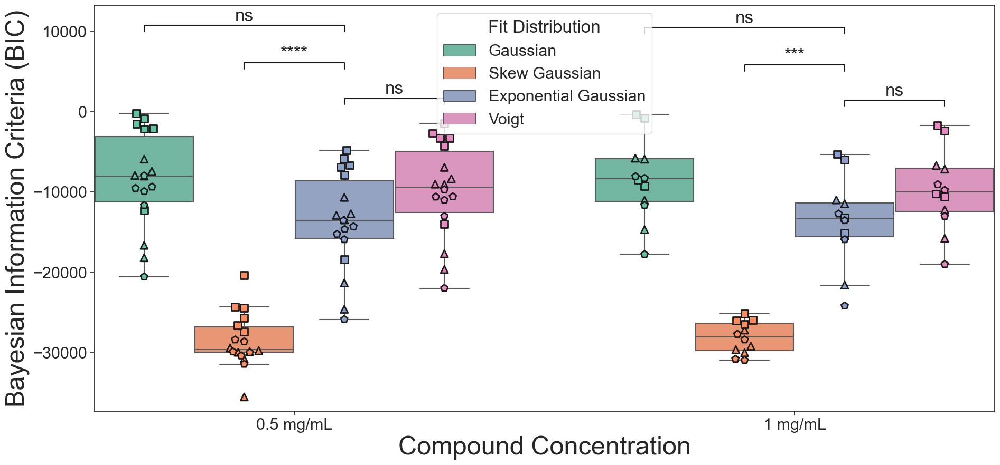

In [33]:
fig,ax=plt.subplots(1,1,figsize=(22,10))

# dummy plots, just to get the Path objects


sns.boxplot(data=rmse,x="Concentration",y="RMSE",hue="Distribution",ax=ax,palette=['#66c2a5','#fc8d62','#8da0cb','#e78ac3'])


sns.swarmplot(data=rmse[rmse.Compound=="C20:4"],x="Concentration",y="RMSE",hue="Distribution",dodge=True,edgecolor='k',size=10,linewidth=2,ax=ax,palette=['#66c2a5','#fc8d62','#8da0cb','#e78ac3']
,legend=False,marker='^')

sns.swarmplot(data=rmse[rmse.Compound=="C18:2"],x="Concentration",y="RMSE",hue="Distribution",dodge=True,edgecolor='k',size=10,linewidth=2,ax=ax,palette=['#66c2a5','#fc8d62','#8da0cb','#e78ac3']
,legend=False,marker='s')

sns.swarmplot(data=rmse[rmse.Compound=="C22:6"],x="Concentration",y="RMSE",hue="Distribution",dodge=True,edgecolor='k',size=10,linewidth=2,ax=ax,palette=['#66c2a5','#fc8d62','#8da0cb','#e78ac3']
,legend=False,marker='p')




              
ax.set_ylabel("Bayesian Information Criteria (BIC)",size=35)
ax.set_xlabel("Compound Concentration",size=35)  
ax.legend(title='Fit Distribution',loc='upper center')
box_pairs=[
    (("0.5 mg/mL","Exponential Gaussian"),("0.5 mg/mL","Gaussian")),
    (("0.5 mg/mL","Exponential Gaussian"),("0.5 mg/mL","Voigt")),
    (("0.5 mg/mL","Exponential Gaussian"),("0.5 mg/mL","Skew Gaussian")),

    (("1 mg/mL","Exponential Gaussian"),("1 mg/mL","Gaussian")),
    (("1 mg/mL","Exponential Gaussian"),("1 mg/mL","Voigt")),
    (("1 mg/mL","Exponential Gaussian"),("1 mg/mL","Skew Gaussian")),
    


    
]
add_stat_annotation(ax=ax,data=rmse, x="Concentration", y='RMSE', hue="Distribution",
                    box_pairs=box_pairs,
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=2,color='k')
